In [2]:
pwd

'C:\\Users\\Msfin\\cloned_repositories\\CA1-interneuron-GLM\\Clean_notebooks_to_date'

In [1]:
# import sys
# import os

# sys.path.append(r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM")
# from GLM_regression import *
# from functions_plotting_reconstruction_MSE import *
# import pickle
# import os
# import numpy as np
# import matplotlib.pyplot as plt
# import os
# import torch
# import slicetca
# import h5py
# import utils as ut
# import plot as pt
# import warnings
# plt.rcParams.update({'font.size': 12,
#                      'axes.spines.right': False,
#                      'axes.spines.top':   False,
#                      'legend.frameon':    False,})

# %load_ext autoreload
# %autoreload 

C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\utils.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [1]:
import sys
from scipy.stats import sem
sys.path.append(r'C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM')

from utils_TCA_clustering_scratchpad import *
from GLM_regression_plotting import *


from modelling_to_date_utils import *

C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\utils.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
activity_dict, double_predicted_activity_dict_NDNF_new, filtered_factors_dict, double_new_NDNF_activity_dict, double_new_NDNF_velocity_dict, double_residual_activity_dict_NDNF_new = load_data_double(name="NDNFanalC", double_track=False)
# activity_dict, filtered_factors_dict, double_new_NDNF_activity_dict_100, double_new_NDNF_velocity_dict_100, double_residual_activity_dict_NDNF_new_100 = load_data_double(name="NDNFanalC", double_track=True)

GLM_params, activity_dict, double_predicted_activity_dict_NDNF_new, factors_dict, filtered_factors_dict, residual_activity_dict_NDNF_new = load_data_regular(name="NDNFanalC", new_NDNF=True)
GLM_params_old_NDNF, activity_dict_old_NDNF, double_predicted_activity_dict_NDNF_old, factors_dict_old_NDNF, filtered_factors_dict_old_NDNF, residual_activity_dict_NDNF_old = load_data_regular(name="NDNFindivsomata_GLM", new_NDNF=False)
GLM_params_SST, activity_dict_SST, double_predicted_activity_dict_SST, factors_dict_SST, filtered_factors_dict_SST, residual_activity_dict_SST = load_data_regular(name="SSTindivsomata_GLM", new_NDNF=False)
GLM_params_EC, activity_dict_EC, double_predicted_activity_dict_EC, factors_dict_EC, filtered_factors_dict_EC, residual_activity_dict_EC = load_data_regular(name="EC_GLM", new_NDNF=False)


GLM_params_NDNF_newest, activity_dict_NDNF_newest, double_predicted_activity_dict_NDNF_newest, factors_dict_NDNF_newest, filtered_factors_dict_NDNF_newest, residual_activity_dict_NDNF_newest = load_data_regular(name="NDNF_E1A1B", new_NDNF=True)

fixed_residual_activity_dict_NDNF_new = {}

for idx, animal in enumerate(residual_activity_dict_NDNF_new):
    if idx > 8:  # Only include animals with idx > 8
        cell_fixed_residual_activity_dict_NDNF_new = {}
        for cell in residual_activity_dict_NDNF_new[animal]:
            cell_fixed_residual_activity_dict_NDNF_new[cell] = residual_activity_dict_NDNF_new[animal][cell]
        fixed_residual_activity_dict_NDNF_new[animal] = cell_fixed_residual_activity_dict_NDNF_new

        
fixed_activity_dict_NDNF = {}

for idx, animal in enumerate(activity_dict):
    if idx > 8:  # Only include animals with idx > 8
        cell_fixed_residual_activity_dict_NDNF_new = {}
        for cell in activity_dict[animal]:
            cell_fixed_residual_activity_dict_NDNF_new[cell] = activity_dict[animal][cell]
        fixed_activity_dict_NDNF[animal] = cell_fixed_residual_activity_dict_NDNF_new


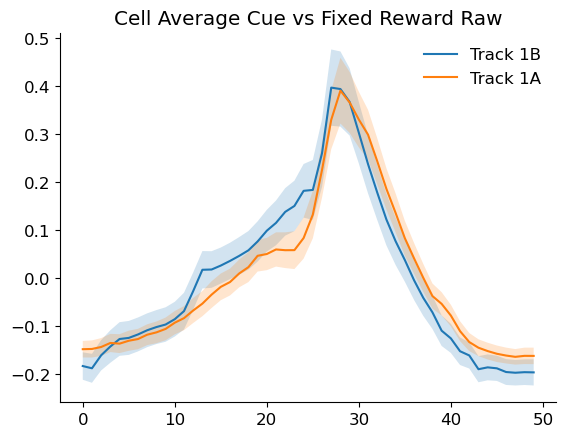

In [4]:

        
        
compare_belts(activity_dict_NDNF_newest)
            
        
    

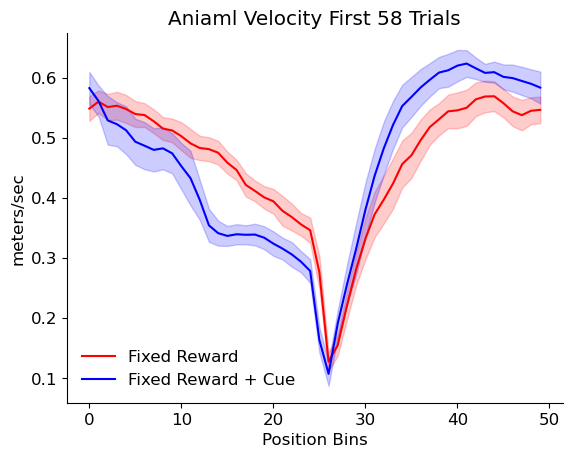

In [6]:


plot_NDNF_velocity(filtered_factors_dict_NDNF_newest):


In [8]:
def loss_fn(params):
    ndnf_sf, sst_sf = params
    summed = EC - (ndnf_sf * NDNF + sst_sf * SST)
    
    # Main loss: how well EC is canceled
    main_loss = np.mean(np.abs(summed))  # or try np.mean(summed**2)

    # Penalty for unequal scale factors
    equal_scaling_penalty = np.abs(ndnf_sf - sst_sf)

    # Total loss = main loss + lambda * penalty
    return main_loss + 50 * equal_scaling_penalty  # adjust 0.1 if needed

def get_dend_VM_cell_type(residual_activity_dict, mean_new_average_vel_array, GLM_params, dend_sf, amplitude=-5, vel=23, norm=False, add_vel_contribution=False, const_vel=True):

    dendrite = np.zeros((50, 58))
    
    dendrite_list = []

    for animal in residual_activity_dict:
        for cell in residual_activity_dict[animal]:
            data = residual_activity_dict[animal][cell]
            data = data[:,:58]

            weights = GLM_params[animal][cell]['weights']["Velocity"]
            intercept = GLM_params[animal][cell]['intercept']

            if const_vel:
                animal_velocity = np.full((50, 58), vel)
                
                data = data + (weights * animal_velocity) + intercept
                
                

            elif add_vel_contribution:
                animal_velocity = np.tile(mean_new_average_vel_array[:, np.newaxis], (1, 58))

                data = data + (weights * animal_velocity) + intercept

            else:
                data = data #+ intercept
                animal_velocity = np.tile(mean_new_average_vel_array[:, np.newaxis], (1, 58))
                
            if norm == "min_max":
                data = normalize(data, norm='min_max', per_cell=False) * 10

            dendrite += data
            dendrite_list.append(data)

    dendrite = dendrite * dend_sf
    
    return dendrite, animal_velocity, dendrite_list


def get_real_velocity_array(filtered_factors_dict_EC):
    new_average_vel = []

    for animal in filtered_factors_dict_EC:
        for cell in filtered_factors_dict_EC[animal]:
            new_average_vel.append(np.mean(filtered_factors_dict_EC[animal][cell], axis=1))

    for animal in filtered_factors_dict_SST:
        for cell in filtered_factors_dict_SST[animal]:
            new_average_vel.append(np.mean(filtered_factors_dict_SST[animal][cell], axis=1))

    for idx, animal in enumerate(filtered_factors_dict):
        if idx > 8:
            for cell in filtered_factors_dict[animal]:
                new_average_vel.append(np.mean(filtered_factors_dict[animal][cell], axis=1))


    new_average_vel_array = np.array(new_average_vel)
    mean_new_average_vel_array = np.mean(new_average_vel_array, axis=0)
    
    return mean_new_average_vel_array


mean_new_average_vel_array = get_real_velocity_array(filtered_factors_dict_EC)

Optimal NDNF_sf: 3.964395035717997
Optimal SST_sf: 3.9643950336931955


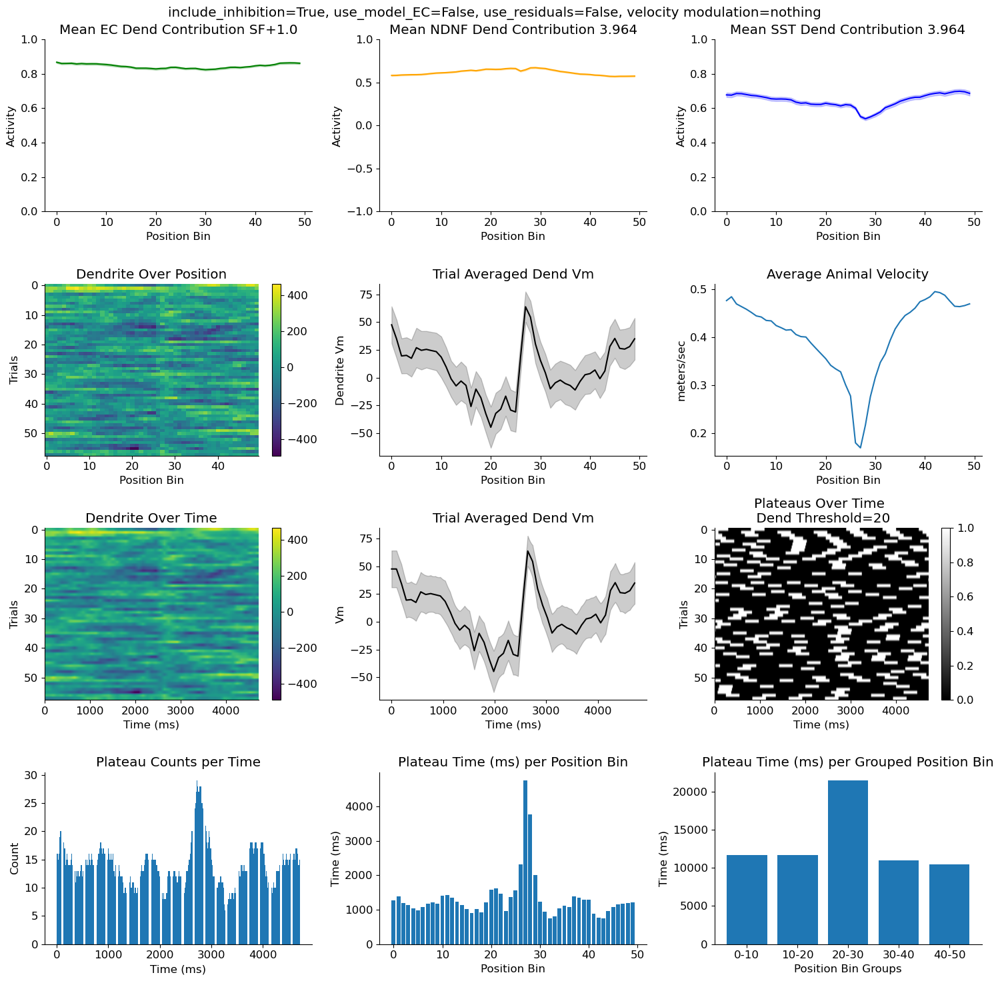

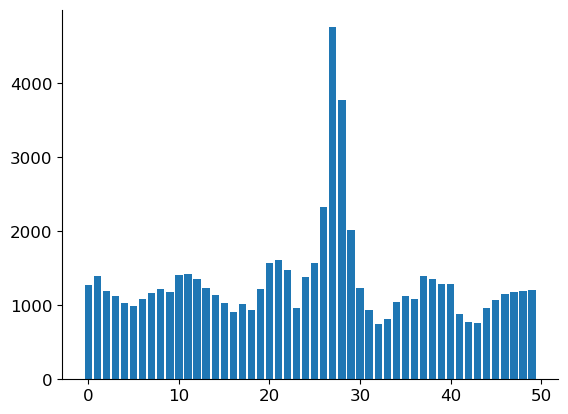

In [11]:
from scipy.optimize import minimize
# Optimal NDNF_sf: 3.9426020962469455
# Optimal SST_sf: 3.942602096880944

include_inhibition=True

use_model_EC = False

use_residuals= True

#real, nothing or constant
vel_applied = "nothing"

dx = 180/50
    
dend_threshold=20



if vel_applied=="real":

    if use_residuals:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)

    else:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)

elif vel_applied=="constant":
    if use_residuals:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)
        
    else:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)

elif vel_applied=="nothing":
    
    an_velocity = np.zeros((50,53))
    
    if use_residuals:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)
        
    else:
        dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
        
        EC = dend_contribution_EC.copy()
        NDNF = dend_contribution_NDNF.copy()
        SST = dend_contribution_SST.copy()

        result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
        NDNF_sf_opt, SST_sf_opt = result.x
        print("Optimal NDNF_sf:", NDNF_sf_opt)
        print("Optimal SST_sf:", SST_sf_opt)


        
if use_model_EC:

    dend_contribution_EC = np.zeros((summed_dendrite.shape))

    for i in range(dend_contribution_EC.shape[1]):
        for j in range(dend_contribution_EC.shape[0]):
            if j % 2 == 0:
                dend_contribution_EC[j, i] = 1

    print(dend_contribution_EC[:,0])

# NDNF_sf_opt = 3.7960282919084
# SST_sf_opt = 4.108490240597229
    
if include_inhibition:
    summed_dendrite = dend_contribution_EC - (dend_contribution_NDNF*NDNF_sf_opt + dend_contribution_SST*SST_sf_opt)
#     summed_dendrite = dend_contribution_EC - (SST_sf_opt * dend_contribution_SST*2)

else:
    summed_dendrite = dend_contribution_EC

fig, axs = plt.subplots(4, 3, figsize=(15, 15))  
plt.suptitle(f"include_inhibition={include_inhibition}, use_model_EC={use_model_EC}, use_residuals=False, velocity modulation={vel_applied}")
    
im11 = axs[1,0].imshow(summed_dendrite.T, aspect='auto')
axs[1,0].set_title("Dendrite Over Position")
axs[1,0].set_xlabel("Position Bin")
axs[1,0].set_ylabel("Trials")
fig.colorbar(im11, ax=axs[1,0])
    
if include_inhibition: 
    axs[1,2].plot(an_velocity[:,0])
    axs[1,2].set_title("Average Animal Velocity")
    axs[1,2].set_ylabel("meters/sec")
    axs[1,2].set_xlabel("Position Bin")
    
else:
    axs[0,1].plot(an_velocity[:,0])
    axs[0,1].set_title("Average Animal Velocity")
    axs[0,1].set_ylabel("meters/sec")
    axs[0,1].set_xlabel("Position Bin")




mean_dendrite = np.mean(summed_dendrite, axis=1)
sem_dendrite = sem(summed_dendrite, axis=1)

axs[1,1].plot(mean_dendrite, color='k')
axs[1,1].fill_between(range(len(mean_dendrite)), mean_dendrite+sem_dendrite, mean_dendrite-sem_dendrite, alpha=0.2, color='k')
axs[1,1].set_title("Trial Averaged Dend Vm")
axs[1,1].set_xlabel("Position Bin")
axs[1,1].set_ylabel("Dendrite Vm")




EC_normalized = dend_contribution_EC/ np.max(dend_contribution_EC)

mean_EC_dend = np.mean(EC_normalized, axis=1)
sem_EC_dend = sem(EC_normalized, axis=1)
axs[0,0].plot(mean_EC_dend, color='g', label="EC Vel")
axs[0,0].fill_between(range(len(mean_EC_dend)), mean_EC_dend+sem_EC_dend, mean_EC_dend-sem_EC_dend, alpha=0.2, color='g')
axs[0,0].set_title(f"Mean EC Dend Contribution SF+{1.0}")
axs[0,0].set_xlabel("Position Bin")
axs[0,0].set_ylabel("Activity")
axs[0,0].set_ylim(0,1)

if include_inhibition:
    
    SST_normalized = dend_contribution_SST/ np.max(dend_contribution_SST)

    mean_SST_dend = np.mean(SST_normalized, axis=1)
    sem_SST_dend = sem(SST_normalized, axis=1)
    axs[0,2].plot(mean_SST_dend, color='b', label="SST Vel")
    axs[0,2].fill_between(range(len(mean_SST_dend)), mean_SST_dend+sem_SST_dend, mean_SST_dend-sem_SST_dend, alpha=0.2, color='b')
    axs[0,2].set_title(f"Mean SST Dend Contribution {SST_sf_opt:.3f}")
    axs[0,2].set_xlabel("Position Bin")
    axs[0,2].set_ylabel("Activity")
    axs[0,2].set_ylim(0,1)
    
    NDNF_normalized = dend_contribution_NDNF/ np.max(dend_contribution_NDNF)

    mean_NDNF_dend = np.mean(NDNF_normalized, axis=1)
    sem_NDNF_dend = sem(NDNF_normalized, axis=1)
    axs[0,1].plot(mean_NDNF_dend, color='orange', label="NDNF Vel")
#     axs[0,1].plot(np.zeros(50), color='orange', label="NDNF Vel")
    axs[0,1].fill_between(range(len(mean_NDNF_dend)), mean_NDNF_dend+sem_NDNF_dend, mean_NDNF_dend-sem_NDNF_dend, alpha=0.2, color='orange')
    axs[0,1].set_title(f"Mean NDNF Dend Contribution {NDNF_sf_opt:.3f}")
    axs[0,1].set_xlabel("Position Bin")
    axs[0,1].set_ylabel("Activity")
    axs[0,1].set_ylim(-1,1)



animal_velocity_constant = np.full((summed_dendrite.shape), 23)
total_time_sec = 4.71657036 

dt=total_time_sec/50
dx=180/50

animal_velocity_constant= np.full((summed_dendrite.shape), dx/dt)

dt_constant = 0.001
dt = dx / animal_velocity_constant
time_bins = np.cumsum(dt, axis=0)
time_bins_ms = time_bins * 1

num_trials = summed_dendrite.shape[1]
trial_warped_activity = []
max_len = 0

for t in range(num_trials):
    if np.any(np.isnan(time_bins[:, t])):
        continue
    total_time = time_bins[-1, t]

    time_axis_constant = np.arange(0, total_time, dt_constant)
    
    firing = summed_dendrite[:, t]

    warped_firing = np.interp(time_axis_constant, time_bins_ms[:,t], firing)

    trial_warped_activity.append(warped_firing)
    if len(warped_firing) > max_len:
        max_len = len(warped_firing)
            
padded_warped_activity = np.full((num_trials, max_len), np.nan) 
for i, trace in enumerate(trial_warped_activity):
    padded_warped_activity[i, :len(trace)] = trace

    
    
mean_dend_time = np.mean(padded_warped_activity, axis=0)
sem_dend_time = sem(padded_warped_activity, axis=0)


x_start = 0
time_bin_size_ms=1
num_bins = len(mean_dend_time)
x_end = num_bins * time_bin_size_ms 
im = axs[2,0].imshow(padded_warped_activity, aspect='auto')
axs[2,0].set_title("Dendrite Over Time")
axs[2,0].set_xlabel("Time (ms)")
axs[2,0].set_ylabel("Trials")
fig.colorbar(im, ax=axs[2,0])



# time_bin_size_ms = 100

time_bin_size_ms = 1

num_bins = len(mean_dend_time)
x_time_ms = np.arange(num_bins) * time_bin_size_ms  # x-axis in ms

axs[2,1].plot(x_time_ms, mean_dend_time, color='k')
axs[2,1].fill_between(x_time_ms, mean_dend_time+sem_dend_time, mean_dend_time-sem_dend_time, color='k', alpha=0.2)
axs[2,1].set_title("Trial Averaged Dend Vm")
axs[2,1].set_xlabel("Time (ms)")
axs[2,1].set_ylabel("Vm")


position_bins, num_trials = animal_velocity_constant.shape


flat_padded_warped_activity = padded_warped_activity.flatten()
flat_plateau_array = np.zeros_like(flat_padded_warped_activity)

i = 0
while i < len(flat_padded_warped_activity):
    if flat_padded_warped_activity[i] > dend_threshold:
        flat_plateau_array[i:i+300] = 1
        
        i += 800
    else:
        i += 100


plateau_array = flat_plateau_array.reshape(padded_warped_activity.shape)

im2 = axs[2,2].imshow(plateau_array, aspect='auto', interpolation=None, cmap="gray")
axs[2,2].set_title(f"Plateaus Over Time \n Dend Threshold={dend_threshold}")
axs[2,2].set_xlabel("Time (ms)")
axs[2,2].set_ylabel("Trials")
fig.colorbar(im2, ax=axs[2,2])

plateau_counts_per_time = np.sum(plateau_array, axis=0)
axs[3,0].bar(range(len(plateau_counts_per_time)), plateau_counts_per_time)
axs[3,0].set_xlabel("Time (ms)")
axs[3,0].set_ylabel("Count")
axs[3,0].set_title("Plateau Counts per Time")


num_time_bins = padded_warped_activity.shape[1]

plateau_positions_counter = np.zeros(50)

time_in_bin_counter = np.zeros(50)

animal_velocity = an_velocity * 100

if vel_applied=="nothing":
    animal_velocity= mean_new_average_vel_array[:, None] * np.ones((1, summed_dendrite.shape[1])) *100
    

for trial in range(plateau_array.shape[0]):
    
    velocity_trial = animal_velocity[:, trial]  
    
  
    dt_trial = dx / velocity_trial  # in seconds
    time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])
    
    time_bins = np.arange(num_time_bins) * dt_constant  

    for t_idx, time_bin in enumerate(time_bins):
        if plateau_array[trial, t_idx] == 1:
            for pos_idx in range(50):
                if time_each_pos_bin_starts[pos_idx] <= time_bin < time_each_pos_bin_starts[pos_idx + 1]:
                    plateau_positions_counter[pos_idx] += 1
                    break

     
    for t_idx, time_bin in enumerate(time_bins):
        for pos_idx in range(50):
            if time_each_pos_bin_starts[pos_idx] <= time_bin < time_each_pos_bin_starts[pos_idx + 1]:
                time_in_bin_counter[pos_idx] += 1
                break
                            

axs[3,1].bar(range(len(plateau_positions_counter)), plateau_positions_counter)
axs[3,1].set_title("Plateau Time (ms) per Position Bin")
axs[3,1].set_ylabel("Time (ms)")
axs[3,1].set_xlabel("Position Bin")

bin_size = 10
grouped_counts = [np.sum(plateau_positions_counter[i:i+bin_size]) for i in range(0, len(plateau_positions_counter), bin_size)]

axs[3,2].bar(range(len(grouped_counts)), grouped_counts)
axs[3,2].set_xticks(np.arange(5), ["0-10", "10-20", "20-30", "30-40", "40-50"])
axs[3,2].set_xlabel(f"Position Bin Groups")
axs[3,2].set_ylabel("Time (ms)")
axs[3,2].set_title("Plateau Time (ms) per Grouped Position Bin")


plt.tight_layout()
plt.show()

plt.bar(range(len(plateau_positions_counter)), plateau_positions_counter)
plt.show()

In [14]:
from scipy.optimize import minimize
import random
# Optimal NDNF_sf: 3.9426020962469455
# Optimal SST_sf: 3.942602096880944


def random_timeseries(initial_value: float, volatility: float, count: int) -> list:
    time_series = [initial_value, ]
    for _ in range(count):
        time_series.append(time_series[-1] + initial_value * random.gauss(0, 1) * volatility)
    return time_series

def get_dend_contribution_single_dend(residual_activity_dict_EC, activity_dict_EC, fixed_residual_activity_dict_NDNF_new, fixed_activity_dict_NDNF, residual_activity_dict_SST, activity_dict_SST, mean_new_average_vel_array, GLM_params_EC, vel_applied="constant"):

    if vel_applied=="real":

        if use_residuals:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

        else:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

    elif vel_applied=="constant":
        if use_residuals:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

        else:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=True)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

    elif vel_applied=="nothing":

        if use_residuals:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)

        else:
            dend_contribution_EC, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
            dend_contribution_NDNF, an_velocity, dend_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)
            dend_contribution_SST, an_velocity, dend_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=False, const_vel=False)

            EC = dend_contribution_EC.copy()
            NDNF = dend_contribution_NDNF.copy()
            SST = dend_contribution_SST.copy()

            result = minimize(loss_fn, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)])
            NDNF_sf_opt, SST_sf_opt = result.x
            print("Optimal NDNF_sf:", NDNF_sf_opt)
            print("Optimal SST_sf:", SST_sf_opt)
            
    return dend_contribution_EC, dend_contribution_NDNF, dend_contribution_SST, an_velocity, NDNF_sf_opt, SST_sf_opt
        

def setup_single_dendrite(dend_contribution_EC, dend_contribution_NDNF, dend_contribution_SST, an_velocity, NDNF_sf_opt, SST_sf_opt, use_model_EC=False, include_inhibition=False, use_residuals=False, dend_threshold=0.75):
        
    if use_model_EC:
     

        ts_list = []
        for i in range(58):
            ts = random_timeseries(1.0, 0.005, 49)
            ts_list.append(ts)

        dend_contribution_EC = np.array(ts_list).T
        print(dend_contribution_EC.shape)
        

#         pos_bins = 50
#         trials = 58
#         dend_contribution_EC = np.zeros((pos_bins, trials))

#         # Fixed Gaussian centers
#         base_centers = np.arange(2, pos_bins, 5)  # bin 2, 7, 12, ..., 47
#         width = 2.0

#         for i in range(trials):
#             for center in base_centers:
#                 # Add jitter to the center (±1 bin)
#                 jittered_center = center + np.random.choice([-1, 0, 1])

#                 # Make sure jittered center stays within bounds
#                 jittered_center = np.clip(jittered_center, 0, pos_bins - 1)

#                 amplitude = np.random.uniform(0.8, 1.2)  # still jitter amplitude too
#                 gaussian = norm.pdf(np.arange(pos_bins), loc=jittered_center, scale=width)
#                 gaussian /= np.max(gaussian)
#                 dend_contribution_EC[:, i] += amplitude * gaussian

#         # Normalize globally if needed
#         dend_contribution_EC /= np.max(dend_contribution_EC)


    # NDNF_sf_opt = 3.7960282919084
    # SST_sf_opt = 4.108490240597229

    if include_inhibition:
        summed_dendrite = dend_contribution_EC - (dend_contribution_NDNF*NDNF_sf_opt + dend_contribution_SST*SST_sf_opt)
    #     summed_dendrite = dend_contribution_EC - (SST_sf_opt * dend_contribution_SST*2)

    else:
        summed_dendrite = dend_contribution_EC



#     animal_velocity_constant = np.full((summed_dendrite.shape), 23)
    total_time_sec = 4.71657036 

    dt=total_time_sec/50
    dx=180/50

#     animal_velocity_constant= np.full((summed_dendrite.shape), dx/dt)

    print(np.mean(an_velocity))



    dt_constant = 0.001
    # dt = dx / animal_velocity_constant
    dt = dx / (an_velocity*100)

    # if vel_applied == "nothing":
    #     dt = dx / animal_velocity_constant
    time_bins = np.cumsum(dt, axis=0)
    time_bins_ms = time_bins * 1

    num_trials = summed_dendrite.shape[1]
    trial_warped_activity = []
    max_len = 0

    for t in range(num_trials):
        if np.any(np.isnan(time_bins[:, t])):
            continue
        total_time = time_bins[-1, t]

        time_axis_constant = np.arange(0, total_time, dt_constant)

        firing = summed_dendrite[:, t]
        
        warped_firing = np.interp(time_axis_constant, time_bins_ms[:,t], firing)

        trial_warped_activity.append(warped_firing)
        if len(warped_firing) > max_len:
            max_len = len(warped_firing)

    padded_warped_activity = np.full((num_trials, max_len), np.nan) 
    for i, trace in enumerate(trial_warped_activity):
        padded_warped_activity[i, :len(trace)] = trace

    time_bin_size_ms = 1

    num_bins = len(mean_dend_time)
    x_time_ms = np.arange(num_bins) * time_bin_size_ms  # x-axis in ms


    position_bins, num_trials = an_velocity.shape


    flat_padded_warped_activity = padded_warped_activity.flatten()
    flat_plateau_array = np.zeros_like(flat_padded_warped_activity)

    i = 0
    while i < len(flat_padded_warped_activity):
        if flat_padded_warped_activity[i] > dend_threshold:
            flat_plateau_array[i:i+300] = 1

            i += 800
        else:
            i += 100


    plateau_array = flat_plateau_array.reshape(padded_warped_activity.shape)

    num_time_bins = padded_warped_activity.shape[1]

    plateau_positions_counter = np.zeros(50)

    time_in_bin_counter = np.zeros(50)

    animal_velocity = an_velocity * 100

    if vel_applied=="nothing":
        animal_velocity= mean_new_average_vel_array[:, None] * np.ones((1, summed_dendrite.shape[1])) *100

    

    plateau_start_positions_counter = np.zeros(50)  
    
    plateau_start_times_list = []

    for trial in range(plateau_array.shape[0]):
        velocity_trial = animal_velocity[:, trial]
        #         velocity_trial = proper_velocity
        dt_trial = dx / velocity_trial  # in seconds
        time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])

        plateau_start_indices = np.where(np.diff(np.pad(plateau_array[trial], (1, 0))) == 1)[0]
        plateau_start_times = plateau_start_indices * dt_constant  # in seconds
        plateau_start_times_list.append(plateau_start_times)

        for pt_start_time in plateau_start_times:
            if pt_start_time != 0.0:
                for pos_idx in range(50):
                    if time_each_pos_bin_starts[pos_idx] <= pt_start_time < time_each_pos_bin_starts[pos_idx + 1]:
                        plateau_start_positions_counter[pos_idx] += 1
                        break


    

    for trial in range(plateau_array.shape[0]):

        velocity_trial = animal_velocity[:, trial]  


        dt_trial = dx / velocity_trial  # in seconds

    #     print(f"np.cumsum(dt_trial) {np.cumsum(dt_trial)}")

        time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])

        time_binss = np.arange(num_time_bins) * dt_constant  

        for t_idx, time_bin in enumerate(time_binss):
            if plateau_array[trial, t_idx] == 1:
                for pos_idx in range(50):
                    if time_each_pos_bin_starts[pos_idx] <= time_bin < time_each_pos_bin_starts[pos_idx + 1]:
                        plateau_positions_counter[pos_idx] += 1
                        break


        for t_idx, time_bin in enumerate(time_binss):
            for pos_idx in range(50):
                if time_each_pos_bin_starts[pos_idx] <= time_bin < time_each_pos_bin_starts[pos_idx + 1]:
                    time_in_bin_counter[pos_idx] += 1
                    break



    return summed_dendrite, an_velocity, padded_warped_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array, mean_dend_time, plateau_start_times_list, time_each_pos_bin_starts, x_time_ms



def plot_single_dend(dend_contribution_EC, dend_contribution_SST, dend_contribution_NDNF, summed_dendrite, an_velocity, padded_warped_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array, mean_dend_time, x_time_ms, plateau_start_times_list):

    fig, axs = plt.subplots(5, 3, figsize=(15, 15))  
#     plt.suptitle(f"include_inhibition={include_inhibition}, use_model_EC={use_model_EC}, use_residuals={use_residuals}, velocity modulation={vel_applied}")


    EC_normalized = dend_contribution_EC/ np.max(dend_contribution_EC)

    mean_EC_dend = np.mean(EC_normalized, axis=1)
    sem_EC_dend = sem(EC_normalized, axis=1)
    axs[0,0].plot(mean_EC_dend, color='g', label="EC Vel")
    axs[0,0].fill_between(range(len(mean_EC_dend)), mean_EC_dend+sem_EC_dend, mean_EC_dend-sem_EC_dend, alpha=0.2, color='g')
    axs[0,0].set_title(f"Mean EC Dend Contribution SF+{1.0}")
    axs[0,0].set_xlabel("Position Bin")
    axs[0,0].set_ylabel("Activity")
    axs[0,0].set_ylim(0,1)

    if include_inhibition:

        SST_normalized = dend_contribution_SST/ np.max(dend_contribution_SST)

        mean_SST_dend = np.mean(SST_normalized, axis=1)
        sem_SST_dend = sem(SST_normalized, axis=1)
        axs[0,2].plot(mean_SST_dend, color='b', label="SST Vel")
        axs[0,2].fill_between(range(len(mean_SST_dend)), mean_SST_dend+sem_SST_dend, mean_SST_dend-sem_SST_dend, alpha=0.2, color='b')
        axs[0,2].set_title(f"Mean SST Dend Contribution {SST_sf_opt:.3f}")
        axs[0,2].set_xlabel("Position Bin")
        axs[0,2].set_ylabel("Activity")
        axs[0,2].set_ylim(0,1)

        NDNF_normalized = dend_contribution_NDNF/ np.max(dend_contribution_NDNF)

        mean_NDNF_dend = np.mean(NDNF_normalized, axis=1)
        sem_NDNF_dend = sem(NDNF_normalized, axis=1)
        axs[0,1].plot(mean_NDNF_dend, color='orange', label="NDNF Vel")
    #     axs[0,1].plot(np.zeros(50), color='orange', label="NDNF Vel")
        axs[0,1].fill_between(range(len(mean_NDNF_dend)), mean_NDNF_dend+sem_NDNF_dend, mean_NDNF_dend-sem_NDNF_dend, alpha=0.2, color='orange')
        axs[0,1].set_title(f"Mean NDNF Dend Contribution {NDNF_sf_opt:.3f}")
        axs[0,1].set_xlabel("Position Bin")
        axs[0,1].set_ylabel("Activity")
        axs[0,1].set_ylim(0,1)   



    im11 = axs[1,0].imshow(summed_dendrite.T, aspect='auto')
    axs[1,0].set_title("Dendrite Over Position")
    axs[1,0].set_xlabel("Position Bin")
    axs[1,0].set_ylabel("Trials")
    fig.colorbar(im11, ax=axs[1,0])

    if include_inhibition: 
        axs[1,2].plot(an_velocity[:,0])
        axs[1,2].set_title("Average Animal Velocity")
        axs[1,2].set_ylabel("meters/sec")
        axs[1,2].set_xlabel("Position Bin")

    else:
        axs[0,1].plot(an_velocity[:,0])
        axs[0,1].set_title("Average Animal Velocity")
        axs[0,1].set_ylabel("meters/sec")
        axs[0,1].set_xlabel("Position Bin")




    mean_dendrite = np.mean(summed_dendrite, axis=1)
    sem_dendrite = sem(summed_dendrite, axis=1)

    axs[1,1].plot(mean_dendrite, color='k')
    axs[1,1].fill_between(range(len(mean_dendrite)), mean_dendrite+sem_dendrite, mean_dendrite-sem_dendrite, alpha=0.2, color='k')
    axs[1,1].set_title("Trial Averaged Dend Vm")
    axs[1,1].set_xlabel("Position Bin")
    axs[1,1].set_ylabel("Dendrite Vm")


    x_start = 0
    time_bin_size_ms=1
    num_bins = len(mean_dend_time)
    x_end = num_bins * time_bin_size_ms 
    im = axs[2,0].imshow(padded_warped_activity, aspect='auto')
    axs[2,0].set_title("Dendrite Over Time")
    axs[2,0].set_xlabel("Time (ms)")
    axs[2,0].set_ylabel("Trials")
    fig.colorbar(im, ax=axs[2,0])
    
    
    mean_dend_time = np.mean(padded_warped_activity, axis=0)
    sem_dend_time = sem(padded_warped_activity, axis=0)

    axs[2,1].plot(x_time_ms, mean_dend_time, color='k')
    axs[2,1].fill_between(x_time_ms, mean_dend_time+sem_dend_time, mean_dend_time-sem_dend_time, color='k', alpha=0.2)
    axs[2,1].set_title("Trial Averaged Dend Vm")
    axs[2,1].set_xlabel("Time (ms)")
    axs[2,1].set_ylabel("Vm")

    im2 = axs[2,2].imshow(plateau_array, aspect='auto', interpolation=None, cmap="gray")
    axs[2,2].set_title(f"Plateaus Over Time \n Dend Threshold={dend_threshold}")
    axs[2,2].set_xlabel("Time (ms)")
    axs[2,2].set_ylabel("Trials")
    fig.colorbar(im2, ax=axs[2,2])


    sum_plateaus = np.nansum(plateau_array, axis=0)
    axs[3,2].bar(range(len(sum_plateaus)),sum_plateaus)
    axs[3,2].set_xlim(0, plateau_array.shape[1])  # full time range
    axs[3,2].set_xlabel("Time (ms)")
    axs[3,2].set_ylabel("Count")
    axs[3,2].set_title("Plateau Counts per Time")

    axs[3,0].bar(range(len(plateau_start_positions_counter)), plateau_start_positions_counter)
    axs[3,0].set_xlabel("Position Bins")
    axs[3,0].set_ylabel("Plateau Count")
    axs[3,0].set_title("Plateau Count per Position Bin")

    bin_size = 5
    grouped_counts = [np.sum(plateau_start_positions_counter[i:i+bin_size]) for i in range(0, len(plateau_start_positions_counter), bin_size)]

    axs[4,0].bar(range(len(grouped_counts)), grouped_counts)
    axs[4,0].set_xticks(np.arange(10), ["1-5", "6-10", "11-15", "16-20", "21-25", "26-30", "31-35", "36-40", "41-45", "46-50"])
    axs[4,0].set_xlabel(f"Position Bin Groups")
    axs[4,0].set_ylabel("Plateau Count")
    axs[4,0].set_title("Plateau Count per Grouped Position Bin")


    axs[3,1].bar(range(len(plateau_positions_counter)), plateau_positions_counter)
    axs[3,1].set_title("Plateau Time (ms) per Position Bin")
    axs[3,1].set_ylabel("Time (ms)")
    axs[3,1].set_xlabel("Position Bin")

    bin_size = 5
    grouped_counts = [np.sum(plateau_positions_counter[i:i+bin_size]) for i in range(0, len(plateau_positions_counter), bin_size)]

    axs[4,1].bar(range(len(grouped_counts)), grouped_counts)
    axs[4,1].set_xticks(np.arange(10), ["1-5", "6-10", "11-15", "16-20", "21-25", "26-30", "31-35", "36-40", "41-45", "46-50"])
    axs[4,1].set_xlabel(f"Position Bin Groups")
    axs[4,1].set_ylabel("Time (ms)")
    axs[4,1].set_title("Plateau Time (ms) per Grouped Position Bin")


    plt.tight_layout()
    plt.show()
    
    final_bin = time_each_position_bin_starts[-1] *1000
    timecourse = np.zeros(int(final_bin))
    timecourse_bins = np.zeros(int(final_bin))

    plateau_start_times_list_cleaned = []
    for trial in range(len(plateau_start_times_list)):
        if np.any(plateau_start_times_list[trial]!=0):
            for i in plateau_start_times_list[trial]:
                plateau_start_times_list_cleaned.append(int(i*1000))


    for plateau in plateau_start_times_list_cleaned:
        timecourse[plateau] = 1

    # for bins in time_each_position_bin_starts:
    #     if bins < time_each_position_bin_starts[-1]:
    #         bins_scaled = int(bins*1000)
    #         timecourse_bins[bins_scaled] = 2

    plt.figure(figsize=(12,3))

    # Plot dashed vertical red lines at bin starts
    for bins in time_each_position_bin_starts:
        bins_scaled = int(bins * 1000)
        plt.vlines(bins_scaled, ymin=0, ymax=2, color='r', linestyle='--', alpha=0.6)
    plt.plot(timecourse, alpha=0.6)
    plt.title("Red=Position Bin in Time, Blue=Plateau Time")
    plt.show()


    
# trial_unwarped_activity = [] 
    
# for t in range(num_trials):
#     if np.any(np.isnan(time_bins[:, t])):
#         continue
#     total_time = time_bins[-1, t]

#     time_axis_constant = np.arange(0, total_time, dt_constant)
    
#     warped_firing = padded_warped_activity[t,:]

#     unwarped_firing = np.interp(time_bins_ms[:,t], time_axis_constant, warped_firing)

#     trial_unwarped_activity.append(unwarped_firing)
#     if len(unwarped_firing) > max_len:
#         max_len = len(unwarped_firing)
            
# padded_unwarped_activity = np.full((num_trials, max_len), np.nan) 
# for i, trace in enumerate(trial_unwarped_activity):
#     padded_unwarped_activity[i, :len(trace)] = trace

    
            

# mean_dend_time = np.mean(padded_unwarped_activity, axis=0)
# sem_dend_time = sem(padded_unwarped_activity, axis=0)
# plt.plot(mean_dend_time)
# plt.fill_between(range(len(mean_dend_time)), mean_dend_time+sem_dend_time, mean_dend_time-sem_dend_time, alpha=0.2)
# plt.show()

Optimal NDNF_sf: 3.964395035717997
Optimal SST_sf: 3.9643950336931955
(50, 58)
0.40462232466030706


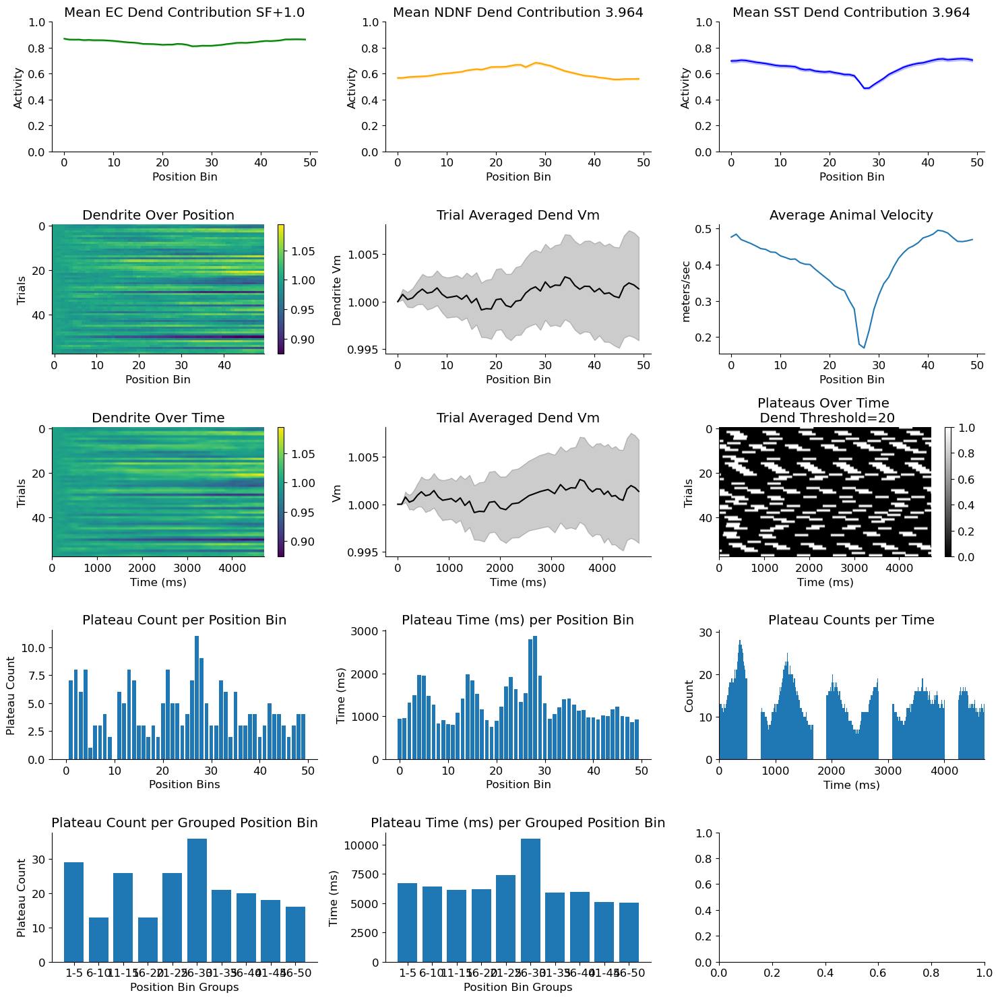

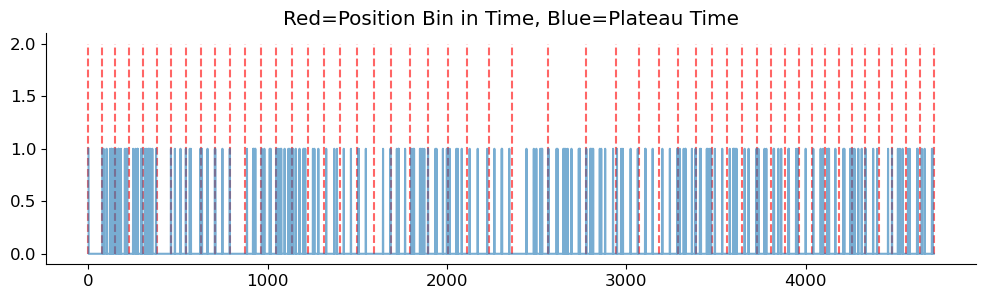

In [15]:
dend_contribution_EC, dend_contribution_NDNF, dend_contribution_SST, an_velocity, NDNF_sf_opt, SST_sf_opt = get_dend_contribution_single_dend(residual_activity_dict_EC, activity_dict_EC, fixed_residual_activity_dict_NDNF_new, fixed_activity_dict_NDNF, residual_activity_dict_SST, activity_dict_SST, mean_new_average_vel_array, GLM_params_EC, vel_applied="real")

summed_dendrite, an_velocity, padded_warped_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array, mean_dend_time, plateau_start_times_list, time_each_position_bin_starts, x_time_ms = setup_single_dendrite(dend_contribution_EC, dend_contribution_NDNF, dend_contribution_SST, an_velocity, NDNF_sf_opt, SST_sf_opt, use_model_EC=True, include_inhibition=False, use_residuals=False, dend_threshold=1)
        
plot_single_dend(dend_contribution_EC, dend_contribution_SST, dend_contribution_NDNF, summed_dendrite, an_velocity, padded_warped_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array, mean_dend_time, x_time_ms, plateau_start_times_list)


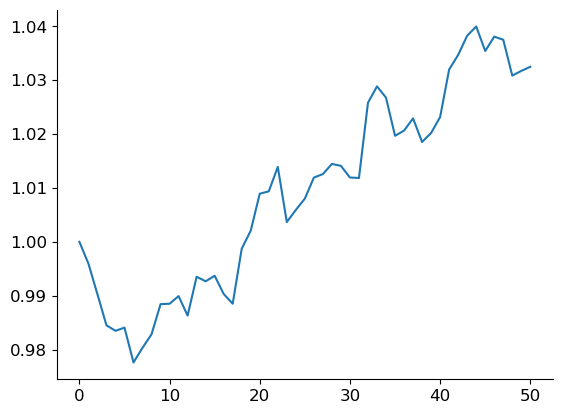

In [202]:
def random_timeseries(initial_value: float, volatility: float, count: int) -> list:
    time_series = [initial_value, ]
    for _ in range(count):
        time_series.append(time_series[-1] + initial_value * random.gauss(0, 1) * volatility)
    return time_series

# ts_list = []
# for i in range(50):
#     ts = random_timeseries(1.0, 0.005, 50)
#     ts_list.append(ts)
    
# ts_array = np.array(ts_list)

# plt.imshow(ts_array, aspect='auto')
# plt.colorbar()
# plt.show()


ts = random_timeseries(1.0, 0.005, 50)
plt.plot(ts)

In [21]:


def sample_equal_weights(mask, value=1.0):
    weights = np.zeros_like(mask, dtype=float)
    weights[mask] = value
    return weights

def sample_weights(distribution, mask, rng, mean=0.1, std=0.5):
    weights = np.zeros_like(mask, dtype=float)
    n_samples = np.sum(mask)

    if distribution == "Uniform":
        samples = rng.uniform(low=mean - std, high=mean + std, size=n_samples)
    elif distribution == "Normal":
        samples = rng.normal(loc=mean, scale=std, size=n_samples)
        samples = np.clip(samples, 0, None)
    elif distribution == "Lognormal":
        samples = rng.lognormal(mean=np.log(mean), sigma=std, size=n_samples)
    else:
        raise ValueError("Invalid distribution")

    weights[mask] = samples
    return weights


def get_dendrite_activity(weights, EC_input_matrix, n_dendrites, n_EC):
    EC_flat = EC_input_matrix.reshape(n_EC, -1)
    dendrite_flat = weights @ EC_flat
    return dendrite_flat.reshape(n_dendrites, 50, 58)

    
def loss_fn_multi(params, activity_EC, activity_SST, activity_NDNF):
    ndnf_sf, sst_sf = params
    summed = activity_EC - (sst_sf * activity_SST + ndnf_sf * activity_NDNF)
    
    summed_mean = np.mean(summed, axis=0)
    summed_means = np.mean(summed_mean, axis=1)
    summed_overall_means = np.mean(summed_means)
    
    main_loss = (summed_overall_means ** 2)  # This penalizes all deviations from 0

    return main_loss #+ 0.1 * equal_scaling_penalty
    



def get_activity_multidendrite(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, dend_threshold=20, vel_applied="real", example_cell=15, dist="Uniform", n_dendrites=100, n_SST=75, n_EC=792, n_NDNF=73, include_inhibition=True, use_model_EC=False):

    SEED = 42
    np.random.seed(SEED)
    random.seed(SEED)
    rng = np.random.default_rng(SEED)
    
    if vel_applied=="real":

        dend_contribution_EC, an_velocity, EC_pop_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        print(f"dend_contribution_EC.shape {dend_contribution_EC.shape}")
        dend_contribution_NDNF, an_velocity, NDNF_pop_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        dend_contribution_SST, an_velocity, SST_pop_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.43, norm="min_max", add_vel_contribution=True, const_vel=False)
        velocity_to_return = an_velocity.copy()
        
    elif vel_applied=="constant":

        dend_contribution_EC, an_velocity, EC_pop_list = get_dend_VM_cell_type(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_NDNF, an_velocity, NDNF_pop_list = get_dend_VM_cell_type(fixed_residual_activity_dict_NDNF_new, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=True)
        dend_contribution_SST, an_velocity, SST_pop_list = get_dend_VM_cell_type(residual_activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=True)
        velocity_to_return = an_velocity.copy()
        
    elif vel_applied=="nothing":

        dend_contribution_EC, an_velocity, EC_pop_list = get_dend_VM_cell_type(activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_NDNF, an_velocity, NDNF_pop_list = get_dend_VM_cell_type(fixed_activity_dict_NDNF, mean_new_average_vel_array, GLM_params, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=False)
        dend_contribution_SST, an_velocity, SST_pop_list = get_dend_VM_cell_type(activity_dict_SST, mean_new_average_vel_array, GLM_params_SST, 1.0, amplitude=-0.5, vel=0.381615708, norm="min_max", add_vel_contribution=False, const_vel=False)
        velocity_to_return = an_velocity.copy()
    
    
    EC_input_matrix = np.stack(EC_pop_list[:n_EC], axis=0)
    print(f"EC_input_matrix {EC_input_matrix.shape}")
    SST_input_matrix = np.stack(SST_pop_list[:n_SST], axis=0)
    NDNF_input_matrix = np.stack(NDNF_pop_list[:n_NDNF], axis=0)

    
    if use_model_EC:
        
        dend_list = []
        for j in range(792):
            ts_list = []
            for i in range(58):
                ts = random_timeseries(1.0, 0.005, 49)
                ts_list.append(ts)

            dend_contribution_EC = np.array(ts_list).T
            dend_list.append(dend_contribution_EC)
            
        EC_input_matrix = np.array(dend_list)
        print(f"EC_input_matrix.shape {EC_input_matrix.shape}")


    connection_mask_EC = np.ones((n_dendrites, n_EC), dtype=bool)
    connection_mask_SST = np.ones((n_dendrites, n_SST), dtype=bool)
    connection_mask_NDNF = np.ones((n_dendrites, n_NDNF), dtype=bool)

    weights_EC = sample_weights(dist, connection_mask_EC, rng=rng)
    weights_SST = sample_equal_weights(connection_mask_SST, 1.0)
    weights_NDNF = sample_equal_weights(connection_mask_NDNF, 1.0)


    activity_EC = get_dendrite_activity(weights_EC, EC_input_matrix, n_dendrites, n_EC)
    activity_SST = get_dendrite_activity(weights_SST, SST_input_matrix, n_dendrites, n_SST)
    activity_NDNF = get_dendrite_activity(weights_NDNF, NDNF_input_matrix, n_dendrites, n_NDNF)

    result = minimize(loss_fn_multi, x0=[1.0, 1.0], bounds=[(0, 5), (0, 5)], args=(activity_EC, activity_SST, activity_NDNF))
    NDNF_sf_opt, SST_sf_opt = result.x

    print(f"NDNF_sf_opt: {NDNF_sf_opt}")
    print(f"SST_sf_opt: {SST_sf_opt}")
    
    if include_inhibition:
        dend_activity = activity_EC - (activity_SST*SST_sf_opt + activity_NDNF*NDNF_sf_opt)
    else:
        dend_activity = activity_EC 
        


    plateau_positions_counter = np.zeros(50)
    plateau_start_positions_counter = np.zeros(50)

    threshold_list = []

    variance_list = []

    plateau_array_per_dendrite_list = []

    num_plateaus_per_dend_list = []

    dendrite_plateau_mask = np.zeros((dend_activity.shape[0], 50), dtype=bool)

    padded_warped_activity_list = []
    
    plateau_start_times_list_mega_list = []

    for d_idx in range(dend_activity.shape[0]):
        doi=dend_activity[d_idx,:,:]

        dt= 4.71657036/50
        dx=180/50

        animal_velocity_constant= np.full((doi.shape), dx/dt)

        proper_velocity = an_velocity*100


        dt_constant = 0.001

        if vel_applied=="constant":
            dt = dx / animal_velocity_constant
        else:
            dt = dx / proper_velocity
        time_bins = np.cumsum(dt, axis=0)
        time_bins_ms = time_bins * 1

        num_trials = dend_activity.shape[1]
        trial_warped_activity = []
        max_len = 0

        for t in range(num_trials):
            if np.any(np.isnan(time_bins[:, t])):
                continue
            total_time = time_bins[-1, t]

    #         print(f"{t} total time {total_time}")

            time_axis_constant = np.arange(0, total_time, dt_constant)

            firing = doi[:, t]

            warped_firing = np.interp(time_axis_constant, time_bins[:,t], firing)

            trial_warped_activity.append(warped_firing)
            if len(warped_firing) > max_len:
                max_len = len(warped_firing)

        padded_warped_activity = np.full((num_trials, max_len), np.nan) 
        for i, trace in enumerate(trial_warped_activity):
            padded_warped_activity[i, :len(trace)] = trace

        padded_warped_activity_list.append(padded_warped_activity)

        position_bins, num_trials = animal_velocity_constant.shape

        flat_padded_warped_activity = padded_warped_activity.flatten()
        flat_plateau_array = np.zeros_like(flat_padded_warped_activity)


        i = 0
        while i < len(flat_padded_warped_activity):
            if flat_padded_warped_activity[i] > dend_threshold:
                flat_plateau_array[i:i+300] = 1

                i += 800
            else:
                i += 100


        plateau_array = flat_plateau_array.reshape(padded_warped_activity.shape)
        plateau_array_per_dendrite_list.append(plateau_array)

        animal_velocity = proper_velocity

        plateau_start_times_list = []
        
        for trial in range(plateau_array.shape[0]):
            velocity_trial = animal_velocity[:, trial]
    #         velocity_trial = proper_velocity
            dt_trial = dx / velocity_trial  # in seconds
            time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])

            plateau_start_indices = np.where(np.diff(np.pad(plateau_array[trial], (1, 0))) == 1)[0]
            plateau_start_times = plateau_start_indices * dt_constant  # in seconds
            plateau_start_times_list.append(plateau_start_times)

            for pt_start_time in plateau_start_times:
                if pt_start_time != 0.0:
                    for pos_idx in range(50):
                        if time_each_pos_bin_starts[pos_idx] <= pt_start_time < time_each_pos_bin_starts[pos_idx + 1]:
                            plateau_start_positions_counter[pos_idx] += 1
                            break
                            
        plateau_start_times_list_mega_list.append(plateau_start_times_list)

        num_plateaus_list = []
        for trial in range(plateau_array.shape[0]):
            velocity_trial = animal_velocity[:, trial]
    #         velocity_trial = proper_velocity
            dt_trial = dx / velocity_trial  # in seconds
            time_each_pos_bin_starts = np.concatenate([[0], np.cumsum(dt_trial)])

            plateau_start_indices = np.where(np.diff(np.pad(plateau_array[trial], (1, 0))) == 1)[0]

            plateau_start_times = plateau_start_indices * dt_constant  # in seconds
            num_plateaus_list.append(len(plateau_start_times))

            for pt_start_time in plateau_start_times:
                if pt_start_time != 0.0:
                    for pos_idx in range(50):
                        if time_each_pos_bin_starts[pos_idx] <= pt_start_time < time_each_pos_bin_starts[pos_idx + 1]:
                            dendrite_plateau_mask[d_idx, pos_idx] = True
                            break

        num_plateaus_per_dend_list.append(np.sum(num_plateaus_list))





        num_time_bins = padded_warped_activity.shape[1]

        animal_velocity = proper_velocity


        num_trials, num_time_bins = plateau_array.shape
        position_bins = 50

        for trial in range(num_trials):
            velocity_trial = animal_velocity[:, trial]  # shape (50,)
            dt_trial = dx / velocity_trial              # shape (50,)
            bin_edges = np.concatenate([[0], np.cumsum(dt_trial)])  # shape (51,)

            time_bins = np.arange(num_time_bins) * dt_constant  # shape (num_time_bins,)

            plateau_indices = np.where(plateau_array[trial] == 1)[0]  # shape (n_plateaus,)

            if len(plateau_indices) == 0:
                continue

            pt_times = time_bins[plateau_indices] 

            pos_bin_idxs = np.searchsorted(bin_edges, pt_times, side='right') - 1

            valid_mask = (pos_bin_idxs >= 0) & (pos_bin_idxs < position_bins)
            pos_bin_idxs = pos_bin_idxs[valid_mask]

            bin_counts = np.bincount(pos_bin_idxs, minlength=position_bins)

            # --- Accumulate into global counter
            plateau_positions_counter += bin_counts
            
    plateau_start_times_list = plateau_start_times_list_mega_list[example_cell]
    
    EC_used = use_model_EC

    return weights_EC, weights_SST, weights_NDNF, padded_warped_activity_list, velocity_to_return, dend_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array_per_dendrite_list, dendrite_plateau_mask, time_each_pos_bin_starts, plateau_start_times_list, EC_used
    

    
    
def plot_multidendrite(weights_EC, weights_SST, weights_NDNF, padded_warped_activity_list, an_velocity, dend_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array_per_dendrite_list, dendrite_plateau_mask, time_each_pos_bin_starts, plateau_start_times_list, EC_used, scale_EC=True, example_cell=15):
    
    fig, axs = plt.subplots(6,3, figsize=(20,20))

    im1 = axs[0,0].imshow(weights_EC, aspect='auto')
    axs[0,0].set_title(f"EC Weights {dist}")
    axs[0,0].set_ylabel("Dendrites")
    axs[0,0].set_xlabel("Input Cells")
    fig.colorbar(im1, ax=axs[0,0])

    im2 = axs[0,1].imshow(weights_SST, aspect='auto')
    axs[0,1].set_title(f"SST Weights Equal")
    axs[0,1].set_ylabel("Dendrites")
    axs[0,1].set_xlabel("Input Cells")
    fig.colorbar(im2, ax=axs[0,1])

    im3 = axs[0,2].imshow(weights_NDNF, aspect='auto')
    axs[0,2].set_title(f"NDNF Weights Equal")
    axs[0,2].set_ylabel("Dendrites")
    axs[0,2].set_xlabel("Input Cells")
    fig.colorbar(im3, ax=axs[0,2])

    padded_warped_activity_array = np.array(padded_warped_activity_list)

    mean_pad = np.mean(padded_warped_activity_array, axis=0)

    im4 = axs[2,0].imshow(mean_pad, aspect='auto')
    axs[2,0].set_title("Mean Over Dendrites")
    axs[2,0].set_ylabel("Trials")
    axs[2,0].set_xlabel("Time (ms)")
    fig.colorbar(im4, ax=axs[2,0])

    means = np.mean(mean_pad, axis=0)
    if EC_used:
        means = means / np.max(means)
    if scale_EC:
        axs[2,1].set_ylim(0.5,1.5)
    axs[2,1].plot(means)
    axs[2,1].set_title("Mean of Dendrites and Trials")
    axs[2,1].set_xlabel("Time (ms)")

    axs[1,2].plot(an_velocity)
    axs[1,2].set_xlabel("Position Bins")
    axs[1,2].set_ylabel("meters/sec")
    axs[1,2].set_title("Velocity")

    mean_dend_activity = np.mean(dend_activity, axis=0)

    im4 = axs[1,0].imshow(mean_dend_activity.T, aspect='auto')
    axs[1,0].set_title("Mean Over Dendrites")
    axs[1,0].set_ylabel("Trials")
    axs[1,0].set_xlabel("Position Bins")
    fig.colorbar(im4, ax=axs[1,0])

    means = np.nanmean(mean_dend_activity, axis=1)
    
    if EC_used:
        means = means / np.max(means)
    if scale_EC:
        axs[1,1].set_ylim(0.5,1.5)
    axs[1,1].plot(means)
    axs[1,1].set_title("Mean of Dendrites and Trials")
    axs[1,1].set_xlabel("Position Bins")

    print(f"means {np.nanmean(means)} mean_dend_activity {np.nanmean(mean_dend_activity)}")

    axs[3,0].bar(range(len(plateau_positions_counter)), plateau_positions_counter)
    axs[3,0].set_title(f"Plateau Time Across All Dendrites Threshold={dend_threshold} \n Vel Applied={vel_applied} Sampling={dist}")
    axs[3,0].set_ylabel("Time (ms)")
    axs[3,0].set_xlabel("Position Bins")

    axs[3,1].bar(range(len(plateau_start_positions_counter)), plateau_start_positions_counter)
    axs[3,1].set_title(f"Plateau Count (Start Time) Threshold={dend_threshold} \n Vel Applied={vel_applied} Sampling={dist}")
    axs[3,1].set_ylabel("Plateau Count")
    axs[3,1].set_xlabel("Position Bins")


    n_bins = 10
    bin_size = int(50 / n_bins)

    summed_plateaus = np.zeros(n_bins)

    for i in range(n_bins):
        start = i * bin_size
        end = (i + 1) * bin_size
        summed_data = np.sum(plateau_positions_counter[start:end])
        summed_plateaus[i] = summed_data

    axs[4,0].bar(range(len(summed_plateaus)), summed_plateaus)
    axs[4,0].set_xlabel("Position Bin Quintile")
    axs[4,0].set_ylabel("Time (ms)")
    axs[4,0].set_title("Plateau Time per Track Section")
    axs[4,0].set_xticks(np.arange(n_bins), ["1-5", "6-10", "11-15", "16-20", "21-25", "26-30", "31-35", "36-40", "41-45", "46-50"], fontsize=7)

    n_bins = 10
    bin_size = int(50 / n_bins)

    summed_plateaus = np.zeros(n_bins)

    for i in range(n_bins):
        start = i * bin_size
        end = (i + 1) * bin_size
        summed_data = np.sum(plateau_start_positions_counter[start:end])
        summed_plateaus[i] = summed_data

    axs[4,1].bar(range(len(summed_plateaus)), summed_plateaus)
    axs[4,1].set_xlabel("Position Bin")
    axs[4,1].set_ylabel("Plateau Count")
    axs[4,1].set_title("Plateau Count per Track Section")
    axs[4,1].set_xticks(np.arange(n_bins), ["1-5", "6-10", "11-15", "16-20", "21-25", "26-30", "31-35", "36-40", "41-45", "46-50"], fontsize=7)


    axs[3,2].hist(weights_EC.flatten(), bins=50)
    axs[3,2].set_title(f"Weights - {dist} Dist")
    axs[3,2].set_ylabel("Count")
    axs[3,2].set_xlabel("Weight")

    variance_array = np.var(dend_activity, axis=(1, 2))  # Per dendrite variance

    print(f"variance_array.shape {variance_array.shape}")
    axs[4,2].hist(variance_array, bins=50)
    axs[4,2].set_title(f"Variance in Activity {dist}")
    axs[4,2].set_xlabel("Variance")
    axs[4,2].set_ylabel("Number of Dendrites")


    axs[5,0].hist(num_plateaus_per_dend_list, bins=10)
    axs[5,0].set_xlabel("# of Plateaus")
    axs[5,0].set_ylabel("# of Cells")

    number_dendrites_counter = np.sum(dendrite_plateau_mask, axis=0) # shape (50,)
    # plt.bar(range(len(number_dendrites_counter)), number_dendrites_counter)
    axs[5,1].plot(number_dendrites_counter)
    axs[5,1].set_title("Percent of Dendrites with Plateau at Location")
    axs[5,1].set_ylabel("Percent")
    axs[5,1].set_xlabel("Position Bin")

    ims = axs[2,2].imshow(plateau_array_per_dendrite_list[example_cell], aspect='auto', cmap='gray')
    axs[2,2].set_title("Example Dendrites Plateaus")
    axs[2,2].set_xlabel("Position Bins")
    axs[2,2].set_ylabel("Trials")
    fig.colorbar(ims, ax=axs[2,2])

    axs[5,2].axis('off')

    plt.tight_layout()
    plt.show()
    
    
    final_bin = time_each_position_bin_starts[-1] *1000
    timecourse = np.zeros(int(final_bin))
    timecourse_bins = np.zeros(int(final_bin))
    
    print(f"first bin {time_each_position_bin_starts[0]}")
    print(f"final_bin {final_bin}")

    plateau_start_times_list_cleaned = []
    for trial in range(len(plateau_start_times_list)):
        if np.any(plateau_start_times_list[trial]!=0):
            for i in plateau_start_times_list[trial]:
                plateau_start_times_list_cleaned.append(int(i*1000))
                
    print(f"plateau_start_times_list_cleaned {np.max(plateau_start_times_list_cleaned)}")


    for plateau in plateau_start_times_list_cleaned:
        timecourse[plateau] = 1

    # for bins in time_each_position_bin_starts:
    #     if bins < time_each_position_bin_starts[-1]:
    #         bins_scaled = int(bins*1000)
    #         timecourse_bins[bins_scaled] = 2

    plt.figure(figsize=(12,3))

    # Plot dashed vertical red lines at bin starts
    for bins in time_each_position_bin_starts:
        bins_scaled = int(bins * 1000)
        plt.vlines(bins_scaled, ymin=0, ymax=2, color='r', linestyle='--', alpha=0.6)
    plt.plot(timecourse, alpha=0.6)
    plt.title("Red=Position Bin in Time, Blue=Plateau Time")
    plt.show()
    

    
    
    
(weights_EC, weights_SST, weights_NDNF, padded_warped_activity_list, an_velocity, dend_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array_per_dendrite_list, dendrite_plateau_mask, time_each_pos_bin_starts, plateau_start_times_list, EC_used = get_activity_multidendrite(residual_activity_dict_EC, mean_new_average_vel_array, GLM_params_EC, dend_threshold=20, vel_applied="constant", example_cell=15, dist="Uniform", n_dendrites=100, n_SST=75, n_EC=792, n_NDNF=73, include_inhibition=False, use_model_EC=True)

plot_multidendrite((weights_EC, weights_SST, weights_NDNF, padded_warped_activity_list, an_velocity, dend_activity, plateau_positions_counter, plateau_start_positions_counter, plateau_array_per_dendrite_list, dendrite_plateau_mask, time_each_pos_bin_starts, plateau_start_times_list, EC_used, scale_EC=True)
    
    
    


fig, axs = plt.subplots(1, 3, figsize=(10,3))

mean_dend_EC = np.mean(activity_EC, axis=0)
mean_dend_SST = np.mean(activity_SST, axis=0)
mean_dend_NDNF = np.mean(activity_NDNF, axis=0)

axs[0].plot(np.mean(mean_dend_EC[:,:10], axis=1), label="EC Early", color="g")
axs[0].plot(np.mean(mean_dend_EC[:,48:], axis=1), label="EC Late", color="limegreen")
axs[0].legend()

axs[1].plot(np.mean(mean_dend_SST[:,:10], axis=1), label="SST Early", color="b")
axs[1].plot(np.mean(mean_dend_SST[:,48:], axis=1), label="SST_late", color="cyan")
axs[1].legend()

axs[2].plot(np.mean(mean_dend_NDNF[:,:10], axis=1), label="NDNF Early", color='orange')
axs[2].plot(np.mean(mean_dend_NDNF[:,48:], axis=1), label="NDNF late", color='r')
axs[2].legend()

plt.tight_layout()
plt.show()



SyntaxError: invalid syntax. Maybe you meant '==' or ':=' instead of '='? (3263933814.py, line 482)

In [246]:
def get_field_type_percents(clusters_dict_labelled_field_type, residual_activity_dict_EC):
    before_percent_list = []
    near_percent_list = []
    after_percent_list = []
    wraparound_percent_list = []
    noisy_percent_list = []

    animal_percent_dict = {}

    for animal in clusters_dict_labelled_field_type:
        cell_dict = {}

        for cell in clusters_dict_labelled_field_type[animal]:
            total_num_trials = residual_activity_dict_EC[animal][cell].shape[1]

            # Initialize field type counts
            before_count = 0
            near_count = 0
            after_count = 0
            wraparound_count = 0
            noisy_count = 0

            for i in clusters_dict_labelled_field_type[animal][cell]:
                for field_type, trial_array in clusters_dict_labelled_field_type[animal][cell][i].items():
                    count = len(trial_array)
                    if field_type == "before_field":
                        before_count += count
                    elif field_type == "near_field":
                        near_count += count
                    elif field_type == "after_field":
                        after_count += count
                    elif field_type == "wraparound_field":
                        wraparound_count += count
                    elif field_type == "noisy_field":
                        noisy_count += count

            if total_num_trials > 0:
                before_percent = before_count / total_num_trials * 100
                near_percent = near_count / total_num_trials * 100
                after_percent = after_count / total_num_trials * 100
                wraparound_percent = wraparound_count / total_num_trials * 100
                noisy_percent = noisy_count / total_num_trials * 100

                before_percent_list.append(before_percent)
                near_percent_list.append(near_percent)
                after_percent_list.append(after_percent)
                wraparound_percent_list.append(wraparound_percent)
                noisy_percent_list.append(noisy_percent)

                cell_dict[cell] = {
                    "before_percent": before_percent,
                    "near_percent": near_percent,
                    "after_percent": after_percent,
                    "wraparound_percent": wraparound_percent,
                    "noisy_percent": noisy_percent
                }

                print(f"{animal} {cell} → total trials: {total_num_trials} total labeled: {before_count + near_count + after_count + wraparound_count + noisy_count}")

        animal_percent_dict[animal] = cell_dict

    percent_lists = [
        before_percent_list,
        near_percent_list,
        after_percent_list,
        wraparound_percent_list,
        noisy_percent_list,
    ]

    return animal_percent_dict, percent_lists


In [247]:

def get_cells_percents(animal_percent_dict_EC_early_peak, animal_percent_dict_EC_late_peak, animal_percent_dict_EC_early_trough, animal_percent_dict_EC_late_trough):
    
    count_early_peak_EC_before = get_count(animal_percent_dict_EC_early_peak, field_type="before_percent")
    count_late_peak_EC_before = get_count(animal_percent_dict_EC_late_peak, field_type="before_percent")

    count_early_trough_EC_before = get_count(animal_percent_dict_EC_early_trough, field_type="before_percent")
    count_late_trough_EC_before = get_count(animal_percent_dict_EC_late_trough, field_type="before_percent")

    count_early_peak_EC_near = get_count(animal_percent_dict_EC_early_peak, field_type="near_percent")
    count_late_peak_EC_near = get_count(animal_percent_dict_EC_late_peak, field_type="near_percent")

    count_early_trough_EC_near = get_count(animal_percent_dict_EC_early_trough, field_type="near_percent")
    count_late_trough_EC_near = get_count(animal_percent_dict_EC_late_trough, field_type="near_percent")

    count_early_peak_EC_after = get_count(animal_percent_dict_EC_early_peak, field_type="after_percent")
    count_late_peak_EC_after = get_count(animal_percent_dict_EC_late_peak, field_type="after_percent")

    count_early_trough_EC_after = get_count(animal_percent_dict_EC_early_trough, field_type="after_percent")
    count_late_trough_EC_after = get_count(animal_percent_dict_EC_late_trough, field_type="after_percent")

    count_early_peak_EC_wraparound = get_count(animal_percent_dict_EC_early_peak, field_type="wraparound_percent")
    count_late_peak_EC_wraparound = get_count(animal_percent_dict_EC_late_peak, field_type="wraparound_percent")

    count_early_trough_EC_wraparound = get_count(animal_percent_dict_EC_early_trough, field_type="wraparound_percent")
    count_late_trough_EC_wraparound = get_count(animal_percent_dict_EC_late_trough, field_type="wraparound_percent")

    count_early_peak_EC_noisy = get_count(animal_percent_dict_EC_early_peak, field_type="noisy_percent")
    count_late_peak_EC_noisy = get_count(animal_percent_dict_EC_late_peak, field_type="noisy_percent")

    count_early_trough_EC_noisy = get_count(animal_percent_dict_EC_early_trough, field_type="noisy_percent")
    count_late_trough_EC_noisy = get_count(animal_percent_dict_EC_late_trough, field_type="noisy_percent")
    
    percent_of_cells_list_EC_early_peak = [count_early_peak_EC_before, count_early_peak_EC_near, count_early_peak_EC_after, count_early_peak_EC_wraparound, count_early_peak_EC_noisy]
    percent_of_cells_list_EC_late_peak = [count_late_peak_EC_before, count_late_peak_EC_near, count_late_peak_EC_after, count_late_peak_EC_wraparound, count_late_peak_EC_noisy]

    percent_of_cells_list_EC_early_trough = [count_early_trough_EC_before, count_early_trough_EC_near, count_early_trough_EC_after, count_early_trough_EC_wraparound, count_early_trough_EC_noisy]
    percent_of_cells_list_EC_late_trough = [count_late_trough_EC_before, count_late_trough_EC_near, count_late_trough_EC_after, count_late_trough_EC_wraparound, count_late_trough_EC_noisy]

    return percent_of_cells_list_EC_early_peak, percent_of_cells_list_EC_late_peak, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough



In [427]:
import operator

def get_clusters_dict_field_type(means_list, clusters_dict_EC, residual_activity_dict_EC, use_peak=True):

    rounded_means_set = set(round(m, 5) for m in means_list)


    # for animal in clusters_dict_EC:
    #     for cell in clusters_dict_EC[animal]:

    overall_animal_cluster_trial_averages = {}

    clusters_dict_labelled_field_type = {}


    for animal in clusters_dict_EC:
        cell_dict = {}
        cell_dict_labelled = {}
        for cell in clusters_dict_EC[animal]:
            cell_data = clusters_dict_EC[animal][cell]
            num_clusters = len(cell_data)
            before_field = {}
            near_field = {}
            after_field = {}
            noisy_field = {}
            wraparound_field = {}

            total_num_trials = residual_activity_dict_EC[animal][cell].shape[1]

            count= 0

            clusters_dict = {}
            for i in range(num_clusters):

                cluster_length = cell_data[i].shape[0]
                count+= cluster_length

                trial_av = np.mean(cell_data[i], axis=0)
                if len(trial_av)>0:
                    if use_peak:
                        peak = np.argmax(trial_av)
                        peak_amp = max(trial_av)
                        compare_op = operator.gt  
                        
                    else:
                        peak = np.argmin(trial_av)
                        peak_amp = min(trial_av)
                        compare_op = operator.lt
                        
                    mean_trial_av = np.mean(trial_av)
                    cutoff = mean_trial_av * 1.5
                    
                    if compare_op(peak_amp, cutoff):          
                        if peak <=15:   
                            filtered_trials = []
                            wraparound_trials = []

                            for trial in cell_data[i]:
                                trial_data = trial  
                                mean_trial_data = np.mean(trial_data)

                                if round(mean_trial_data, 5) in rounded_means_set:
                                    wraparound_trials.append(trial_data)
                                else:
                                    filtered_trials.append(trial_data)

                            filtered_array = np.array(filtered_trials)
                            wraparound_array = np.array(wraparound_trials)

                            clusters_dict[i] = {f"before_field":filtered_array,
                                               "wraparound_field":wraparound_array}
                            before_field[i] = filtered_array
                            wraparound_field[i] = wraparound_array
                            
                        elif 15 < peak < 35:
                            filtered_trials = []
                            wraparound_trials = []

                            for trial in cell_data[i]:
                                trial_data = trial  
                                mean_trial_data = np.mean(trial_data)

                                if round(mean_trial_data, 5) in rounded_means_set:
                                    wraparound_trials.append(trial_data)
                                else:
                                    filtered_trials.append(trial_data)

                            filtered_array = np.array(filtered_trials)
                            wraparound_array = np.array(wraparound_trials)

                            clusters_dict[i] = {f"near_field":filtered_array,
                                               "wraparound_field":wraparound_array}
                            
                            near_field[i] = filtered_array
                            wraparound_field[i] = wraparound_array

                        elif peak >=35:                      
                            filtered_trials = []
                            wraparound_trials = []

                            for trial in cell_data[i]:
                                trial_data = trial  
                                mean_trial_data = np.mean(trial_data)

                                mean_trial_data = np.mean(trial_data)
                                if round(mean_trial_data, 5) in rounded_means_set:
                                    wraparound_trials.append(trial_data)
                                else:
                                    filtered_trials.append(trial_data)

                            filtered_array = np.array(filtered_trials)
                            wraparound_array = np.array(wraparound_trials)

                            clusters_dict[i] = {f"after_field":filtered_array,
                                               "wraparound_field":wraparound_array}
                            
                            after_field[i] = filtered_array
                            wraparound_field[i] = wraparound_array

                    else:
                        filtered_trials = []
                        wraparound_trials = []

                        for trial in cell_data[i]:
                            trial_data = trial  
                            mean_trial_data = np.mean(trial_data)

                            mean_trial_data = np.mean(trial_data)
                            if round(mean_trial_data, 5) in rounded_means_set:
                                wraparound_trials.append(trial_data)
                            else:
                                filtered_trials.append(trial_data)

                        filtered_array = np.array(filtered_trials)
                        wraparound_array = np.array(wraparound_trials)

                        clusters_dict[i] = {f"noisy_field":filtered_array, 
                                           "wraparound_field": wraparound_array}
                        
                        noisy_field[i] = filtered_array
                        wraparound_field[i] = wraparound_array
            
            cells_dict = {"before_field":before_field,
                            "near_field":near_field,
                            "after_field": after_field, 
                             "noisy_field": noisy_field,
                             "wraparound_field": wraparound_field}
        
            cell_dict[cell] = cells_dict
    

            cell_dict_labelled[cell] = clusters_dict
            print(f" count {count} total {total_num_trials}")
        clusters_dict_labelled_field_type[animal] = cell_dict_labelled
        overall_animal_cluster_trial_averages[animal] = cell_dict       


    return clusters_dict_labelled_field_type, overall_animal_cluster_trial_averages


In [428]:
def get_means_list(residual_activity_dict_EC):
    means_list = []
    trials_list_wraparound = []

    clusters_dict_labelled_field_type_wraparound = {}

    count=0

    for animal in residual_activity_dict_EC:
        cell_dict={}
        for cell in residual_activity_dict_EC[animal]:

            wraparound_field = {}

            data = residual_activity_dict_EC[animal][cell]
            trial_list = []

            for trial in range(data.shape[0] - 1):  # avoid out-of-bounds on next trial
                current_data = data[:, trial]
                next_data = data[:, trial+1]

                peak_current = np.argmax(current_data)
                peak_next = np.argmax(next_data)

                mean_current = np.mean(current_data)
                threshold_current = 1.5*mean_current
                mean_next = np.mean(current_data)
                threshold_next = 1.5*mean_next

                if peak_current > 45 and peak_next < 5 and peak_current>threshold_current and peak_next>threshold_next:
                    trial_list.append(trial)
                    means_list.append(np.mean(residual_activity_dict_EC[animal][cell][:,trial]))
                    trials_list_wraparound.append(residual_activity_dict_EC[animal][cell][:,trial])
                    means_list.append(np.mean(residual_activity_dict_EC[animal][cell][:,trial+1]))
                    trials_list_wraparound.append(residual_activity_dict_EC[animal][cell][:,trial+1])

            cell_dict[cell] = trial_list

        clusters_dict_labelled_field_type_wraparound[animal] = cell_dict

    
    return means_list


means_list_EC = get_means_list(residual_activity_dict_EC)
means_list_SST = get_means_list(residual_activity_dict_SST)
means_list_NDNF = get_means_list(residual_activity_dict_NDNF_new)

In [429]:
def plot_per_cell_clustering_internals_single_cluster(cell_EC_model_ranks20_contig_x00, cell_NDNF_model_ranks20_kmeans_reassign_umap_x00, residual_activity_dict_NDNF, animal_id=1, cell_id=1, num_clusters=4, plot=True, early_late_nothing="nothing"):
    
    animal_first_changepoints_list, fraction_first_changepoints_list, animal_second_changepoints_list, fraction_second_changepoints_list = get_changepoints(cell_EC_model_ranks20_contig_x00, residual_activity_dict_NDNF, animal_TCA=False)

    
    tensor_list_by_animal_all_NDNF = []
    for animal in residual_activity_dict_NDNF:
        neural_data = ut.get_animal_neural_tensor(residual_activity_dict_NDNF, animal=animal)
        neural_data_tensor = torch.tensor(neural_data)
        # Normalize per cell
        for i in range(neural_data_tensor.shape[1]):
            cell = neural_data_tensor[:, i, :]
            min_val = cell.min()
            max_val = cell.max()
            neural_data_tensor[:, i, :] = (cell - min_val) / (max_val - min_val + 1e-8)
        tensor_list_by_animal_all_NDNF.append(neural_data_tensor)

    real_activity = tensor_list_by_animal_all_NDNF[animal_id][:, cell_id, :].detach().numpy()

    #     for culsters_chosen in cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["TCA_reconstructions_dict"]:

    TCA_reco = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["TCA_reconstructions_dict"][f"clusters_chosen_{num_clusters}"]

    animal_reco = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["Recon_by_cluster_av_dict"][f"clusters_chosen_{num_clusters}"]

    indices_dict = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["indices_for_cluster_number"][f"clusters_chosen_{num_clusters}"]

    if plot:
        fig, axs = plt.subplots(1, 3, figsize=(20, 10))
        im1 = (axs[0].imshow(real_activity, aspect='auto', vmin=0, vmax=1))
        axs[0].set_title("Raw Data")
        fig.colorbar(im1, ax=axs[0])
        im2 = axs[1].imshow(TCA_reco, aspect='auto', vmin=0, vmax=1)
        fig.colorbar(im2, ax=axs[1])
        im3 = axs[2].imshow(animal_reco, aspect='auto', vmin=0, vmax=1)
        fig.colorbar(im3, ax=axs[2])
        axs[1].set_title("SliceTCA Reconstruction")
        axs[2].set_title("Cluster Average Reconstruction")
        plt.tight_layout()
        plt.show()

    num_clusters = len(indices_dict)
    clusters_list = []

    if plot:
        fig, axs = plt.subplots(2, num_clusters, figsize=(num_clusters * 4, 6), squeeze=False)

    for n in range(num_clusters):
        indices = indices_dict[n]

        if early_late_nothing == "nothing":
            indices_list = indices
        elif early_late_nothing == "early":
            indices_list = [i for i in indices if i < animal_first_changepoints_list[animal_id][cell_id]]
        elif early_late_nothing == "late":
            indices_list = [i for i in indices if i > animal_second_changepoints_list[animal_id][cell_id]]
        else:
            raise ValueError(f"Invalid value for early_late_nothing: {early_late_nothing}")

        cluster = real_activity[indices_list, :]
        clusters_list.append(cluster)



#         cluster = real_activity[indices_list, :]  # trials x bins
#         clusters_list.append(cluster)


        if plot:
            axs[0, n].imshow(cluster, aspect='auto', vmin=0, vmax=1)
            axs[0, n].set_title(f"Cluster {n}")
            axs[0, n].set_xlabel("Position")
            axs[0, n].set_ylabel("Trial")

            # Plot the cluster mean
            axs[1, n].plot(np.mean(cluster, axis=0))
            axs[1, n].set_xlabel("Position")
            axs[1, n].set_ylabel("Mean activity")
            axs[1, n].set_ylim(0, 1)
    if plot:
        plt.tight_layout()
        plt.show()

    return clusters_list


In [617]:
############# data loading -- contiguous cell 

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_contig_x00_cells"
cell_SST_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_contig_x00_cells"
cell_EC_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_contig_x00_cells"
cell_NDNF_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

############## new NDNF
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_new_NDNF_model_ranks20_contiguous_x00_cell"
cell_new_NDNF_model_ranks20_contiguous_x00_cell = get_model_data_per_cell(mse_dir)

fixed_cell_combined_NDNF_model_ranks20_contiguous_x00_cell = {20: {}}
fixed_cell_NDNF_model_ranks20_contiguous_x00_cell = {20: {}}

for idx, animal in enumerate(cell_new_NDNF_model_ranks20_contiguous_x00_cell[20]):
    if idx > 8:
        fixed_cell_combined_NDNF_model_ranks20_contiguous_x00_cell[20][animal] = cell_new_NDNF_model_ranks20_contiguous_x00_cell[20][animal]
        fixed_cell_NDNF_model_ranks20_contiguous_x00_cell[20][animal] = cell_new_NDNF_model_ranks20_contiguous_x00_cell[20][animal]
        
for animal in cell_NDNF_model_ranks20_contig_x00[20]:
    fixed_cell_combined_NDNF_model_ranks20_contiguous_x00_cell[20][f"old_{animal}"] = cell_NDNF_model_ranks20_contig_x00[20][animal]
    

Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 5 cells
    Animal 1: 15 cells
    Animal 2: 6 cells
    Animal 3: 4 cells
    Animal 4: 13 cells
    Animal 5: 13 cells
    Animal 6: 3 cells
    Animal 7: 3 cells
    Animal 8: 3 cells
    Animal 9: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 192 cells
    Animal 1: 150 cells
    Animal 2: 154 cells
    Animal 3: 82 cells
    Animal 4: 74 cells
    Animal 5: 64 cells
    Animal 6: 76 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 14 cells
    Animal 1: 14 cells
    Animal 2: 6 cells
    Animal 3: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 10 cells
    Animal 1: 8 cells
    Animal 2: 7 cells
    Animal 3: 7 cells
    Animal 4: 8 cells
    Animal 5: 9 cells
    Animal 6: 11 cells
    Animal 7: 6 cells
    Animal 8: 7 cells
    Animal 9: 10 cells
    Animal 10: 8 cells
    Animal 11: 7 cells
    Animal 12: 7 cells
    Animal 13: 8 cells
    Animal 14: 9 cells
    Animal 15: 11 cells
    Ani

In [410]:
################ clusters must be of size 3+

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell"
testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell"
testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\testing_cell_OLD_NDNF_model_ranks20_reassign_regkmean_x00_cell"
testing_cell_OLD_NDNF_model_ranks20_reassign_regkmean_x00_cell = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell"
testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell = get_model_data_per_cell(mse_dir)

Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 5 cells
    Animal 1: 15 cells
    Animal 2: 6 cells
    Animal 3: 4 cells
    Animal 4: 13 cells
    Animal 5: 13 cells
    Animal 6: 3 cells
    Animal 7: 3 cells
    Animal 8: 3 cells
    Animal 9: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 192 cells
    Animal 1: 150 cells
    Animal 2: 154 cells
    Animal 3: 82 cells
    Animal 4: 74 cells
    Animal 5: 64 cells
    Animal 6: 76 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 14 cells
    Animal 1: 14 cells
    Animal 2: 6 cells
    Animal 3: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 10 cells
    Animal 1: 8 cells
    Animal 2: 7 cells
    Animal 3: 7 cells
    Animal 4: 8 cells
    Animal 5: 9 cells
    Animal 6: 11 cells
    Animal 7: 6 cells
    Animal 8: 7 cells
    Animal 9: 10 cells
    Animal 10: 8 cells
    Animal 11: 7 cells
    Animal 12: 7 cells
    Animal 13: 8 cells
    Animal 14: 9 cells
    Animal 15: 11 cells
    Ani

In [411]:
fixed_NDNF_new_residual_dict = {}

for animal in residual_activity_dict_NDNF_new:
    animal_num = int(animal.split("_")[-1])
    if animal_num > 9:
        new_cell_dict = {}
        for cell in residual_activity_dict_NDNF_new[animal]:
            new_cell_dict[cell] = residual_activity_dict_NDNF_new[animal][cell]

        fixed_NDNF_new_residual_dict[animal] = new_cell_dict


def split_data(testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell):
    fixed_model_NDNF_dict = {20:{}}
    testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell[20]
    for idx, animal in enumerate(testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell[20]):
        if animal>8:
            fixed_model_NDNF_dict[20][idx-9] = testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell[20][animal]

    return fixed_model_NDNF_dict
fixed_model_NDNF_dict = split_data(testing_cell_super_new_NDNF_model_ranks20_reassign_regkmean_x00_cell)
NDNF_contig_new_fixed = split_data(cell_new_NDNF_model_ranks20_contiguous_x00_cell)

In [612]:
len(clusters_dict_SST_early['animal_1']['cell_2'])

4

In [430]:
clusters_dict_SST_early = get_clusters_dict(cell_SST_model_ranks20_contig_x00, testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_SST, eln="early")
clusters_dict_SST_late = get_clusters_dict(cell_SST_model_ranks20_contig_x00, testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_SST, eln="late")
clusters_dict_SST_overall = get_clusters_dict(cell_SST_model_ranks20_contig_x00, testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_SST, eln="nothing")


In [433]:
clusters_dict_EC_early = get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="early")
clusters_dict_EC_late = get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="late")
clusters_dict_EC_overall = get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="nothing")


In [319]:
clusters_dict_NDNF_early = get_clusters_dict(NDNF_contig_new_fixed, fixed_model_NDNF_dict, fixed_NDNF_new_residual_dict, eln="early")
clusters_dict_NDNF_late = get_clusters_dict(NDNF_contig_new_fixed, fixed_model_NDNF_dict, fixed_NDNF_new_residual_dict, eln="late")
clusters_dict_NDNF_overall = get_clusters_dict(NDNF_contig_new_fixed, fixed_model_NDNF_dict, fixed_NDNF_new_residual_dict, eln="nothing")

clusters_dict_EC_early = get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="early")
clusters_dict_EC_late = get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="late")
clusters_dict_EC_overall = get_clusters_dict(cell_EC_model_ranks20_contig_x00, testing_cell_EC_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_EC, eln="nothing")

clusters_dict_SST_early = get_clusters_dict(cell_SST_model_ranks20_contig_x00, testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_SST, eln="early")
clusters_dict_SST_late = get_clusters_dict(cell_SST_model_ranks20_contig_x00, testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_SST, eln="late")
clusters_dict_SST_overall = get_clusters_dict(cell_SST_model_ranks20_contig_x00, testing_cell_SST_model_ranks20_reassign_regkmean_x00_cell, residual_activity_dict_SST, eln="nothing")



KeyboardInterrupt



In [270]:
clusters_dict_labelled_field_type_early_NDNF_peak, overall_animal_cluster_trial_averages_NDNF_peak_early = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_early, fixed_NDNF_new_residual_dict, use_peak=True)
clusters_dict_labelled_field_type_late_NDNF_peak, overall_animal_cluster_trial_averages_NDNF_peak_late = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_late, fixed_NDNF_new_residual_dict, use_peak=True)

clusters_dict_labelled_field_type_early_NDNF_overall, overall_animal_cluster_trial_averages_NDNF_overall_early = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_overall, fixed_NDNF_new_residual_dict, use_peak=True)
clusters_dict_labelled_field_type_late_NDNF_overall, overall_animal_cluster_trial_averages_NDNF_overall_late = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_overall, fixed_NDNF_new_residual_dict, use_peak=True)

clusters_dict_labelled_field_type_early_NDNF_trough, overall_animal_cluster_trial_averages_NDNF_trough_early = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_early, fixed_NDNF_new_residual_dict, use_peak=False)
clusters_dict_labelled_field_type_late_NDNF_trough, overall_animal_cluster_trial_averages_NDNF_trough_early = get_clusters_dict_field_type(means_list_NDNF, clusters_dict_NDNF_late, fixed_NDNF_new_residual_dict, use_peak=False)



 count 5 total 390
 count 60 total 390
 count 20 total 390
 count 5 total 390
 count 5 total 390
 count 5 total 390
 count 115 total 390
 count 5 total 390
 count 25 total 390
 count 100 total 390
 count 15 total 172
 count 30 total 172
 count 30 total 172
 count 65 total 172
 count 45 total 172
 count 40 total 172
 count 30 total 172
 count 30 total 172
 count 10 total 162
 count 75 total 162
 count 50 total 162
 count 80 total 162
 count 15 total 162
 count 25 total 162
 count 10 total 162
 count 20 total 116
 count 15 total 116
 count 15 total 116
 count 20 total 116
 count 100 total 116
 count 15 total 116
 count 70 total 116
 count 5 total 180
 count 30 total 180
 count 50 total 180
 count 80 total 180
 count 20 total 180
 count 20 total 180
 count 30 total 180
 count 20 total 180
 count 85 total 122
 count 50 total 122
 count 35 total 122
 count 5 total 122
 count 10 total 122
 count 10 total 122
 count 30 total 122
 count 80 total 122
 count 5 total 122
 count 45 total 128
 coun

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


 count 219 total 390
 count 274 total 390
 count 124 total 390
 count 309 total 390
 count 274 total 390
 count 124 total 390
 count 274 total 390
 count 274 total 390
 count 274 total 390
 count 76 total 172
 count 96 total 172
 count 116 total 172
 count 76 total 172
 count 116 total 172
 count 66 total 172
 count 76 total 172
 count 66 total 172
 count 101 total 162
 count 21 total 162
 count 86 total 162
 count 21 total 162
 count 46 total 162
 count 81 total 162
 count 146 total 162
 count 85 total 116
 count 50 total 116
 count 25 total 116
 count 10 total 116
 count 10 total 116
 count 15 total 116
 count 20 total 116
 count 79 total 180
 count 134 total 180
 count 19 total 180
 count 84 total 180
 count 59 total 180
 count 69 total 180
 count 99 total 180
 count 114 total 180
 count 6 total 122
 count 66 total 122
 count 76 total 122
 count 111 total 122
 count 106 total 122
 count 56 total 122
 count 61 total 122
 count 31 total 122
 count 56 total 122
 count 52 total 128
 cou

In [431]:
clusters_dict_labelled_field_type_early_SST_peak, overall_animal_cluster_trial_averages_SST_peak_early = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_early, residual_activity_dict_SST, use_peak=True)
clusters_dict_labelled_field_type_late_SST_peak, overall_animal_cluster_trial_averages_SST_peak_late = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_late, residual_activity_dict_SST, use_peak=True)

clusters_dict_labelled_field_type_early_SST_overall, overall_animal_cluster_trial_averages_SST_overall_early = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_overall, residual_activity_dict_SST, use_peak=True)
clusters_dict_labelled_field_type_late_SST_overall, overall_animal_cluster_trial_averages_SST_overall_late = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_overall, residual_activity_dict_SST, use_peak=True)

clusters_dict_labelled_field_type_early_SST_trough, overall_animal_cluster_trial_averages_SST_trough_early = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_early, residual_activity_dict_SST, use_peak=False)
clusters_dict_labelled_field_type_late_SST_trough, overall_animal_cluster_trial_averages_SST_trough_early = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST_late, residual_activity_dict_SST, use_peak=False)



# clusters_dict_labelled_field_type_overall_SST = get_clusters_dict_field_type(means_list_SST, clusters_dict_SST, residual_activity_dict_SST)

 count 15 total 212
 count 10 total 212
 count 35 total 212
 count 10 total 212
 count 90 total 212
 count 35 total 152
 count 10 total 152
 count 65 total 152
 count 35 total 152
 count 115 total 152
 count 115 total 152
 count 25 total 152
 count 60 total 152
 count 25 total 152
 count 40 total 152
 count 25 total 152
 count 60 total 152
 count 45 total 152
 count 30 total 152
 count 15 total 152
 count 5 total 73
 count 15 total 73
 count 15 total 73
 count 25 total 73
 count 15 total 73
 count 15 total 73
 count 20 total 137
 count 15 total 137
 count 15 total 137
 count 20 total 137
 count 50 total 63
 count 40 total 63
 count 10 total 63
 count 30 total 63
 count 40 total 63
 count 15 total 63
 count 30 total 63
 count 10 total 63
 count 5 total 63
 count 10 total 63
 count 40 total 63
 count 15 total 63
 count 30 total 63
 count 85 total 163
 count 25 total 163
 count 40 total 163
 count 75 total 163
 count 15 total 163
 count 50 total 163
 count 75 total 163
 count 20 total 163

In [434]:
clusters_dict_labelled_field_type_early_EC_peak, overall_animal_cluster_trial_averages_EC_peak_early = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_early, residual_activity_dict_EC, use_peak=True)
clusters_dict_labelled_field_type_late_EC_peak, overall_animal_cluster_trial_averages_EC_peak_late = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_late, residual_activity_dict_EC, use_peak=True)

clusters_dict_labelled_field_type_early_EC_overall, overall_animal_cluster_trial_averages_EC_overall_early = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_overall, residual_activity_dict_EC, use_peak=True)
clusters_dict_labelled_field_type_late_EC_overall, overall_animal_cluster_trial_averages_EC_overall_late = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_overall, residual_activity_dict_EC, use_peak=True)

clusters_dict_labelled_field_type_early_EC_trough, overall_animal_cluster_trial_averages_EC_trough_early = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_early, residual_activity_dict_EC, use_peak=False)
clusters_dict_labelled_field_type_late_EC_trough, overall_animal_cluster_trial_averages_EC_trough_early = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC_late, residual_activity_dict_EC, use_peak=False)



# clusters_dict_labelled_field_type_overall_EC = get_clusters_dict_field_type(means_list_EC, clusters_dict_EC, residual_activity_dict_EC)

 count 40 total 78
 count 10 total 78
 count 20 total 78
 count 40 total 78
 count 20 total 78
 count 35 total 78
 count 15 total 78
 count 5 total 78
 count 50 total 78
 count 65 total 78
 count 25 total 78
 count 35 total 78
 count 20 total 78
 count 30 total 78
 count 30 total 78
 count 50 total 78
 count 5 total 78
 count 10 total 78
 count 5 total 78
 count 50 total 78
 count 40 total 78
 count 45 total 78
 count 20 total 78
 count 45 total 78
 count 5 total 78
 count 5 total 78
 count 60 total 78
 count 15 total 78
 count 5 total 78
 count 5 total 78
 count 10 total 78
 count 5 total 78
 count 25 total 78
 count 15 total 78
 count 5 total 78
 count 20 total 78
 count 20 total 78
 count 55 total 78
 count 50 total 78
 count 55 total 78
 count 40 total 78
 count 60 total 78
 count 15 total 78
 count 25 total 78
 count 55 total 78
 count 5 total 78
 count 40 total 78
 count 20 total 78
 count 45 total 78
 count 55 total 78
 count 5 total 78
 count 25 total 78
 count 45 total 78
 cou

 count 20 total 145
 count 45 total 145
 count 60 total 145
 count 50 total 145
 count 30 total 145
 count 10 total 145
 count 135 total 145
 count 20 total 145
 count 30 total 145
 count 20 total 145
 count 80 total 145
 count 135 total 145
 count 35 total 145
 count 110 total 145
 count 45 total 145
 count 75 total 145
 count 30 total 145
 count 15 total 145
 count 90 total 145
 count 30 total 145
 count 15 total 145
 count 125 total 145
 count 130 total 145
 count 5 total 145
 count 15 total 145
 count 20 total 145
 count 25 total 145
 count 10 total 145
 count 5 total 145
 count 30 total 145
 count 15 total 145
 count 20 total 145
 count 135 total 145
 count 50 total 145
 count 30 total 145
 count 5 total 145
 count 75 total 145
 count 50 total 145
 count 30 total 145
 count 130 total 145
 count 100 total 145
 count 25 total 145
 count 135 total 145
 count 50 total 145
 count 30 total 145
 count 10 total 145
 count 105 total 145
 count 5 total 145
 count 115 total 145
 count 80 tot

 count 13 total 64
 count 3 total 64
 count 13 total 64
 count 13 total 64
 count 13 total 64
 count 13 total 64
 count 23 total 64
 count 3 total 64
 count 3 total 64
 count 18 total 64
 count 38 total 64
 count 38 total 64
 count 13 total 64
 count 33 total 64
 count 18 total 64
 count 18 total 64
 count 18 total 64
 count 3 total 64
 count 3 total 64
 count 8 total 64
 count 8 total 64
 count 33 total 64
 count 8 total 64
 count 13 total 64
 count 18 total 64
 count 3 total 64
 count 28 total 64
 count 28 total 64
 count 3 total 64
 count 3 total 64
 count 3 total 64
 count 94 total 145
 count 39 total 145
 count 134 total 145
 count 4 total 145
 count 79 total 145
 count 129 total 145
 count 119 total 145
 count 59 total 145
 count 114 total 145
 count 84 total 145
 count 79 total 145
 count 84 total 145
 count 79 total 145
 count 129 total 145
 count 4 total 145
 count 94 total 145
 count 74 total 145
 count 119 total 145
 count 49 total 145
 count 4 total 145
 count 79 total 145


 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 to

 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 total 58
 count 58 to

 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 66 total 66
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 total 63
 count 63 to

 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 101 total 101
 count 40 total 78
 count 10 total 78
 count 20 total 78
 count 40 total 78
 count 20 total 78
 count 35 total 78
 count 15 total 78
 count 5 total 78
 count 50 total 78
 count 65 total 78
 count 25 total 78
 count 35 total 78
 count 20 total 78
 count 30 total 78
 count 30 total 78
 count 50 total 78
 count 5 total 78
 count 

 count 55 total 64
 count 5 total 64
 count 40 total 64
 count 40 total 64
 count 30 total 64
 count 25 total 64
 count 45 total 64
 count 25 total 64
 count 30 total 64
 count 20 total 64
 count 20 total 64
 count 45 total 64
 count 25 total 64
 count 30 total 64
 count 25 total 64
 count 40 total 64
 count 35 total 64
 count 55 total 64
 count 30 total 64
 count 35 total 64
 count 20 total 64
 count 45 total 64
 count 45 total 64
 count 30 total 64
 count 10 total 64
 count 15 total 64
 count 25 total 64
 count 25 total 64
 count 35 total 64
 count 55 total 64
 count 15 total 145
 count 10 total 145
 count 5 total 145
 count 30 total 145
 count 40 total 145
 count 5 total 145
 count 20 total 145
 count 45 total 145
 count 20 total 145
 count 45 total 145
 count 60 total 145
 count 50 total 145
 count 30 total 145
 count 10 total 145
 count 135 total 145
 count 20 total 145
 count 30 total 145
 count 20 total 145
 count 80 total 145
 count 135 total 145
 count 35 total 145
 count 110 

 count 35 total 66
 count 30 total 66
 count 15 total 66
 count 35 total 66
 count 35 total 66
 count 55 total 66
 count 50 total 66
 count 30 total 66
 count 45 total 66
 count 55 total 66
 count 40 total 66
 count 55 total 66
 count 25 total 66
 count 35 total 66
 count 40 total 66
 count 10 total 66
 count 20 total 66
 count 10 total 66
 count 55 total 66
 count 55 total 66
 count 27 total 63
 count 2 total 63
 count 17 total 63
 count 27 total 63
 count 17 total 63
 count 7 total 63
 count 22 total 63
 count 12 total 63
 count 7 total 63
 count 2 total 63
 count 2 total 63
 count 37 total 63
 count 2 total 63
 count 2 total 63
 count 2 total 63
 count 17 total 63
 count 27 total 63
 count 2 total 63
 count 17 total 63
 count 32 total 63
 count 7 total 63
 count 2 total 63
 count 2 total 63
 count 2 total 63
 count 17 total 63
 count 2 total 63
 count 2 total 63
 count 37 total 63
 count 52 total 63
 count 47 total 63
 count 22 total 63
 count 12 total 63
 count 37 total 63
 count 2

29


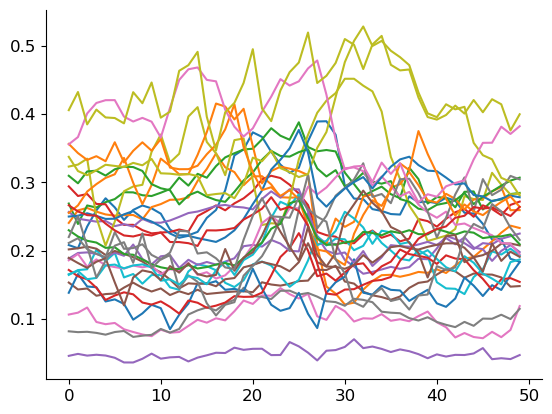

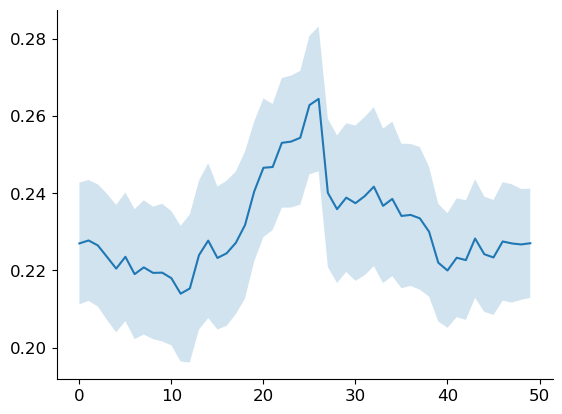

In [422]:
near_field_list = []

for animal in clusters_dict_labelled_field_type_early_SST_peak:
    for cell in clusters_dict_labelled_field_type_early_SST_peak[animal]:
        for i in clusters_dict_labelled_field_type_early_SST_peak[animal][cell]:
            if "near_field" in clusters_dict_labelled_field_type_early_SST_peak[animal][cell][i]:
                near_field_list.append(np.mean(clusters_dict_labelled_field_type_early_SST_peak[animal][cell][i]["near_field"], axis=0))

print(len(near_field_list))   


for i in near_field_list:
    plt.plot(i)
plt.show()

near_field_array = np.array(near_field_list)

mean_near_field_array = np.mean(near_field_array, axis=0)
sem_near_field_array = sem(near_field_array, axis=0)

plt.plot(mean_near_field_array)
plt.fill_between(range(len(mean_near_field_array)), mean_near_field_array-sem_near_field_array, mean_near_field_array+sem_near_field_array, alpha=0.2)



In [488]:
def plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="near_field", plot=False):

    near_field_list = []

    for animal in clusters_dict_labelled_field_type_early_SST_trough:
        for cell in clusters_dict_labelled_field_type_early_SST_trough[animal]:
            for i in clusters_dict_labelled_field_type_early_SST_trough[animal][cell]:
                if field_type in clusters_dict_labelled_field_type_early_SST_trough[animal][cell][i]:
                    means = np.mean(clusters_dict_labelled_field_type_early_SST_trough[animal][cell][i][field_type], axis=0)
                    if means.shape != (50,):
                        continue

                    near_field_list.append(means) 

    near_field_array = np.array(near_field_list)
    
    if plot:
    
        for i in near_field_list:
            plt.plot(i, color='gray')
        plt.plot(np.mean(near_field_array, axis=0), color='red')
        plt.show()

        mean_near_field_array = np.mean(near_field_array, axis=0)
        sem_near_field_array = sem(near_field_array, axis=0)

        plt.plot(mean_near_field_array)
        plt.fill_between(range(len(mean_near_field_array)), mean_near_field_array-sem_near_field_array, mean_near_field_array+sem_near_field_array, alpha=0.2)
    
    return near_field_array


def plot_and_fill_between(mean_near_field_array, sem_near_field_array, col='r', ax=axs[0,0]):
    ax.plot(mean_near_field_array, color=col)
    ax.fill_between(range(len(mean_near_field_array)), mean_near_field_array-sem_near_field_array, mean_near_field_array+sem_near_field_array, color=col, alpha=0.2)
    
def plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_trough, clusters_dict_labelled_field_type_late_SST_trough, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, use_trough=True, plot=False, cell_type="SST"):
    
    if use_trough:
        near_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="near_field", plot=False)
        before_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="before_field", plot=False)
        after_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_trough, field_type="after_field", plot=False)

        near_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_trough, field_type="near_field", plot=False)
        before_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_trough, field_type="before_field", plot=False)
        after_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_trough, field_type="after_field", plot=False)

        mean_near_field_array_early = np.mean(near_field_array_early, axis=0)
        sem_near_field_array_early = sem(near_field_array_early, axis=0)

        mean_before_field_array_early = np.mean(before_field_array_early, axis=0)
        sem_before_field_array_early = sem(before_field_array_early, axis=0)

        mean_after_field_array_early = np.mean(after_field_array_early, axis=0)
        sem_after_field_array_early = sem(after_field_array_early, axis=0)

        mean_near_field_array_late = np.mean(near_field_array_late, axis=0)
        sem_near_field_array_late = sem(near_field_array_late, axis=0)

        mean_before_field_array_late = np.mean(before_field_array_late, axis=0)
        sem_before_field_array_late = sem(before_field_array_late, axis=0)

        mean_after_field_array_late = np.mean(after_field_array_late, axis=0)
        sem_after_field_array_late = sem(after_field_array_late, axis=0)
        
    else:
        near_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_peak, field_type="near_field", plot=False)
        before_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_peak, field_type="before_field", plot=False)
        after_field_array_early = plot_cluster_peaks(clusters_dict_labelled_field_type_early_SST_peak, field_type="after_field", plot=False)

        near_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_peak, field_type="near_field", plot=False)
        before_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_peak, field_type="before_field", plot=False)
        after_field_array_late = plot_cluster_peaks(clusters_dict_labelled_field_type_late_SST_peak, field_type="after_field", plot=False)

        mean_near_field_array_early = np.mean(near_field_array_early, axis=0)
        sem_near_field_array_early = sem(near_field_array_early, axis=0)

        mean_before_field_array_early = np.mean(before_field_array_early, axis=0)
        sem_before_field_array_early = sem(before_field_array_early, axis=0)

        mean_after_field_array_early = np.mean(after_field_array_early, axis=0)
        sem_after_field_array_early = sem(after_field_array_early, axis=0)

        mean_near_field_array_late = np.mean(near_field_array_late, axis=0)
        sem_near_field_array_late = sem(near_field_array_late, axis=0)

        mean_before_field_array_late = np.mean(before_field_array_late, axis=0)
        sem_before_field_array_late = sem(before_field_array_late, axis=0)

        mean_after_field_array_late = np.mean(after_field_array_late, axis=0)
        sem_after_field_array_late = sem(after_field_array_late, axis=0)

    
    if plot:
        fig, axs = plt.subplots(4,3, figsize=(15,12))
        plt.suptitle(cell_type)
        
        if use_trough:
            axs[0,0].set_title("Before Reward Early Trough")
            axs[0,1].set_title("Near Reward Early Trough")
            axs[0,2].set_title("After Reward Early Trough")
        else:
            axs[0,0].set_title("Before Reward Early Peak")
            axs[0,1].set_title("Near Reward Early Peak")
            axs[0,2].set_title("After Reward Early Peak")

        axs[1,0].imshow(before_field_array_early, aspect='auto')

        axs[1,1].imshow(near_field_array_early, aspect='auto')

        axs[1,2].imshow(after_field_array_early, aspect='auto')

        plot_and_fill_between(mean_near_field_array_early, sem_near_field_array_early, col='r', ax=axs[0,1])

        plot_and_fill_between(mean_before_field_array_early, sem_before_field_array_early, col='b', ax=axs[0,0])

        plot_and_fill_between(mean_after_field_array_early, sem_after_field_array_early, col='purple', ax=axs[0,2])

        plot_and_fill_between(mean_before_field_array_late, sem_before_field_array_late, col='b', ax=axs[2,0])

        plot_and_fill_between(mean_near_field_array_late, sem_near_field_array_late, col='r', ax=axs[2,1])

        plot_and_fill_between(mean_after_field_array_late, sem_after_field_array_late, col='purple', ax=axs[2,2])


        if use_trough:
            axs[2,0].set_title("Before Reward Late Trough")
            axs[2,1].set_title("Near Reward Late Trough")
            axs[2,2].set_title("After Reward Late Trough")
        else:
            axs[2,0].set_title("Before Reward Late Peak")
            axs[2,1].set_title("Near Reward Late Peak")
            axs[2,2].set_title("After Reward Late Peak")


        axs[3,0].imshow(before_field_array_late, aspect='auto')

        axs[3,1].imshow(near_field_array_late, aspect='auto')

        axs[3,2].imshow(after_field_array_late, aspect='auto')

        plt.tight_layout()
        plt.plot()
        
    else:
        return mean_before_field_array_early, mean_near_field_array_early, mean_after_field_array_early, mean_before_field_array_late, mean_near_field_array_late, mean_after_field_array_late



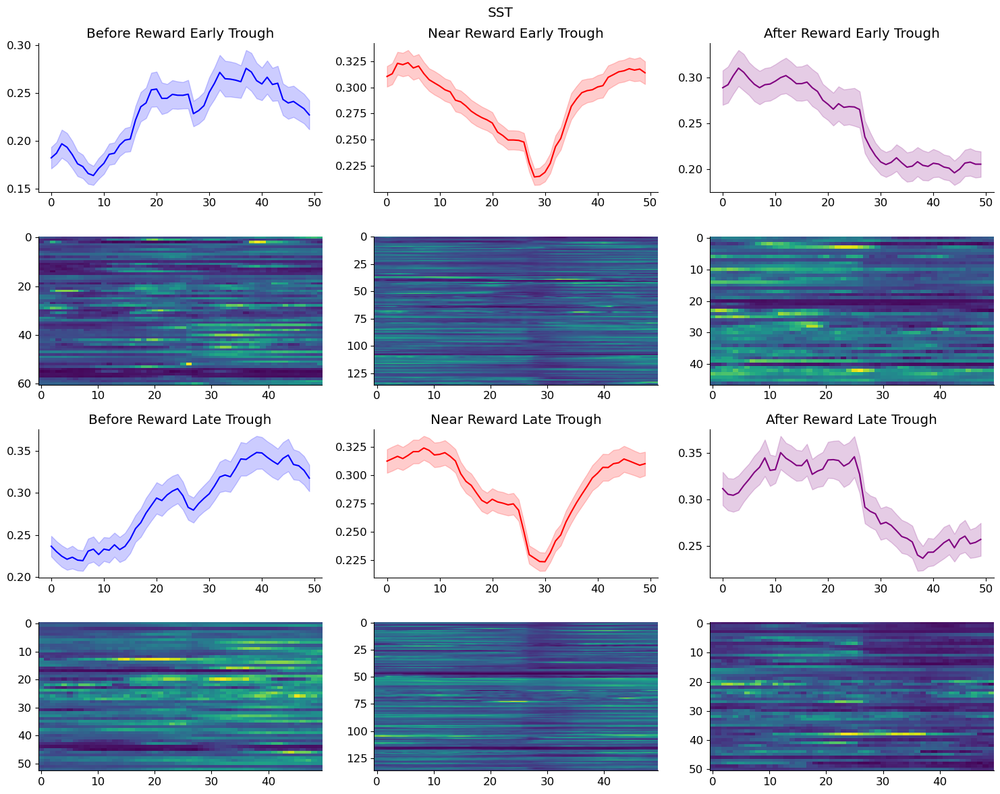

In [493]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_trough, clusters_dict_labelled_field_type_late_SST_trough, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, use_trough=True, plot=True, cell_type="SST")
mean_before_field_array_early_trough_SST, mean_near_field_array_early_trough_SST, mean_after_field_array_early_trough_SST, mean_before_field_array_late_trough_SST, mean_near_field_array_late_trough_SST, mean_after_field_array_late_trough_SST = plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_trough, clusters_dict_labelled_field_type_late_SST_trough, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, plot=False)
    

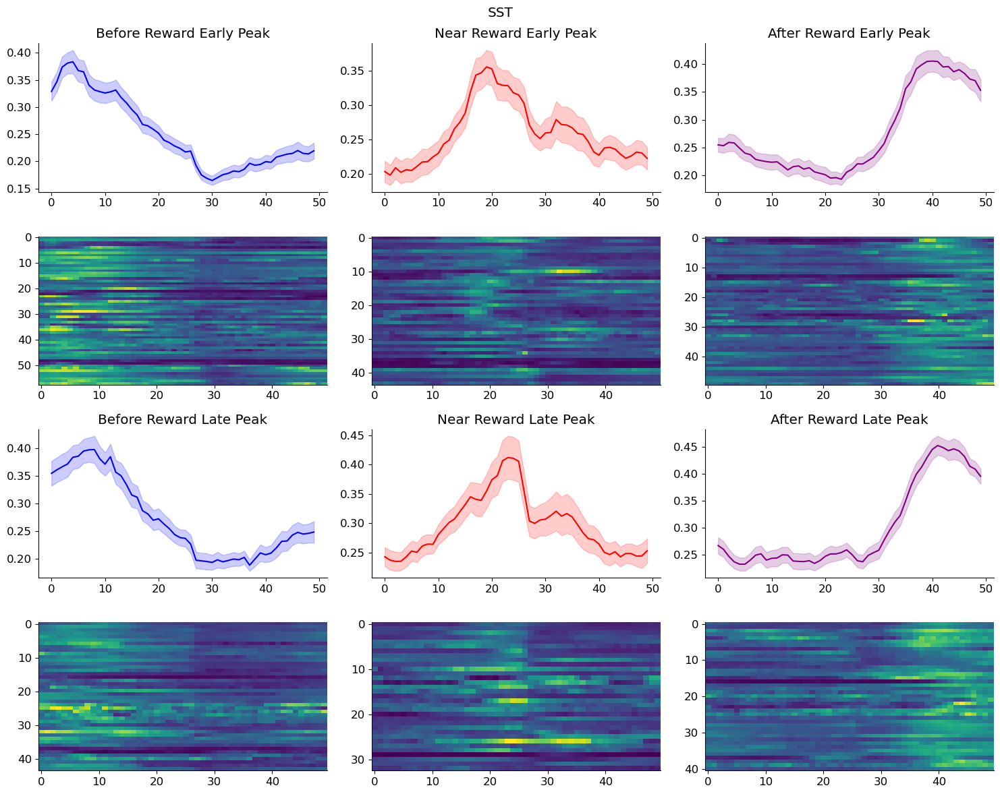

In [494]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, use_trough=False, plot=True, cell_type="SST")
mean_before_field_array_early_peak_SST, mean_near_field_array_early_peak_SST, mean_after_field_array_early_peak_SST, mean_before_field_array_late_peak_SST, mean_near_field_array_late_peak_SST, mean_after_field_array_late_peak_SST = plot_clustered_averages(clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, clusters_dict_labelled_field_type_early_SST_peak, clusters_dict_labelled_field_type_late_SST_peak, plot=False)
    

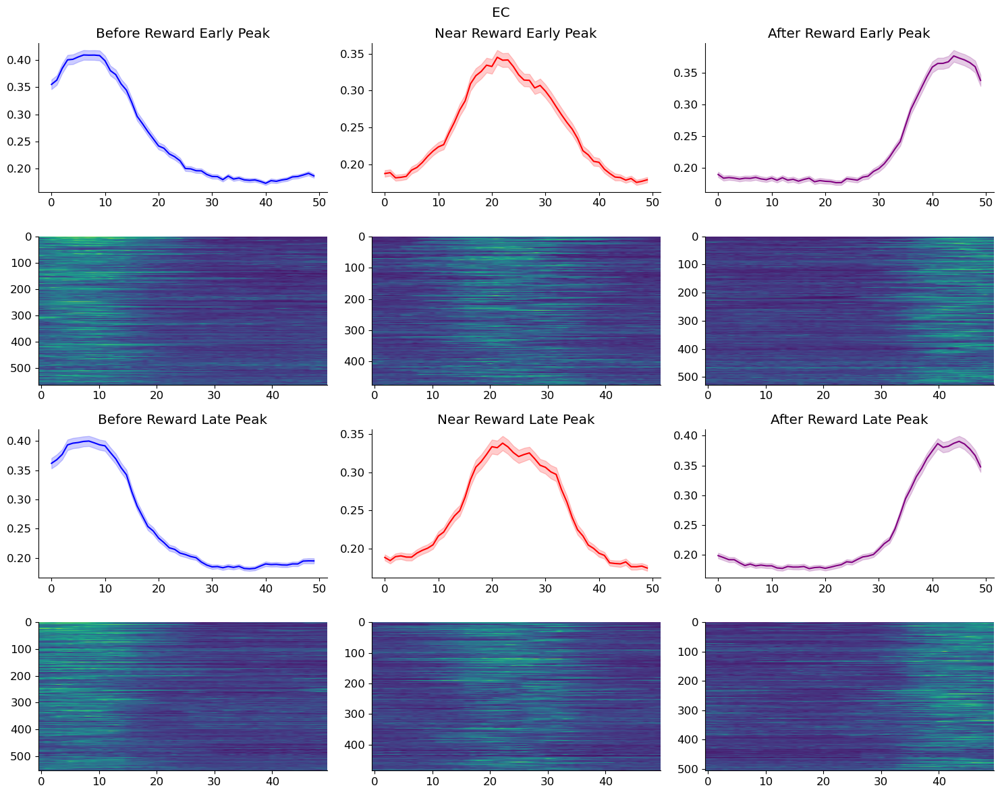

In [491]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_EC_peak, clusters_dict_labelled_field_type_late_EC_peak, clusters_dict_labelled_field_type_early_EC_peak, clusters_dict_labelled_field_type_late_EC_peak, use_trough=False, plot=True, cell_type="EC")
mean_before_field_array_early_peak_EC, mean_near_field_array_early_peak_EC, mean_after_field_array_early_peak_EC, mean_before_field_array_late_peak_EC, mean_near_field_array_late_peak_EC, mean_after_field_array_late_peak_EC = plot_clustered_averages(clusters_dict_labelled_field_type_early_EC_peak, clusters_dict_labelled_field_type_late_EC_peak, clusters_dict_labelled_field_type_early_EC_peak, clusters_dict_labelled_field_type_late_EC_peak, plot=False)
    

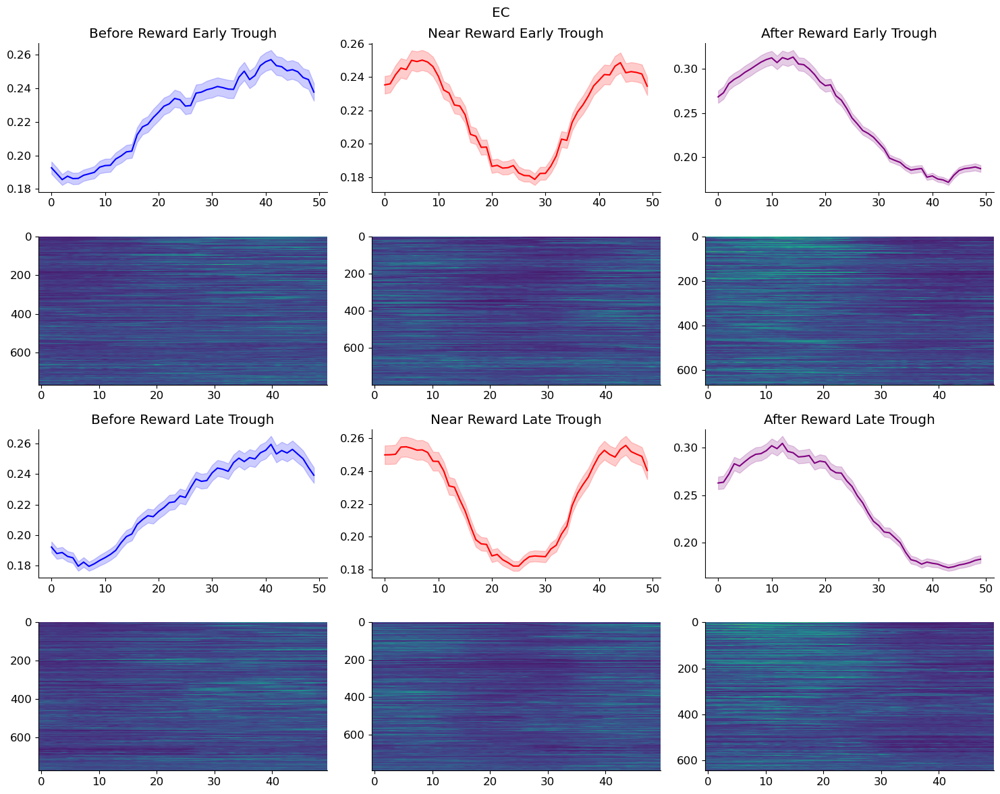

In [492]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_EC_trough, clusters_dict_labelled_field_type_late_EC_trough, clusters_dict_labelled_field_type_early_EC_trough, clusters_dict_labelled_field_type_late_EC_trough, use_trough=True, plot=True, cell_type="EC")
mean_before_field_array_early_trough_EC, mean_near_field_array_early_trough_EC, mean_after_field_array_early_trough_EC, mean_before_field_array_late_trough_EC, mean_near_field_array_late_trough_EC, mean_after_field_array_late_trough_EC = plot_clustered_averages(clusters_dict_labelled_field_type_early_EC_trough, clusters_dict_labelled_field_type_late_EC_trough, clusters_dict_labelled_field_type_early_EC_trough, clusters_dict_labelled_field_type_late_EC_trough, plot=False)
    

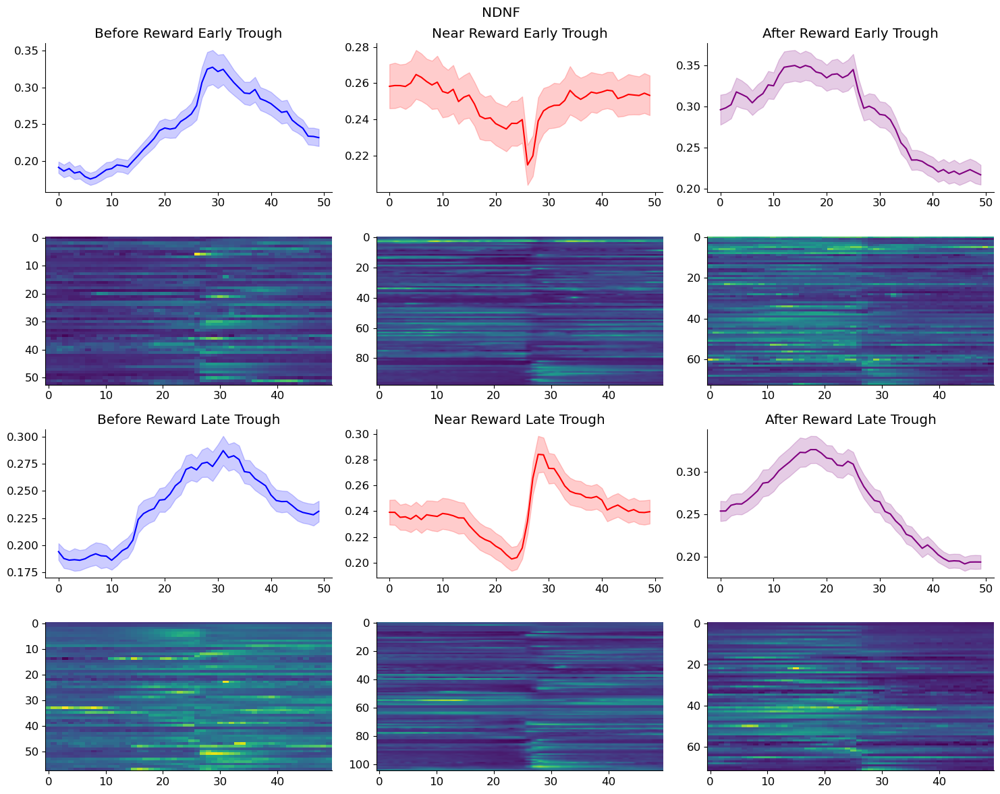

In [495]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_NDNF_trough, clusters_dict_labelled_field_type_late_NDNF_trough, clusters_dict_labelled_field_type_early_NDNF_trough, clusters_dict_labelled_field_type_late_NDNF_trough, use_trough=True, plot=True, cell_type="NDNF")
mean_before_field_array_early_trough_NDNF, mean_near_field_array_early_trough_NDNF, mean_after_field_array_early_trough_NDNF, mean_before_field_array_late_trough_NDNF, mean_near_field_array_late_trough_NDNF, mean_after_field_array_late_trough_NDNF = plot_clustered_averages(clusters_dict_labelled_field_type_early_NDNF_trough, clusters_dict_labelled_field_type_late_NDNF_trough, clusters_dict_labelled_field_type_early_NDNF_trough, clusters_dict_labelled_field_type_late_NDNF_trough, plot=False)
    

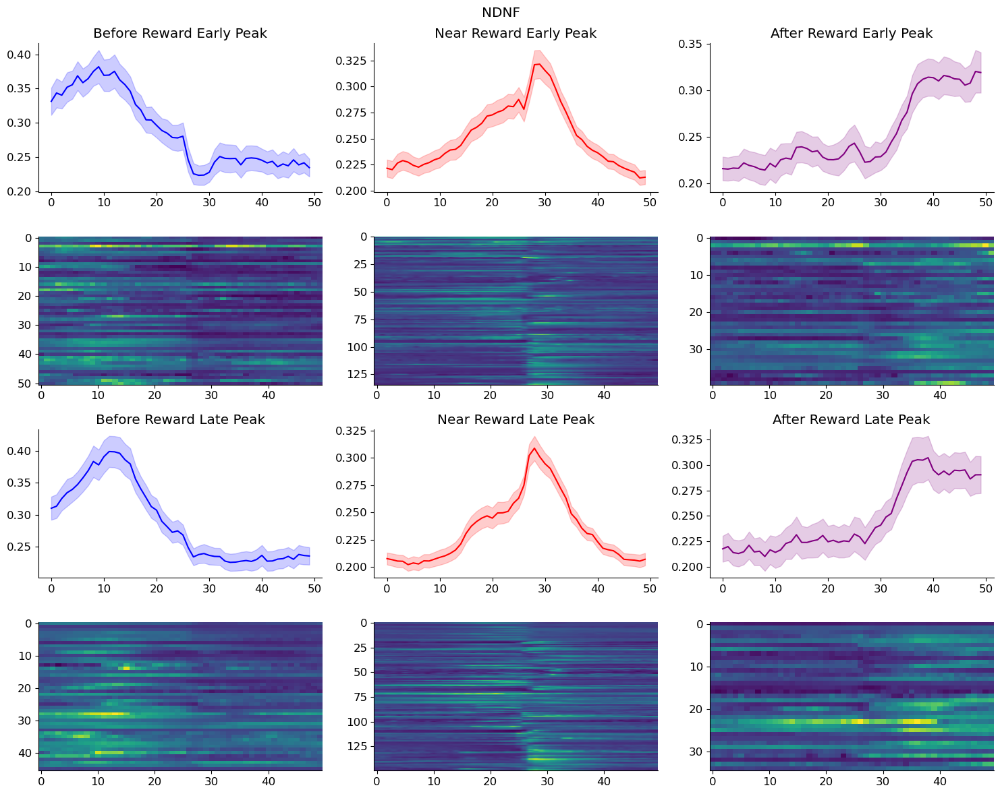

In [498]:
plot_clustered_averages(clusters_dict_labelled_field_type_early_NDNF_peak, clusters_dict_labelled_field_type_late_NDNF_peak, clusters_dict_labelled_field_type_early_NDNF_peak, clusters_dict_labelled_field_type_late_NDNF_peak, use_trough=False, plot=True, cell_type="NDNF")
mean_before_field_array_early_peak_NDNF, mean_near_field_array_early_peak_NDNF, mean_after_field_array_early_peak_NDNF, mean_before_field_array_late_peak_NDNF, mean_near_field_array_late_peak_NDNF, mean_after_field_array_late_peak_NDNF = plot_clustered_averages(clusters_dict_labelled_field_type_early_NDNF_peak, clusters_dict_labelled_field_type_late_NDNF_peak, clusters_dict_labelled_field_type_early_NDNF_peak, clusters_dict_labelled_field_type_late_NDNF_peak, plot=False)
    

68.18181818181817
(50, 100)


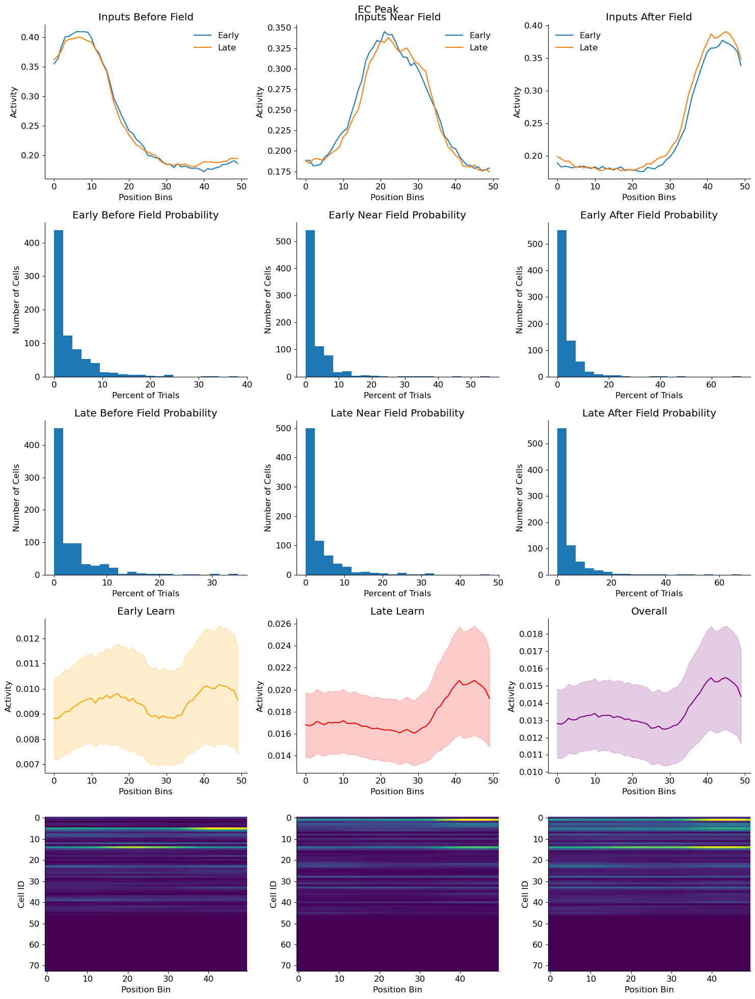

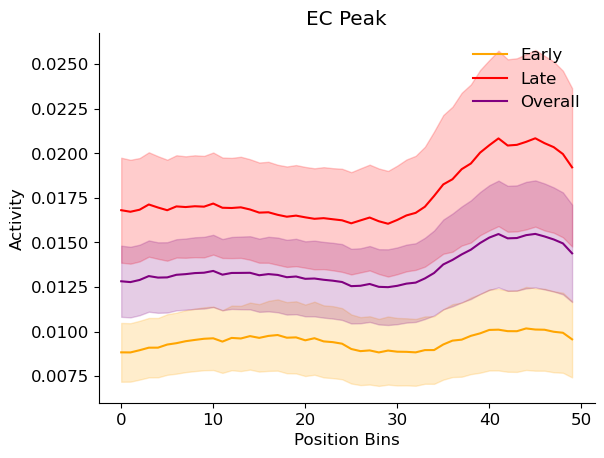

68.18181818181817
(50, 100)


In [647]:
reconstruct_activity_from_clusters(mean_before_field_array_early_peak_EC, mean_near_field_array_early_peak_EC, mean_after_field_array_early_peak_EC, mean_before_field_array_late_peak_EC, mean_near_field_array_late_peak_EC, mean_after_field_array_late_peak_EC, percent_lists_EC_early_peak, percent_lists_EC_late_peak, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough, num_cells=73, cell_type="EC Peak", plot=True)
trial_averaged_cell_array_early_EC_peak, trial_averaged_cell_array_late_EC_peak, full_activity_trial_av_array_EC_peak = reconstruct_activity_from_clusters(mean_before_field_array_early_peak_EC, mean_near_field_array_early_peak_EC, mean_after_field_array_early_peak_EC, mean_before_field_array_late_peak_EC, mean_near_field_array_late_peak_EC, mean_after_field_array_late_peak_EC, percent_lists_EC_early_peak, percent_lists_EC_late_peak, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough, num_cells=73, cell_type="EC Peak", plot=False)



88.0
(50, 100)


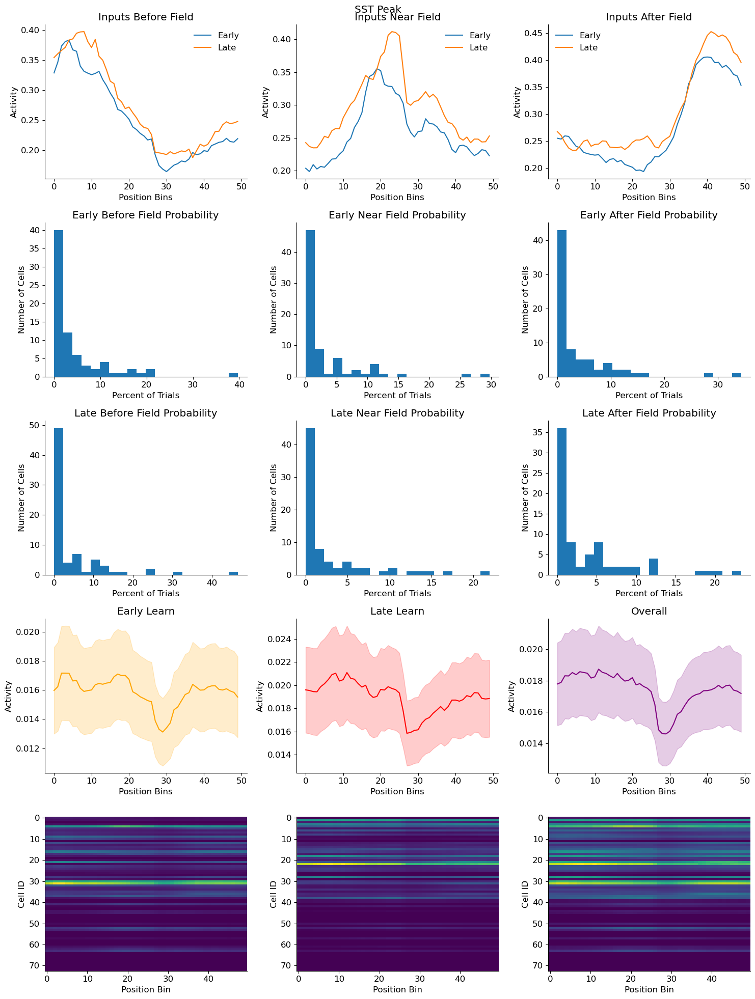

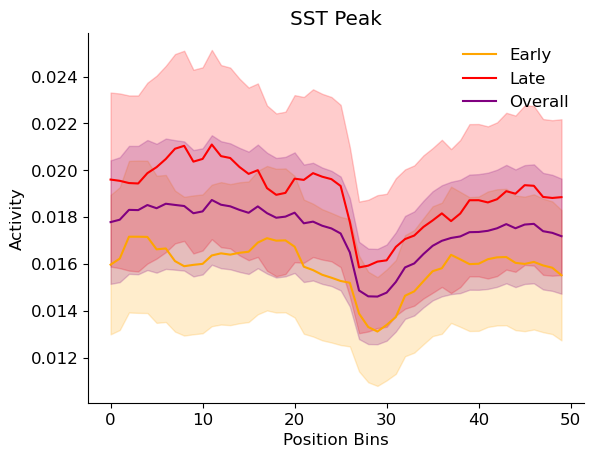

88.0
(50, 100)


In [606]:
reconstruct_activity_from_clusters(mean_before_field_array_early_peak_SST, mean_near_field_array_early_peak_SST, mean_after_field_array_early_peak_SST, mean_before_field_array_late_peak_SST, mean_near_field_array_late_peak_SST, mean_after_field_array_late_peak_SST, percent_lists_SST_early_peak, percent_lists_SST_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, num_cells=73, cell_type="SST Peak", plot=True)
trial_averaged_cell_array_early, trial_averaged_cell_array_late, full_activity_trial_av_array_SST = reconstruct_activity_from_clusters(mean_before_field_array_early_peak_SST, mean_near_field_array_early_peak_SST, mean_after_field_array_early_peak_SST, mean_before_field_array_late_peak_SST, mean_near_field_array_late_peak_SST, mean_after_field_array_late_peak_SST, percent_lists_SST_early_peak, percent_lists_SST_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, num_cells=73, cell_type="SST Peak", plot=False)



88.0
(50, 100)


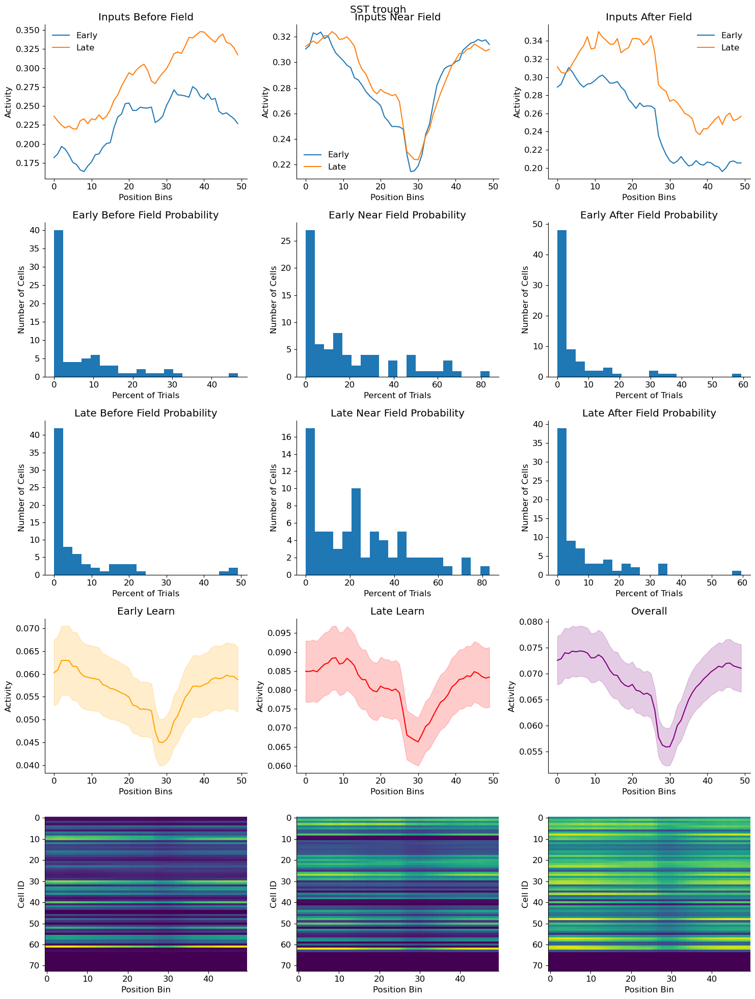

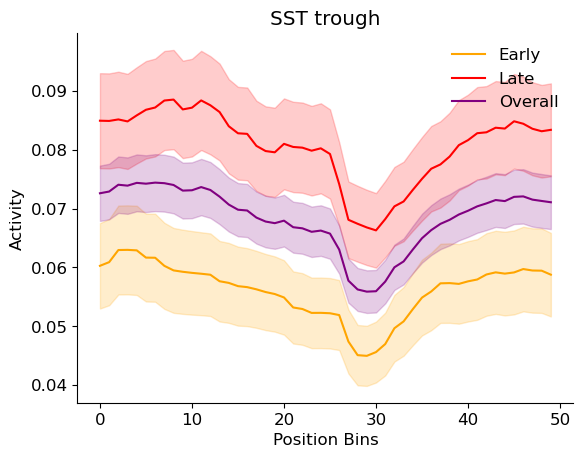

88.0
(50, 100)


In [652]:
reconstruct_activity_from_clusters(mean_before_field_array_early_trough_SST, mean_near_field_array_early_trough_SST, mean_after_field_array_early_trough_SST, mean_before_field_array_late_trough_SST, mean_near_field_array_late_trough_SST, mean_after_field_array_late_trough_SST, percent_lists_SST_early_trough, percent_lists_SST_late_trough, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, num_cells=73, cell_type="SST trough", plot=True)
trial_averaged_cell_array_early_SST, trial_averaged_cell_array_late_SST, full_activity_trial_av_array_SST = reconstruct_activity_from_clusters(mean_before_field_array_early_trough_SST, mean_near_field_array_early_trough_SST, mean_after_field_array_early_trough_SST, mean_before_field_array_late_trough_SST, mean_near_field_array_late_trough_SST, mean_after_field_array_late_trough_SST, percent_lists_SST_early_trough, percent_lists_SST_late_trough, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, num_cells=73, cell_type="SST trough", plot=False)



In [633]:
#len(cell_SST_model_ranks20_contig_x00[20][0][0][1]['cell_0']["cluster_trial_mean_dict"]["clusters_chosen_3"])


def get_early_vs_late_activity(cell_SST_model_ranks20_contig_x00):

    data_early_list = []
    data_late_list = []

    for animal in cell_SST_model_ranks20_contig_x00[20]:
        for cell in cell_SST_model_ranks20_contig_x00[20][animal]:
            data_early = cell_SST_model_ranks20_contig_x00[20][animal][cell][1][f'cell_{cell}']["cluster_trial_mean_dict"]["clusters_chosen_3"][0]
            data_early_list.append(data_early)
            data_late = cell_SST_model_ranks20_contig_x00[20][animal][cell][1][f'cell_{cell}']["cluster_trial_mean_dict"]["clusters_chosen_3"][2]
            data_late_list.append(data_late)

    data_early_array = np.array(data_early_list)
    data_late_array = np.array(data_late_list)
    
    return data_early_array, data_late_array


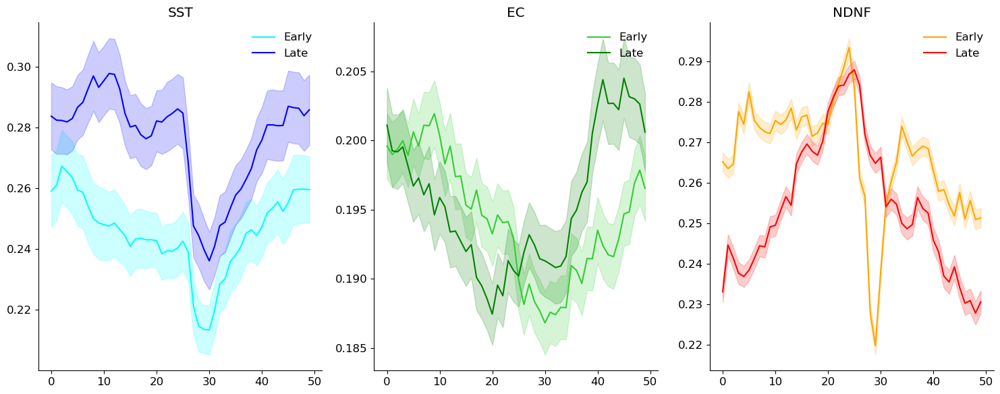

In [643]:
early_array_SST, late_array_SST = get_early_vs_late_activity(cell_SST_model_ranks20_contig_x00)
early_array_EC, late_array_EC = get_early_vs_late_activity(cell_EC_model_ranks20_contig_x00)
early_array_NDNF, late_array_NDNF = get_early_vs_late_activity(cell_NDNF_model_ranks20_contig_x00)

fig, axs = plt.subplots(1,3, figsize=(15,6))

mean_early_array_SST = np.mean(early_array_SST, axis=0)
sem_early_array_SST = sem(early_array_SST, axis=0)

axs[0].plot(mean_early_array_SST, color='cyan', label="Early")
axs[0].fill_between(range(len(mean_early_array_SST)), mean_early_array_SST+sem_early_array_SST, mean_early_array_SST-sem_early_array_SST, alpha=0.2, color='cyan')

mean_late_array_SST = np.mean(late_array_SST, axis=0)
sem_early_array_SST = sem(late_array_SST, axis=0)

axs[0].plot(mean_late_array_SST, color='b', label="Late")
axs[0].fill_between(range(len(mean_late_array_SST)), mean_late_array_SST+sem_early_array_SST, mean_late_array_SST-sem_early_array_SST, alpha=0.2, color='b')
axs[0].set_title("SST")
axs[0].legend()

mean_early_array_EC = np.mean(early_array_EC, axis=0)
sem_early_array_EC = sem(early_array_EC, axis=0)

axs[1].plot(mean_early_array_EC, color='limegreen', label='Early')
axs[1].fill_between(range(len(mean_early_array_EC)), mean_early_array_EC+sem_early_array_EC, mean_early_array_EC-sem_early_array_EC, alpha=0.2, color='limegreen')

mean_late_array_EC = np.mean(late_array_EC, axis=0)
sem_late_array_EC = sem(late_array_EC, axis=0)

axs[1].plot(mean_late_array_EC, color='green', label="Late")
axs[1].fill_between(range(len(mean_late_array_EC)), mean_late_array_EC+sem_late_array_EC, mean_late_array_EC-sem_late_array_EC, alpha=0.2, color='green')
axs[1].set_title("EC")
axs[1].legend()

mean_early_array_NDNF = np.mean(early_array_NDNF, axis=0)
sem_early_array_NDNF = sem(early_array_NDNF, axis=0)

axs[2].plot(mean_early_array_NDNF, label="Early", color='orange')
axs[2].fill_between(range(len(mean_early_array_NDNF)), mean_early_array_NDNF+sem_early_array_EC, mean_early_array_NDNF-sem_early_array_EC, alpha=0.2, color='orange')

mean_late_array_NDNF = np.mean(late_array_NDNF, axis=0)
sem_late_array_NDNF = sem(late_array_NDNF, axis=0)

axs[2].plot(mean_late_array_NDNF, label="Late", color='r')
axs[2].fill_between(range(len(mean_late_array_NDNF)), mean_late_array_NDNF+sem_late_array_EC, mean_late_array_NDNF-sem_late_array_EC, alpha=0.2, color='r')
axs[2].set_title("NDNF")
axs[2].legend()

plt.tight_layout()
plt.show()



69.86301369863014
(50, 100)


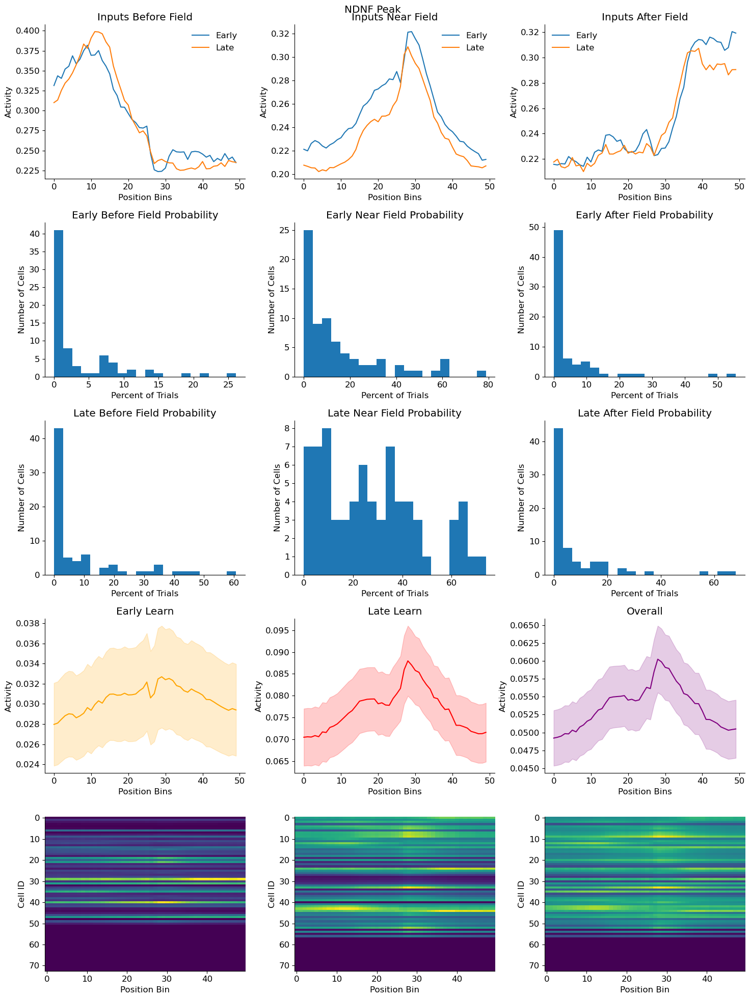

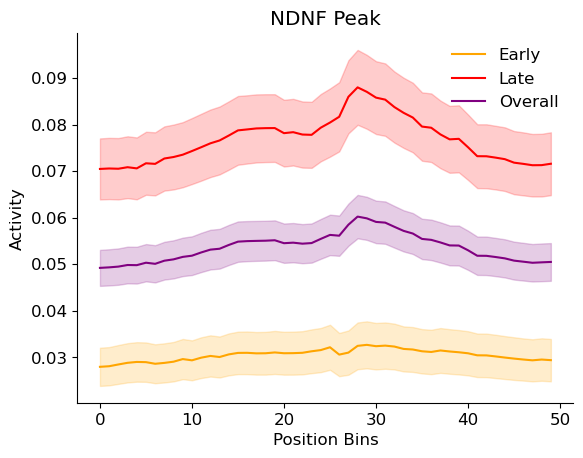

69.86301369863014
(50, 100)


In [645]:
reconstruct_activity_from_clusters(mean_before_field_array_early_peak_NDNF, mean_near_field_array_early_peak_NDNF, mean_after_field_array_early_peak_NDNF, mean_before_field_array_late_peak_NDNF, mean_near_field_array_late_peak_NDNF, mean_after_field_array_late_peak_NDNF, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_NDNF_early_trough, percent_of_cells_list_NDNF_late_trough, num_cells=73, cell_type="NDNF Peak", plot=True)
trial_averaged_cell_array_early_NDNF, trial_averaged_cell_array_late_NDNF, full_activity_trial_av_array_NDNF = reconstruct_activity_from_clusters(mean_before_field_array_early_peak_NDNF, mean_near_field_array_early_peak_NDNF, mean_after_field_array_early_peak_NDNF, mean_before_field_array_late_peak_NDNF, mean_near_field_array_late_peak_NDNF, mean_after_field_array_late_peak_NDNF, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_NDNF_early_trough, percent_of_cells_list_NDNF_late_trough, num_cells=73, cell_type="NDNF Peak", plot=False)



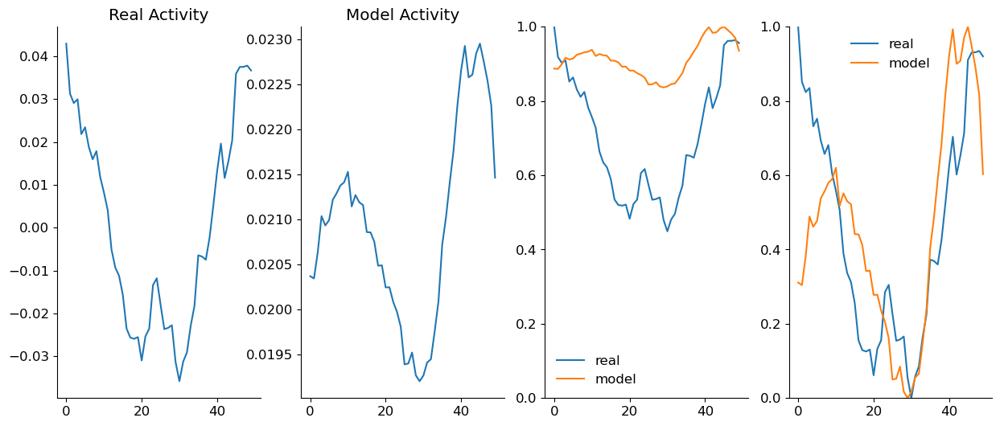

In [585]:
cell_list = []
for animal in residual_activity_dict_EC:
    for cell in residual_activity_dict_EC[animal]:
        cell_list.append(np.mean(residual_activity_dict_EC[animal][cell], axis=1))
        
        
cell_array = np.array(cell_list)
real_activity = np.mean(cell_array, axis=0)

fake_activity = np.mean(full_activity_trial_av_array_EC, axis=0)

fig, axs = plt.subplots(1,4, figsize=(15,6))
axs[0].plot(real_activity)
axs[0].set_title("Real Activity")

axs[1].plot(fake_activity)
axs[1].set_title("Model Activity")

real_activity_positive = real_activity+0.1

real_activity_norm = real_activity_positive / np.max(real_activity_positive)
fake_activity_norm = fake_activity / np.max(fake_activity)

real_activity_norm_max = (real_activity_positive - np.min(real_activity_positive)) / (np.max(real_activity_positive) - np.min(real_activity_positive))
fake_activity_norm_max = (fake_activity_norm - np.min(fake_activity_norm)) / (np.max(fake_activity_norm) - np.min(fake_activity_norm))

axs[2].plot(real_activity_norm, label="real")
axs[2].plot(fake_activity_norm, label="model")
axs[2].set_ylim(0,1)
axs[2].legend()

axs[3].plot(real_activity_norm_max, label="real")
axs[3].plot(fake_activity_norm_max, label="model")
axs[3].set_ylim(0,1)
axs[3].legend()

plt.show()

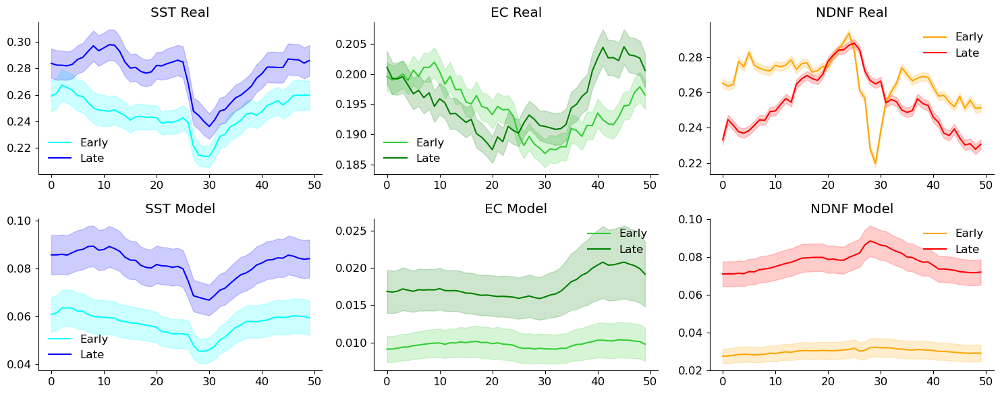

In [656]:
early_array_SST, late_array_SST = get_early_vs_late_activity(cell_SST_model_ranks20_contig_x00)
early_array_EC, late_array_EC = get_early_vs_late_activity(cell_EC_model_ranks20_contig_x00)
early_array_NDNF, late_array_NDNF = get_early_vs_late_activity(cell_NDNF_model_ranks20_contig_x00)

fig, axs = plt.subplots(2,3, figsize=(15,6))

mean_early_array_SST = np.mean(early_array_SST, axis=0)
sem_early_array_SST = sem(early_array_SST, axis=0)

axs[0,0].plot(mean_early_array_SST, color='cyan', label="Early")
axs[0,0].fill_between(range(len(mean_early_array_SST)), mean_early_array_SST+sem_early_array_SST, mean_early_array_SST-sem_early_array_SST, alpha=0.2, color='cyan')

mean_late_array_SST = np.mean(late_array_SST, axis=0)
sem_early_array_SST = sem(late_array_SST, axis=0)

axs[0,0].plot(mean_late_array_SST, color='b', label="Late")
axs[0,0].fill_between(range(len(mean_late_array_SST)), mean_late_array_SST+sem_early_array_SST, mean_late_array_SST-sem_early_array_SST, alpha=0.2, color='b')
axs[0,0].set_title("SST Real")
axs[0,0].legend()



mean_SST_early = np.mean(trial_averaged_cell_array_early_SST, axis=0)
sem_SST_early = sem(trial_averaged_cell_array_early_SST, axis=0)
mean_SST_late = np.mean(trial_averaged_cell_array_late_SST, axis=0)
sem_SST_late = sem(trial_averaged_cell_array_late_SST, axis=0)


axs[1,0].plot(mean_SST_early, label="Early", color='cyan')
axs[1,0].fill_between(range(len(mean_SST_early)), mean_SST_early+sem_SST_early, mean_SST_early-sem_SST_early, alpha=0.2, color='cyan')
axs[1,0].plot(mean_SST_late, label="Late", color='blue')
axs[1,0].fill_between(range(len(mean_SST_late)), mean_SST_late+sem_SST_late, mean_SST_late-sem_SST_late, alpha=0.2, color='blue')
axs[1,0].set_title("SST Model")
axs[1,0].legend()


mean_early_array_EC = np.mean(early_array_EC, axis=0)
sem_early_array_EC = sem(early_array_EC, axis=0)

axs[0,1].plot(mean_early_array_EC, color='limegreen', label='Early')
axs[0,1].fill_between(range(len(mean_early_array_EC)), mean_early_array_EC+sem_early_array_EC, mean_early_array_EC-sem_early_array_EC, alpha=0.2, color='limegreen')

mean_late_array_EC = np.mean(late_array_EC, axis=0)
sem_late_array_EC = sem(late_array_EC, axis=0)

axs[0,1].plot(mean_late_array_EC, color='green', label="Late")
axs[0,1].fill_between(range(len(mean_late_array_EC)), mean_late_array_EC+sem_late_array_EC, mean_late_array_EC-sem_late_array_EC, alpha=0.2, color='green')
axs[0,1].set_title("EC Real")
axs[0,1].legend()


mean_EC_early = np.mean(trial_averaged_cell_array_early_EC_peak, axis=0)
sem_EC_early = sem(trial_averaged_cell_array_early_EC_peak, axis=0)
mean_EC_late = np.mean(trial_averaged_cell_array_late_EC_peak, axis=0)
sem_EC_late = sem(trial_averaged_cell_array_late_EC_peak, axis=0)


axs[1,1].plot(mean_EC_early, label="Early", color='limegreen')
axs[1,1].fill_between(range(len(mean_EC_early)), mean_EC_early+sem_EC_early, mean_EC_early-sem_EC_early, alpha=0.2, color='limegreen')
axs[1,1].plot(mean_EC_late, label="Late", color='green')
axs[1,1].fill_between(range(len(mean_EC_late)), mean_EC_late+sem_EC_late, mean_EC_late-sem_EC_late, alpha=0.2, color='green')
axs[1,1].set_title("EC Model")
axs[1,1].legend()



mean_early_array_NDNF = np.mean(early_array_NDNF, axis=0)
sem_early_array_NDNF = sem(early_array_NDNF, axis=0)
mean_late_array_NDNF = np.mean(late_array_NDNF, axis=0)
sem_late_array_NDNF = sem(late_array_NDNF, axis=0)

axs[0,2].plot(mean_early_array_NDNF, label="Early", color='orange')
axs[0,2].fill_between(range(len(mean_early_array_NDNF)), mean_early_array_NDNF+sem_early_array_EC, mean_early_array_NDNF-sem_early_array_EC, alpha=0.2, color='orange')
axs[0,2].plot(mean_late_array_NDNF, label="Late", color='r')
axs[0,2].fill_between(range(len(mean_late_array_NDNF)), mean_late_array_NDNF+sem_late_array_EC, mean_late_array_NDNF-sem_late_array_EC, alpha=0.2, color='r')
axs[0,2].set_title("NDNF Real")
axs[0,2].legend()


mean_NDNF_early = np.mean(trial_averaged_cell_array_early_NDNF, axis=0)
sem_NDNF_early = sem(trial_averaged_cell_array_early_NDNF, axis=0)
mean_NDNF_late = np.mean(trial_averaged_cell_array_late_NDNF, axis=0)
sem_NDNF_late = sem(trial_averaged_cell_array_late_NDNF, axis=0)


axs[1,2].plot(mean_NDNF_early, label="Early", color='orange')
axs[1,2].fill_between(range(len(mean_NDNF_early)), mean_NDNF_early+sem_NDNF_early, mean_NDNF_early-sem_NDNF_early, alpha=0.2, color='orange')
axs[1,2].plot(mean_NDNF_late, label="Late", color='r')
axs[1,2].fill_between(range(len(mean_NDNF_late)), mean_NDNF_late+sem_NDNF_late, mean_NDNF_late-sem_NDNF_late, alpha=0.2, color='r')
axs[1,2].set_title("NDNF Model")
axs[1,2].legend()


plt.tight_layout()
plt.show()


(73, 50)

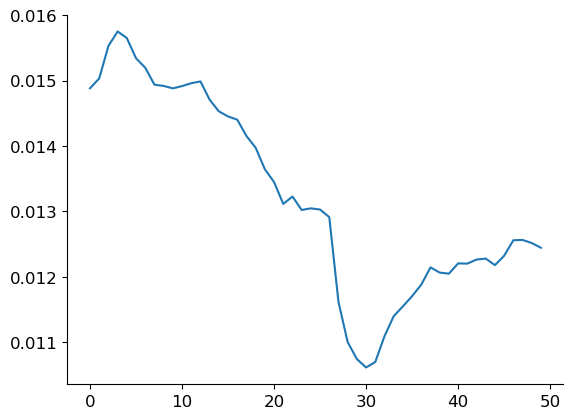

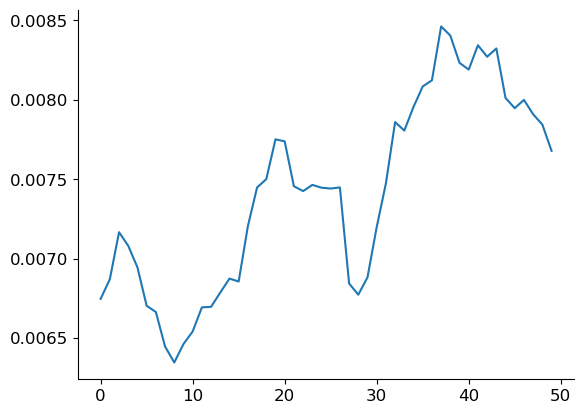

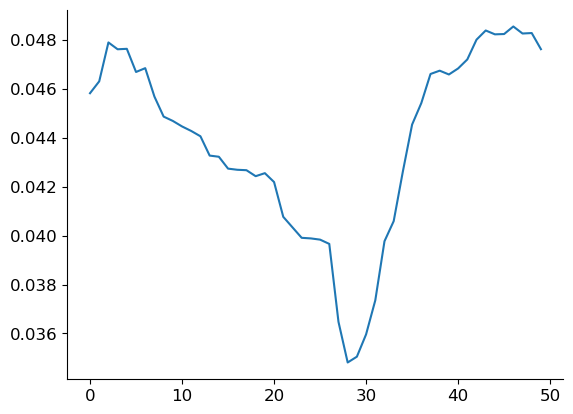

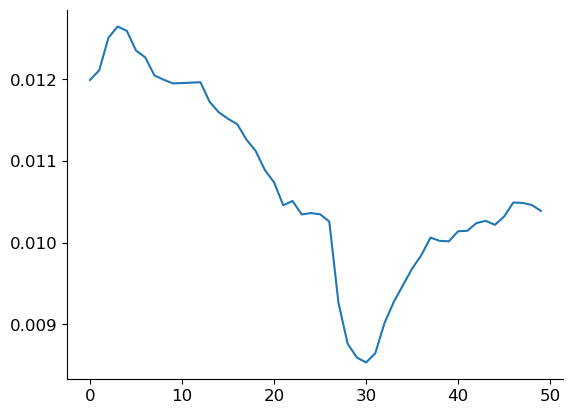

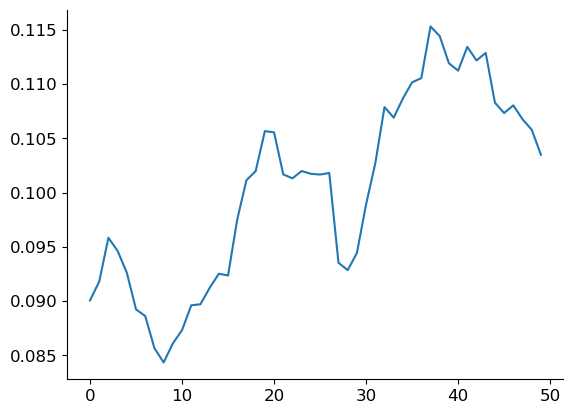

...

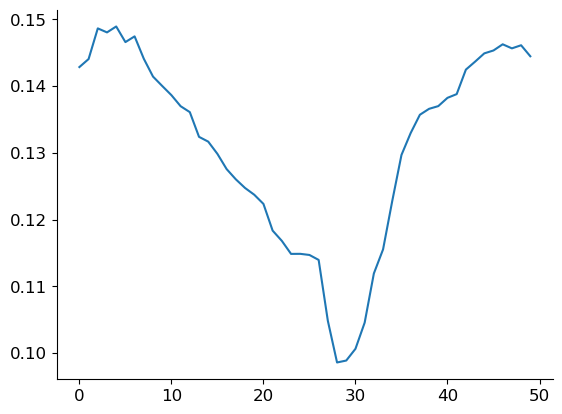

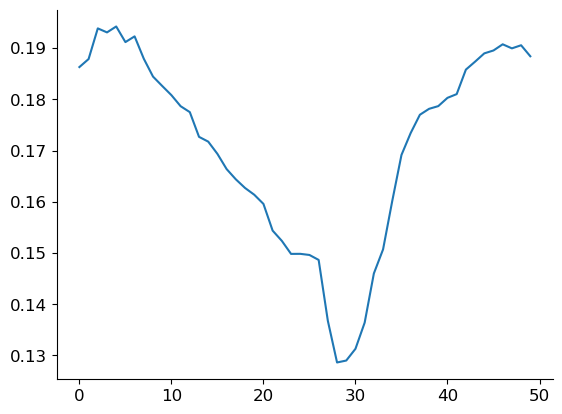

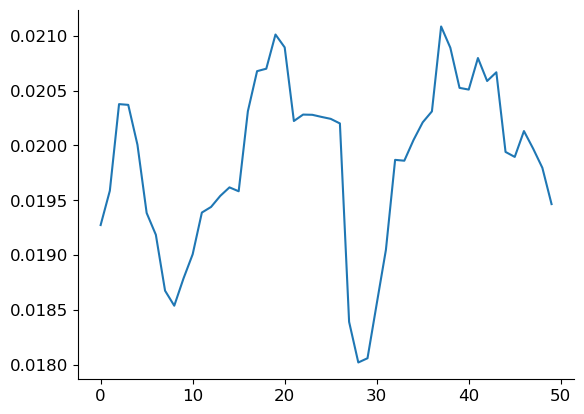

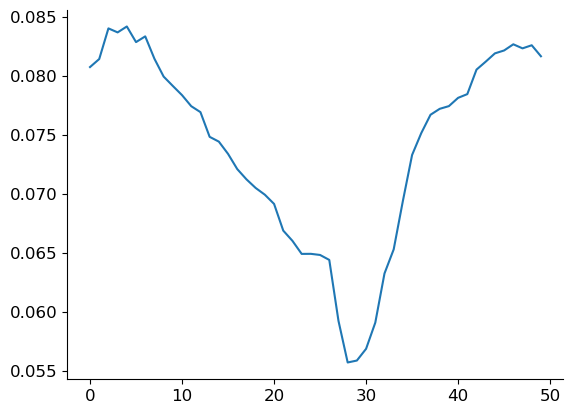

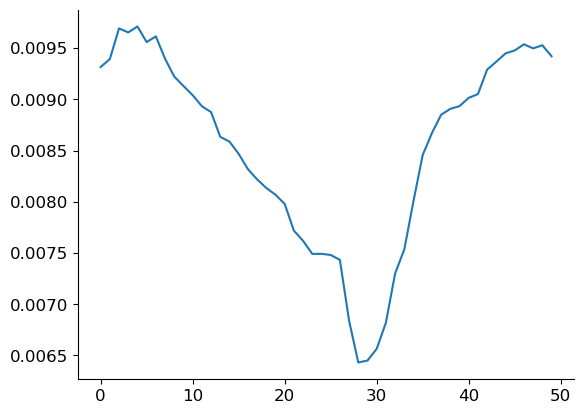

In [530]:
trial_averaged_cell_array_early.shape

for i in range(trial_averaged_cell_array_early.shape[0]):
    plt.plot(trial_averaged_cell_array_early[i,:])
    plt.show()

(50, 100)


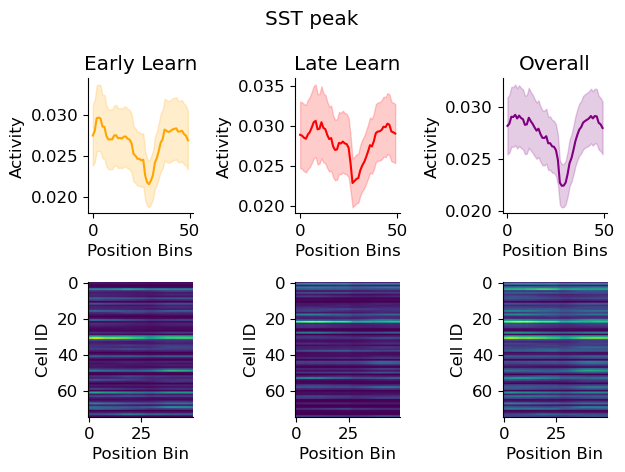

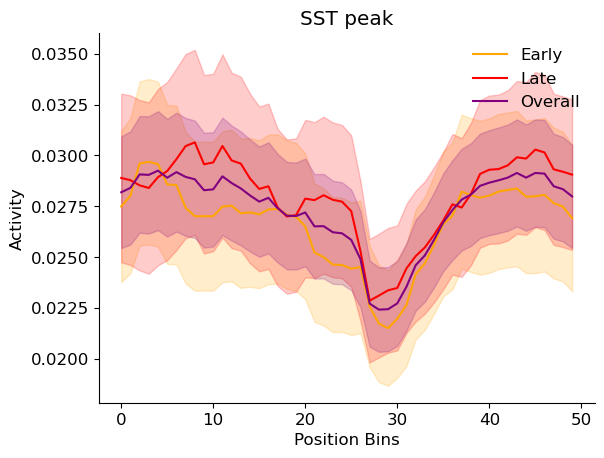

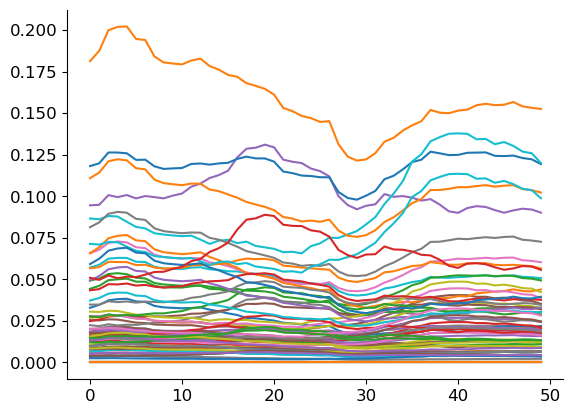

In [531]:
trial_averaged_cell_array_early, trial_averaged_cell_array_late = reconstruct_activity_from_clusters(mean_before_field_array_early_peak_SST, mean_near_field_array_early_peak_SST, mean_after_field_array_early_peak_SST, mean_before_field_array_late_peak_SST, mean_near_field_array_late_peak_SST, mean_after_field_array_late_peak_SST, percent_lists_SST_early_peak, percent_lists_SST_late_peak, num_cells=75, cell_type="SST peak")

trial_averaged_cell_array_early.shape

for i in range(trial_averaged_cell_array_early.shape[0]):
    plt.plot(trial_averaged_cell_array_early[i,:])

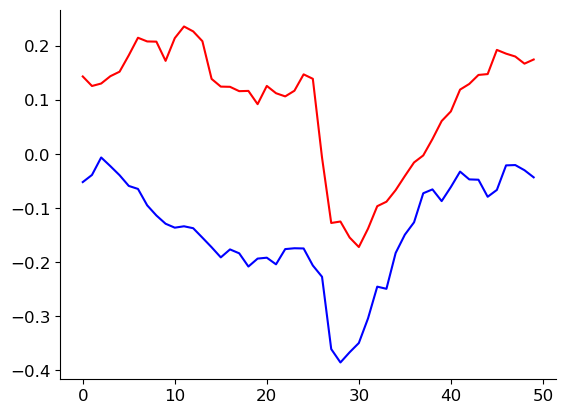

In [479]:
listy_early = []
listy_late = []

for animal in residual_activity_dict_SST:
    for cell in residual_activity_dict_SST[animal]:
        data = residual_activity_dict_SST[animal][cell]  # (bins, trials)
        num_trials = data.shape[1]
        quintile = num_trials // 5

        data_early = data[:, :quintile]       # first 20%
        data_late  = data[:, -quintile:]      # last 20%

        listy_early.append(np.mean(data_early, axis=1))  # mean across trials
        listy_late.append(np.mean(data_late, axis=1))

array_early = np.array(listy_early)  # shape (cells, bins)
array_late  = np.array(listy_late)

mean_early = np.mean(array_early, axis=0)
mean_late  = np.mean(array_late, axis=0)

plt.plot(mean_early, color='b')
plt.plot(mean_late, color='r')
plt.show()

In [271]:
animal_percent_dict_NDNF_early_peak, percent_lists_NDNF_early_peak = get_field_type_percents(clusters_dict_labelled_field_type_early_NDNF_peak, fixed_NDNF_new_residual_dict)
animal_percent_dict_NDNF_late_peak, percent_lists_NDNF_late_peak = get_field_type_percents(clusters_dict_labelled_field_type_late_NDNF_peak, fixed_NDNF_new_residual_dict)


animal_10 cell_2 → total trials: 390 total labeled: 5
animal_10 cell_3 → total trials: 390 total labeled: 60
animal_10 cell_4 → total trials: 390 total labeled: 20
animal_10 cell_5 → total trials: 390 total labeled: 5
animal_10 cell_6 → total trials: 390 total labeled: 5
animal_10 cell_7 → total trials: 390 total labeled: 5
animal_10 cell_8 → total trials: 390 total labeled: 115
animal_10 cell_9 → total trials: 390 total labeled: 5
animal_10 cell_10 → total trials: 390 total labeled: 25
animal_10 cell_11 → total trials: 390 total labeled: 100
animal_11 cell_2 → total trials: 172 total labeled: 15
animal_11 cell_3 → total trials: 172 total labeled: 30
animal_11 cell_4 → total trials: 172 total labeled: 30
animal_11 cell_5 → total trials: 172 total labeled: 65
animal_11 cell_6 → total trials: 172 total labeled: 45
animal_11 cell_7 → total trials: 172 total labeled: 40
animal_11 cell_8 → total trials: 172 total labeled: 30
animal_11 cell_9 → total trials: 172 total labeled: 30
animal_12 c

In [272]:
animal_percent_dict_NDNF_early_trough, percent_lists_NDNF_early_trough = get_field_type_percents(clusters_dict_labelled_field_type_early_NDNF_trough, fixed_NDNF_new_residual_dict)
animal_percent_dict_NDNF_late_trough, percent_lists_NDNF_late_trough = get_field_type_percents(clusters_dict_labelled_field_type_late_NDNF_trough, fixed_NDNF_new_residual_dict)


animal_10 cell_2 → total trials: 390 total labeled: 5
animal_10 cell_3 → total trials: 390 total labeled: 60
animal_10 cell_4 → total trials: 390 total labeled: 20
animal_10 cell_5 → total trials: 390 total labeled: 5
animal_10 cell_6 → total trials: 390 total labeled: 5
animal_10 cell_7 → total trials: 390 total labeled: 5
animal_10 cell_8 → total trials: 390 total labeled: 115
animal_10 cell_9 → total trials: 390 total labeled: 5
animal_10 cell_10 → total trials: 390 total labeled: 25
animal_10 cell_11 → total trials: 390 total labeled: 100
animal_11 cell_2 → total trials: 172 total labeled: 15
animal_11 cell_3 → total trials: 172 total labeled: 30
animal_11 cell_4 → total trials: 172 total labeled: 30
animal_11 cell_5 → total trials: 172 total labeled: 65
animal_11 cell_6 → total trials: 172 total labeled: 45
animal_11 cell_7 → total trials: 172 total labeled: 40
animal_11 cell_8 → total trials: 172 total labeled: 30
animal_11 cell_9 → total trials: 172 total labeled: 30
animal_12 c

In [466]:
animal_percent_dict_EC_early_peak, percent_lists_EC_early_peak = get_field_type_percents(clusters_dict_labelled_field_type_early_EC_peak, residual_activity_dict_EC)
animal_percent_dict_EC_late_peak, percent_lists_EC_late_peak = get_field_type_percents(clusters_dict_labelled_field_type_late_EC_peak, residual_activity_dict_EC)

animal_percent_dict_EC_early_trough, percent_lists_EC_early_trough = get_field_type_percents(clusters_dict_labelled_field_type_early_EC_trough, residual_activity_dict_EC)
animal_percent_dict_EC_late_trough, percent_lists_EC_late_trough = get_field_type_percents(clusters_dict_labelled_field_type_late_EC_trough, residual_activity_dict_EC)


animal_1 cell_1 → total trials: 78 total labeled: 40
animal_1 cell_2 → total trials: 78 total labeled: 10
animal_1 cell_3 → total trials: 78 total labeled: 20
animal_1 cell_4 → total trials: 78 total labeled: 40
animal_1 cell_5 → total trials: 78 total labeled: 20
animal_1 cell_6 → total trials: 78 total labeled: 35
animal_1 cell_7 → total trials: 78 total labeled: 15
animal_1 cell_8 → total trials: 78 total labeled: 5
animal_1 cell_9 → total trials: 78 total labeled: 50
animal_1 cell_10 → total trials: 78 total labeled: 65
animal_1 cell_11 → total trials: 78 total labeled: 25
animal_1 cell_12 → total trials: 78 total labeled: 35
animal_1 cell_13 → total trials: 78 total labeled: 20
animal_1 cell_14 → total trials: 78 total labeled: 30
animal_1 cell_15 → total trials: 78 total labeled: 30
animal_1 cell_16 → total trials: 78 total labeled: 50
animal_1 cell_17 → total trials: 78 total labeled: 5
animal_1 cell_18 → total trials: 78 total labeled: 10
animal_1 cell_19 → total trials: 78 tot

animal_2 cell_55 → total trials: 66 total labeled: 55
animal_2 cell_56 → total trials: 66 total labeled: 5
animal_2 cell_57 → total trials: 66 total labeled: 20
animal_2 cell_58 → total trials: 66 total labeled: 10
animal_2 cell_59 → total trials: 66 total labeled: 25
animal_2 cell_60 → total trials: 66 total labeled: 25
animal_2 cell_61 → total trials: 66 total labeled: 15
animal_2 cell_62 → total trials: 66 total labeled: 55
animal_2 cell_63 → total trials: 66 total labeled: 5
animal_2 cell_64 → total trials: 66 total labeled: 10
animal_2 cell_65 → total trials: 66 total labeled: 15
animal_2 cell_66 → total trials: 66 total labeled: 5
animal_2 cell_67 → total trials: 66 total labeled: 20
animal_2 cell_68 → total trials: 66 total labeled: 5
animal_2 cell_69 → total trials: 66 total labeled: 25
animal_2 cell_70 → total trials: 66 total labeled: 55
animal_2 cell_71 → total trials: 66 total labeled: 45
animal_2 cell_72 → total trials: 66 total labeled: 15
animal_2 cell_73 → total trials:

In [467]:
animal_percent_dict_SST_early_peak, percent_lists_SST_early_peak = get_field_type_percents(clusters_dict_labelled_field_type_early_SST_peak, residual_activity_dict_SST)
animal_percent_dict_SST_late_peak, percent_lists_SST_late_peak = get_field_type_percents(clusters_dict_labelled_field_type_late_SST_peak, residual_activity_dict_SST)

animal_percent_dict_SST_early_trough, percent_lists_SST_early_trough = get_field_type_percents(clusters_dict_labelled_field_type_early_SST_trough, residual_activity_dict_SST)
animal_percent_dict_SST_late_trough, percent_lists_SST_late_trough = get_field_type_percents(clusters_dict_labelled_field_type_late_SST_trough, residual_activity_dict_SST)


animal_1 cell_2 → total trials: 212 total labeled: 15
animal_1 cell_3 → total trials: 212 total labeled: 10
animal_1 cell_4 → total trials: 212 total labeled: 35
animal_1 cell_5 → total trials: 212 total labeled: 10
animal_1 cell_6 → total trials: 212 total labeled: 90
animal_2 cell_2 → total trials: 152 total labeled: 35
animal_2 cell_3 → total trials: 152 total labeled: 10
animal_2 cell_4 → total trials: 152 total labeled: 65
animal_2 cell_5 → total trials: 152 total labeled: 35
animal_2 cell_6 → total trials: 152 total labeled: 115
animal_2 cell_7 → total trials: 152 total labeled: 115
animal_2 cell_8 → total trials: 152 total labeled: 25
animal_2 cell_9 → total trials: 152 total labeled: 60
animal_2 cell_10 → total trials: 152 total labeled: 25
animal_2 cell_11 → total trials: 152 total labeled: 40
animal_2 cell_12 → total trials: 152 total labeled: 25
animal_2 cell_13 → total trials: 152 total labeled: 60
animal_2 cell_14 → total trials: 152 total labeled: 45
animal_2 cell_15 → to

In [276]:
def get_count(animal_percent_dict_EC_early_peak, field_type="before_percent"):
    count_early = 0
    total_count = 0
    for animal in animal_percent_dict_EC_early_peak: #['animal_1']['cell_2']["before_percent"]:
        for cell in animal_percent_dict_EC_early_peak[animal]:
            if animal_percent_dict_EC_early_peak[animal][cell][field_type] > 0.0:
                count_early+=1
                
            if animal_percent_dict_EC_early_peak[animal][cell]:
                total_count+=1
    
    probability = count_early / total_count
    
    return probability
      

In [591]:
percent_of_cells_list_NDNF_early_peak, percent_of_cells_list_NDNF_late_peak, percent_of_cells_list_NDNF_early_trough, percent_of_cells_list_NDNF_late_trough = get_cells_percents(animal_percent_dict_NDNF_early_peak, animal_percent_dict_NDNF_late_peak, animal_percent_dict_NDNF_early_trough, animal_percent_dict_NDNF_late_trough)
percent_of_cells_list_SST_early_peak, percent_of_cells_list_SST_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough = get_cells_percents(animal_percent_dict_SST_early_peak, animal_percent_dict_SST_late_peak, animal_percent_dict_SST_early_trough, animal_percent_dict_SST_late_trough)
percent_of_cells_list_EC_early_peak, percent_of_cells_list_EC_late_peak, percent_of_cells_list_EC_early_trough, percent_of_cells_list_EC_late_trough = get_cells_percents(animal_percent_dict_EC_early_peak, animal_percent_dict_EC_late_peak, animal_percent_dict_EC_early_trough, animal_percent_dict_EC_late_trough)


(73,)


(array([43.,  9.,  3.,  2.,  3.,  5.,  3.,  1.,  0.,  1.,  0.,  0.,  0.,
         0.,  0.,  0.,  1.,  0.,  1.,  1.]),
 array([ 0.        ,  1.8722467 ,  3.74449339,  5.61674009,  7.48898678,
         9.36123348, 11.23348018, 13.10572687, 14.97797357, 16.85022026,
        18.72246696, 20.59471366, 22.46696035, 24.33920705, 26.21145374,
        28.08370044, 29.95594714, 31.82819383, 33.70044053, 35.57268722,
        37.44493392]),
 <BarContainer object of 20 artists>)

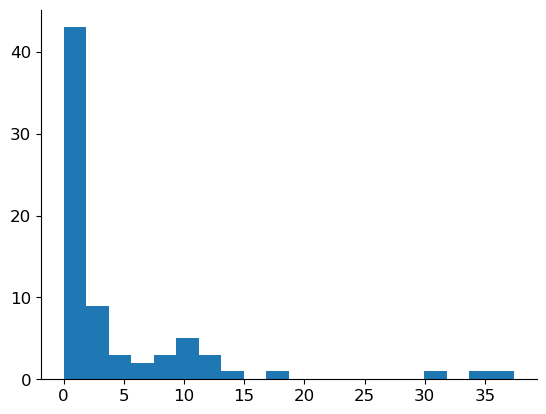

In [535]:

before_percent_array = np.array(percent_lists_NDNF_early_trough[0])
print(before_percent_array.shape)
plt.hist(before_percent_array, bins=20)

In [587]:
len(percent_of_cells_list_NDNF_early_trough)

5

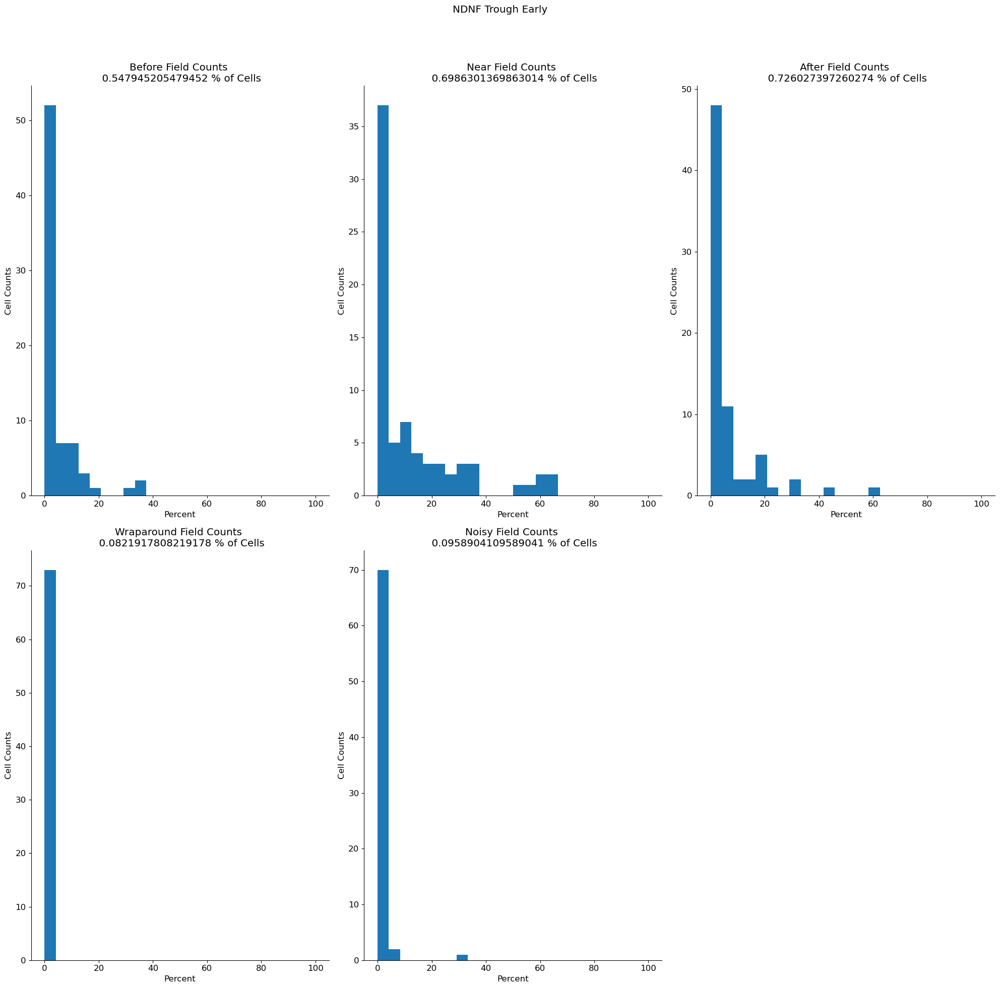

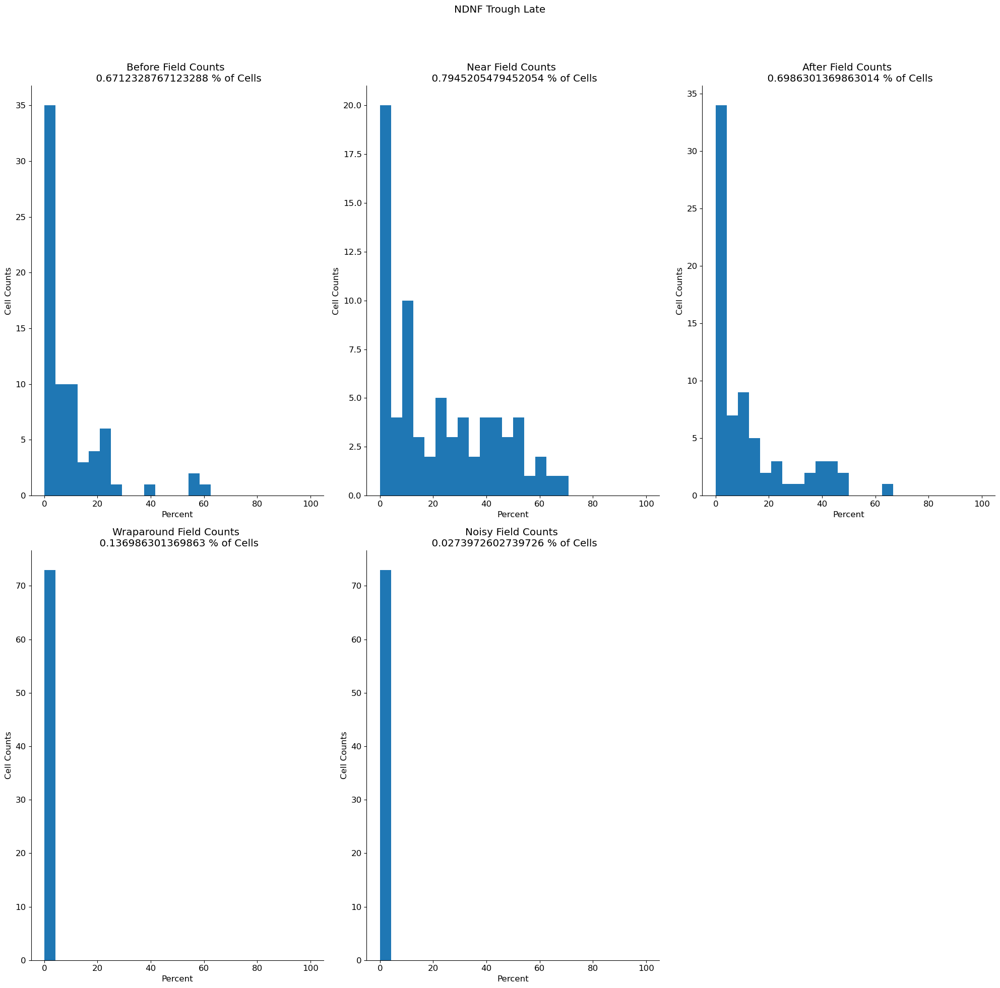

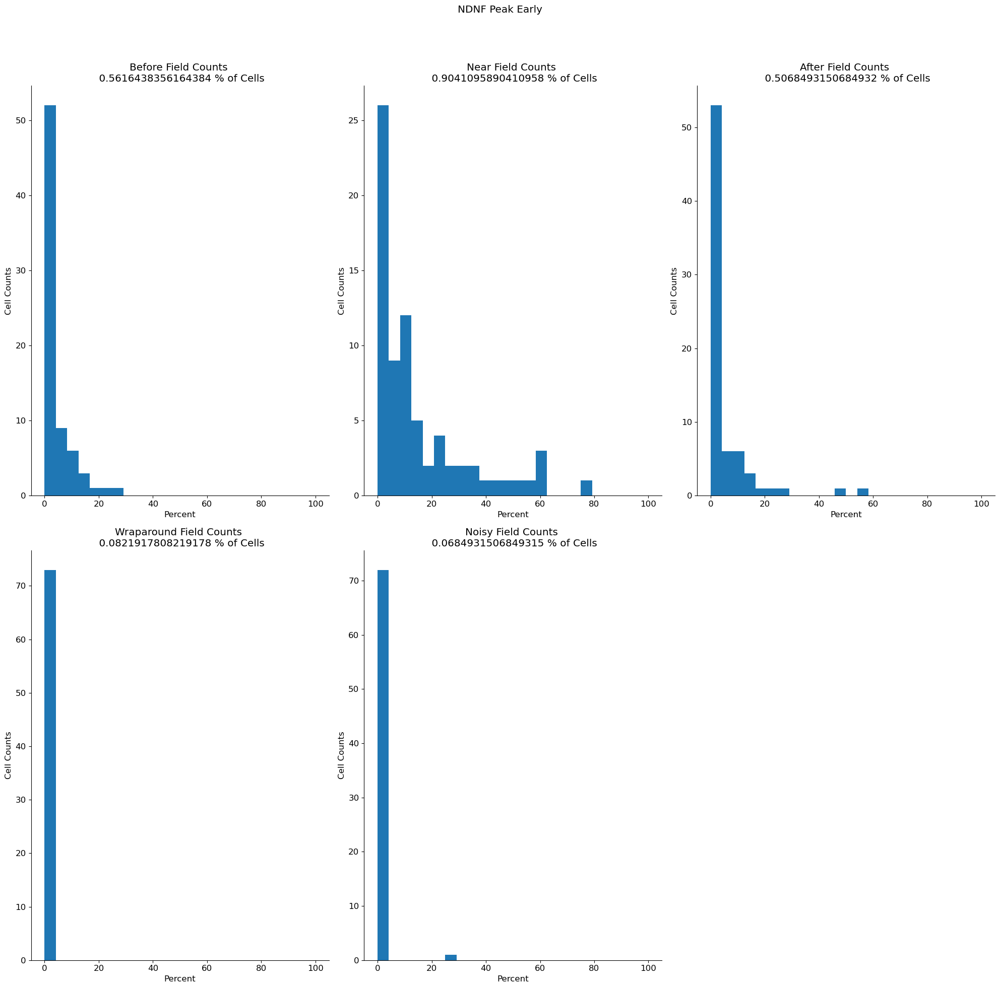

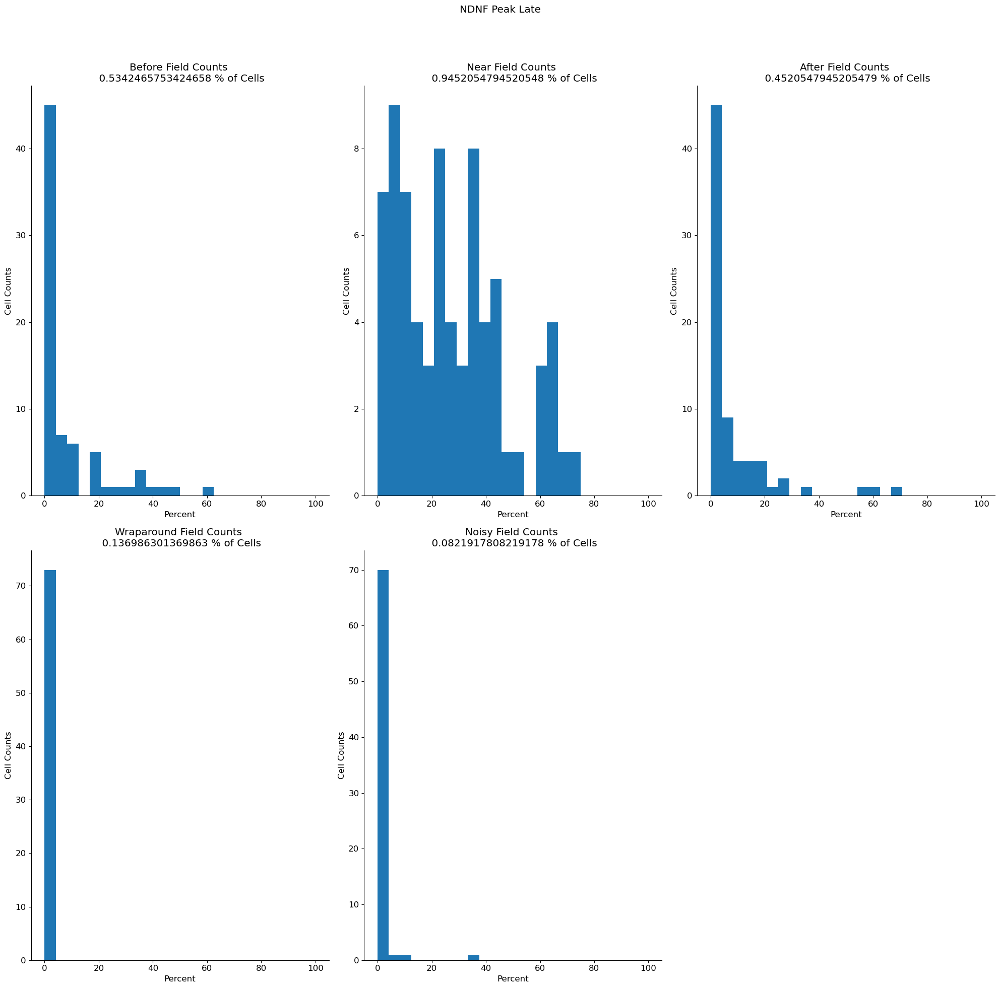

In [280]:
def plot_percent_peak_trough(percent_lists_SST_early_trough, overall_animal_cluster_trial_averages_EC_peak, percent_of_cells, suptitle="SST Trough Early"):
    fig, axs = plt.subplots(2, 3, figsize = (20, 20))
    plt.suptitle(suptitle)
    bins = np.linspace(0, 100, 25)
    
#     percent_of_cells = get_cluster_expresion_percent_of_cells(overall_animal_cluster_trial_averages_EC_peak)

    before_percent_array = np.array(percent_lists_SST_early_trough[0])
    axs[0, 0].hist(before_percent_array, bins=bins)
    axs[0, 0].set_title(f"Before Field Counts \n {percent_of_cells[0]} % of Cells")
    axs[0, 0].set_ylabel("Cell Counts")
    axs[0, 0].set_xlabel("Percent")

    near_percent_array = np.array(percent_lists_SST_early_trough[1])
    axs[0, 1].hist(near_percent_array, bins=bins)
    axs[0, 1].set_title(f"Near Field Counts \n {percent_of_cells[1]} % of Cells")
    axs[0, 1].set_ylabel("Cell Counts")
    axs[0, 1].set_xlabel("Percent")

    after_percent_array = np.array(percent_lists_SST_early_trough[2])
    axs[0, 2].hist(after_percent_array, bins=bins)
    axs[0, 2].set_title(f"After Field Counts \n {percent_of_cells[2]} % of Cells")
    axs[0, 2].set_ylabel("Cell Counts")
    axs[0, 2].set_xlabel("Percent")


    wraparound_percent_array = np.array(percent_lists_SST_early_trough[3])
    axs[1, 0].hist(wraparound_percent_array, bins=bins)
    axs[1, 0].set_title(f"Wraparound Field Counts \n {percent_of_cells[3]} % of Cells")
    axs[1, 0].set_ylabel("Cell Counts")
    axs[1, 0].set_xlabel("Percent")

    bins = np.linspace(0, 100, 25)
    noisy_percent_array = np.array(percent_lists_SST_early_trough[4])
    axs[1, 1].hist(noisy_percent_array, bins=bins)
    axs[1, 1].set_title(f"Noisy Field Counts \n {percent_of_cells[4]} % of Cells")
    axs[1, 1].set_ylabel("Cell Counts")
    axs[1, 1].set_xlabel("Percent")

    axs[1, 2].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # [left, bottom, right, top]
    plt.show()
    
plot_percent_peak_trough(percent_lists_NDNF_early_trough, overall_animal_cluster_trial_averages_NDNF_overall_early, percent_of_cells_list_NDNF_early_trough, suptitle="NDNF Trough Early")
plot_percent_peak_trough(percent_lists_NDNF_late_trough, overall_animal_cluster_trial_averages_NDNF_overall_late, percent_of_cells_list_NDNF_late_trough, suptitle="NDNF Trough Late")

plot_percent_peak_trough(percent_lists_NDNF_early_peak, overall_animal_cluster_trial_averages_NDNF_overall_early, percent_of_cells_list_NDNF_early_peak, suptitle="NDNF Peak Early")
plot_percent_peak_trough(percent_lists_NDNF_late_peak, overall_animal_cluster_trial_averages_NDNF_overall_late, percent_of_cells_list_NDNF_late_peak, suptitle="NDNF Peak Late")

In [282]:
import numpy as np

def generate_gaussian(length=50, peak_position=25, std=5, amplitude=1.0):
    """
    Generate a Gaussian array of given length, peaking at `peak_position`.

    Parameters:
    - length: total number of bins (default 50)
    - peak_position: where the Gaussian peaks (can be float)
    - std: standard deviation of the Gaussian
    - amplitude: height of the peak

    Returns:
    - 1D numpy array of shape (length,)
    """
    x = np.arange(length)
    gaussian = amplitude * np.exp(-0.5 * ((x - peak_position) / std) ** 2)
    return gaussian


In [593]:
percent_of_cells_list_SST_early_trough[0]

0.56

88.0
(50, 100)


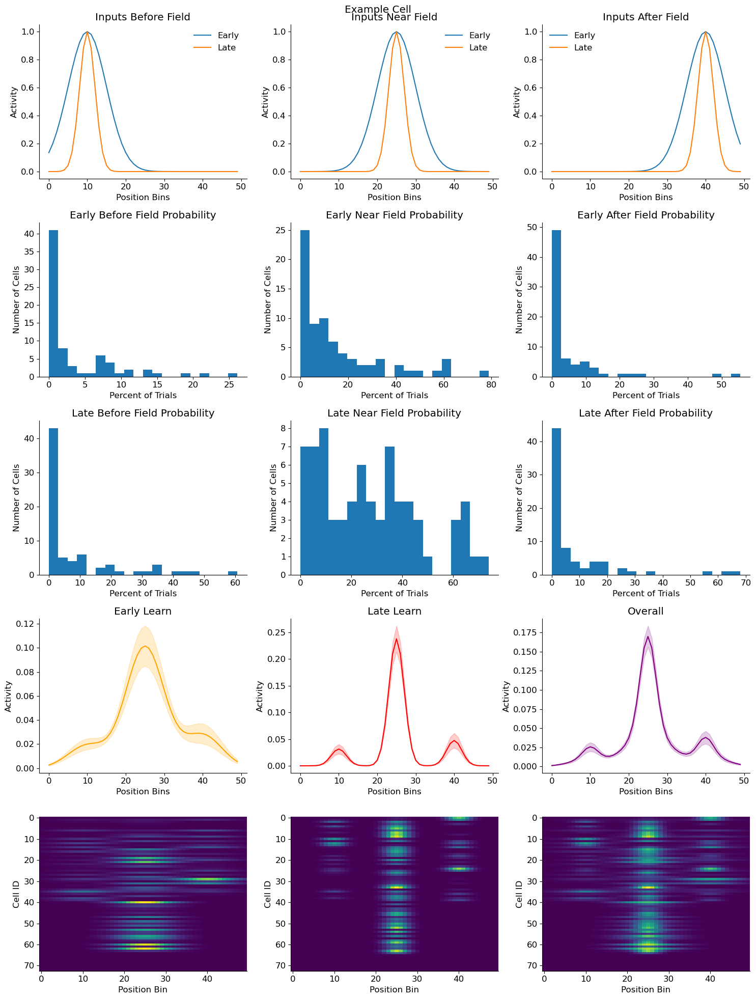

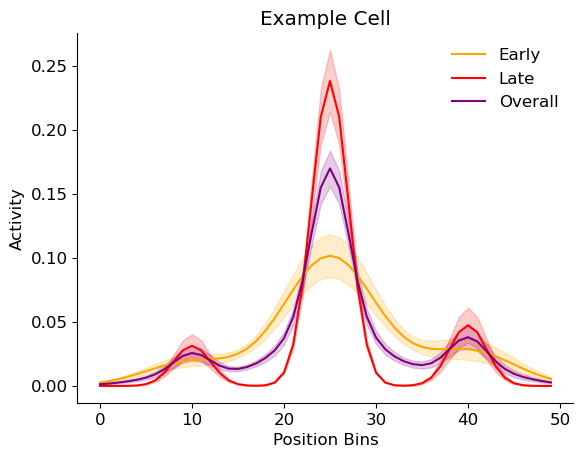

In [598]:



def reconstruct_activity_from_clusters(example_before_field_early, example_near_field_early, example_after_field_early, example_before_field_late, example_near_field_late, example_after_field_late, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, num_cells=73, cell_type="SST Trough", plot=False):

    before_percent_array = np.array(percent_lists_NDNF_early_peak[0])
    near_percent_array = np.array(percent_lists_NDNF_early_peak[1])
    after_percent_array = np.array(percent_lists_NDNF_early_peak[2])

    before_percent_array_late = np.array(percent_lists_NDNF_late_peak[0])
    near_percent_array_late = np.array(percent_lists_NDNF_late_peak[1])
    after_percent_array_late = np.array(percent_lists_NDNF_late_peak[2])


    trial_averaged_cell_list_early = []
    trial_averaged_cell_list_late = []

    cell_list_early = []
    cell_list_late = []
    
    available_trials_before_early = percent_of_cells_list_SST_early_trough[0]*100
    available_trials_near_early = percent_of_cells_list_SST_early_trough[1]*100
    print(available_trials_near_early)
    available_trials_after_early = percent_of_cells_list_SST_early_trough[2]*100

    available_trials_before_late = percent_of_cells_list_SST_late_trough[0]*100
    available_trials_near_late = percent_of_cells_list_SST_late_trough[1]*100
    available_trials_after_late = percent_of_cells_list_SST_late_trough[2]*100


#     for i in range(num_cells):
#         cell_array = np.zeros((50,100))
#         cell_array_late = np.zeros((50,100))

#         num_trials_to_assign_before = int(before_percent_array[i])
#         num_trials_to_assign_near = int(near_percent_array[i])
#         num_trials_to_assign_after = int(after_percent_array[i])

#         num_trials_to_assign_before_late = int(before_percent_array_late[i])
#         num_trials_to_assign_near_late = int(near_percent_array_late[i])
#         num_trials_to_assign_after_late = int(after_percent_array_late[i])
        
# #         available_trials = np.arange(100)
#         np.random.shuffle(available_trials)

#         trial_indices_before_late = available_trials_before_early[:num_trials_to_assign_before]
#         trial_indices_near = available_trials_near_early[num_trials_to_assign_before : num_trials_to_assign_before + num_trials_to_assign_near]
#         trial_indices_after = available_trials_after_early[num_trials_to_assign_before + num_trials_to_assign_near :
#                                                num_trials_to_assign_before + num_trials_to_assign_near + num_trials_to_assign_after]


#         available_trials_late = np.arange(100)
#         np.random.shuffle(available_trials_late)

#         trial_indices_before_late = available_trials_late[num_trials_to_assign_before_late]
#         trial_indices_near_late = available_trials_late[num_trials_to_assign_before_late :
#                                                         num_trials_to_assign_before_late + num_trials_to_assign_near_late]
#         trial_indices_after_late = available_trials_late[num_trials_to_assign_before_late + num_trials_to_assign_near_late :
#                                                          num_trials_to_assign_before_late + num_trials_to_assign_near_late + num_trials_to_assign_after_late]


#         for t in trial_indices_before:
#             cell_array[:, t] = example_before_field_early
#         for t in trial_indices_near:
#             cell_array[:, t] = example_near_field_early
#         for t in trial_indices_after:
#             cell_array[:, t] = example_after_field_early

#         for t in trial_indices_before_late:
#             cell_array_late[:, t] = example_before_field_late
#         for t in trial_indices_near_late:
#             cell_array_late[:, t] = example_near_field_late
#         for t in trial_indices_after_late:
#             cell_array_late[:, t] = example_after_field_late

#         cell_list_early.append(cell_array)
#         cell_list_late.append(cell_array_late)

#         trial_averaged_cell_list_early.append(np.mean(cell_array, axis=1))
#         trial_averaged_cell_list_late.append(np.mean(cell_array_late, axis=1))


    for i in range(num_cells):
        cell_array = np.zeros((50,100))
        cell_array_late = np.zeros((50,100))

        # Only assign fields if this cell is allowed to express that field
        if i < int(percent_of_cells_list_SST_early_trough[0] * num_cells):
            trial_indices_before = np.random.choice(100, int(before_percent_array[i]), replace=False)
            for t in trial_indices_before:
                cell_array[:, t] = example_before_field_early

        if i < int(percent_of_cells_list_SST_early_trough[1] * num_cells):
            trial_indices_near = np.random.choice(100, int(near_percent_array[i]), replace=False)
            for t in trial_indices_near:
                cell_array[:, t] = example_near_field_early

        if i < int(percent_of_cells_list_SST_early_trough[2] * num_cells):
            trial_indices_after = np.random.choice(100, int(after_percent_array[i]), replace=False)
            for t in trial_indices_after:
                cell_array[:, t] = example_after_field_early

        # Same logic for late phase
        if i < int(percent_of_cells_list_SST_late_trough[0] * num_cells):
            trial_indices_before_late = np.random.choice(100, int(before_percent_array_late[i]), replace=False)
            for t in trial_indices_before_late:
                cell_array_late[:, t] = example_before_field_late

        if i < int(percent_of_cells_list_SST_late_trough[1] * num_cells):
            trial_indices_near_late = np.random.choice(100, int(near_percent_array_late[i]), replace=False)
            for t in trial_indices_near_late:
                cell_array_late[:, t] = example_near_field_late

        if i < int(percent_of_cells_list_SST_late_trough[2] * num_cells):
            trial_indices_after_late = np.random.choice(100, int(after_percent_array_late[i]), replace=False)
            for t in trial_indices_after_late:
                cell_array_late[:, t] = example_after_field_late

        # Save results
        cell_list_early.append(cell_array)
        cell_list_late.append(cell_array_late)
        trial_averaged_cell_list_early.append(np.mean(cell_array, axis=1))
        trial_averaged_cell_list_late.append(np.mean(cell_array_late, axis=1))


    full_activity_list = []
    full_activity_trial_av_list = []

    for i in range(len(cell_list_early)):
        early_component = cell_list_early[i]
        late_component = cell_list_late[i]

        full_actiivty = np.concatenate([early_component, late_component], axis=1)

        full_activity_list.append(full_actiivty)

        full_activity_trial_av_list.append(np.mean(full_actiivty, axis=1))

    
    full_activity_trial_av_array = np.array(full_activity_trial_av_list)
    
    trial_averaged_cell_array_early = np.array(trial_averaged_cell_list_early)
    print(cell_list_early[0].shape)
    trial_averaged_cell_array_late = np.array(trial_averaged_cell_list_late)
    
    if plot: 
        fig, axs = plt.subplots(5, 3, figsize=(15,20))
        plt.suptitle(cell_type)


        axs[0,0].plot(example_before_field_early, label="Early")
        axs[0,0].plot(example_before_field_late, label="Late")
        axs[0,0].legend()
        axs[0,0].set_title("Inputs Before Field")
        axs[0,0].set_ylabel("Activity")
        axs[0,0].set_xlabel("Position Bins")
        axs[0,0].legend()


        axs[0,1].plot(example_near_field_early, label="Early")
        axs[0,1].plot(example_near_field_late, label="Late")
        axs[0,1].legend()
        axs[0,1].set_title("Inputs Near Field")
        axs[0,1].set_ylabel("Activity")
        axs[0,1].set_xlabel("Position Bins")
        axs[0,1].legend()


        axs[0,2].plot(example_after_field_early, label="Early")
        axs[0,2].plot(example_after_field_late, label="Late")
        axs[0,2].legend()
        axs[0,2].set_title("Inputs After Field")
        axs[0,2].set_ylabel("Activity")
        axs[0,2].set_xlabel("Position Bins")
        axs[0,2].legend()

        
        axs[1,0].hist(before_percent_array, bins=20)
        axs[1,0].set_title("Early Before Field Probability")
        axs[1,0].set_ylabel("Number of Cells")
        axs[1,0].set_xlabel("Percent of Trials")

        axs[1,1].hist(near_percent_array, bins=20)
        axs[1,1].set_title("Early Near Field Probability")
        axs[1,1].set_ylabel("Number of Cells")
        axs[1,1].set_xlabel("Percent of Trials")

        axs[1,2].hist(after_percent_array, bins=20)
        axs[1,2].set_title("Early After Field Probability")
        axs[1,2].set_ylabel("Number of Cells")
        axs[1,2].set_xlabel("Percent of Trials")

        axs[2,0].hist(before_percent_array_late, bins=20)
        axs[2,0].set_title("Late Before Field Probability")
        axs[2,0].set_ylabel("Number of Cells")
        axs[2,0].set_xlabel("Percent of Trials")

        axs[2,1].hist(near_percent_array_late, bins=20)
        axs[2,1].set_title("Late Near Field Probability")
        axs[2,1].set_ylabel("Number of Cells")
        axs[2,1].set_xlabel("Percent of Trials")

        axs[2,2].hist(after_percent_array_late, bins=20)
        axs[2,2].set_title("Late After Field Probability")
        axs[2,2].set_ylabel("Number of Cells")
        axs[2,2].set_xlabel("Percent of Trials")

        axs[4,0].imshow(trial_averaged_cell_array_early, aspect='auto')
        axs[4,0].set_ylabel("Cell ID")
        axs[4,0].set_xlabel("Position Bin")

        means_early = np.mean(trial_averaged_cell_array_early, axis=0)
        sems_early = sem(trial_averaged_cell_array_early, axis=0)
        axs[3,0].plot(means_early, color='orange')
        axs[3,0].fill_between(range(len(means_early)), means_early+sems_early, means_early-sems_early, alpha=0.2, color='orange')
        axs[3,0].set_xlabel("Position Bins")
        axs[3,0].set_ylabel("Activity")
        axs[3,0].set_title("Early Learn")

        axs[4,1].imshow(trial_averaged_cell_array_late, aspect='auto')
        axs[4,1].set_ylabel("Cell ID")
        axs[4,1].set_xlabel("Position Bin")

        means_late = np.mean(trial_averaged_cell_array_late, axis=0)
        sems_late = sem(trial_averaged_cell_array_late, axis=0)
        axs[3,1].plot(means_late, color='r')
        axs[3,1].fill_between(range(len(means_late)), means_late+sems_late, means_late-sems_late, alpha=0.2, color='r')
        axs[3,1].set_xlabel("Position Bins")
        axs[3,1].set_ylabel("Activity")
        axs[3,1].set_title("Late Learn")

        axs[4,2].imshow(full_activity_trial_av_array, aspect='auto')
        axs[4,2].set_ylabel("Cell ID")
        axs[4,2].set_xlabel("Position Bin")


        means_overall= np.mean(full_activity_trial_av_list, axis=0)
        sems_overall= sem(full_activity_trial_av_list, axis=0)
        axs[3,2].plot(means_overall, color='purple')
        axs[3,2].fill_between(range(len(means_overall)), means_overall+sems_overall, means_overall-sems_overall, alpha=0.2, color='purple')
        axs[3,2].set_xlabel("Position Bins")
        axs[3,2].set_ylabel("Activity")
        axs[3,2].set_title("Overall")

        plt.tight_layout()
        plt.show()


        plt.plot(means_early, color='orange', label='Early')
        plt.fill_between(range(len(means_early)), means_early+sems_early, means_early-sems_early, alpha=0.2, color='orange')
        plt.plot(means_late, color='r', label="Late")
        plt.fill_between(range(len(means_late)), means_late+sems_late, means_late-sems_late, alpha=0.2, color='r')
        plt.plot(means_overall, color='purple', label='Overall')
        plt.fill_between(range(len(means_overall)), means_overall+sems_overall, means_overall-sems_overall, alpha=0.2, color='purple')
        plt.ylabel("Activity")
        plt.xlabel("Position Bins")
        plt.title(cell_type)
        plt.legend()
        plt.show()
    else:
        return trial_averaged_cell_array_early, trial_averaged_cell_array_late, full_activity_trial_av_array

    
example_before_field = generate_gaussian(length=50, peak_position=10, std=5, amplitude=1.0)
example_near_field = generate_gaussian(length=50, peak_position=25, std=5, amplitude=1.0)
example_after_field = generate_gaussian(length=50, peak_position=40, std=5, amplitude=1.0)


example_before_field_late = generate_gaussian(length=50, peak_position=10, std=2, amplitude=1.0)
example_near_field_late = generate_gaussian(length=50, peak_position=25, std=2, amplitude=1.0)
example_after_field_late = generate_gaussian(length=50, peak_position=40, std=2, amplitude=1.0)

    
reconstruct_activity_from_clusters(example_before_field, example_near_field, example_after_field, example_before_field_late, example_near_field_late, example_after_field_late, percent_lists_NDNF_early_peak, percent_lists_NDNF_late_peak, percent_of_cells_list_SST_early_trough, percent_of_cells_list_SST_late_trough, num_cells=73, cell_type="Example Cell", plot=True)


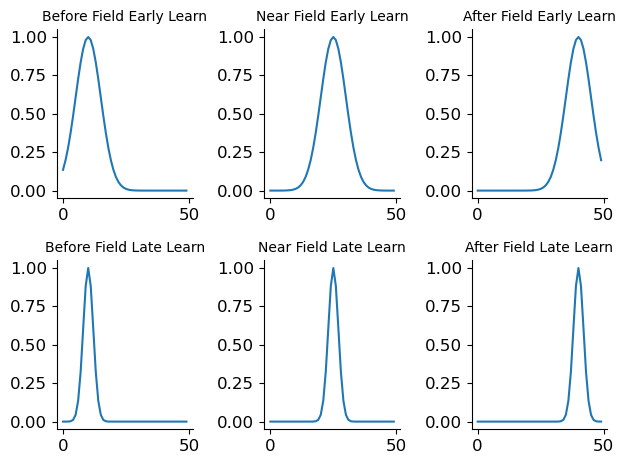

In [512]:
fig, axs = plt.subplots(2,3)

axs[0,0].plot(example_before_field)
axs[0,0].set_title("Before Field Early Learn", fontsize=10)

axs[0,1].plot(example_near_field)
axs[0,1].set_title("Near Field Early Learn", fontsize=10)

axs[0,2].plot(example_after_field)
axs[0,2].set_title("After Field Early Learn", fontsize=10)

 
axs[1,0].plot(example_before_field_late)
axs[1,0].set_title("Before Field Late Learn", fontsize=10)

axs[1,1].plot(example_near_field_late)
axs[1,1].set_title("Near Field Late Learn", fontsize=10)


axs[1,2].plot(example_after_field_late)
axs[1,2].set_title("After Field Late Learn", fontsize=10)

plt.tight_layout()
plt.show()

 
 
 


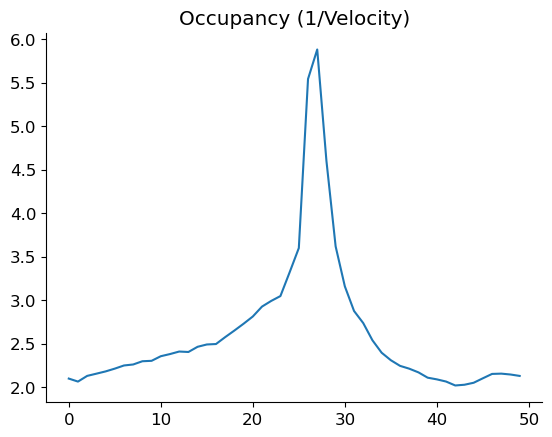

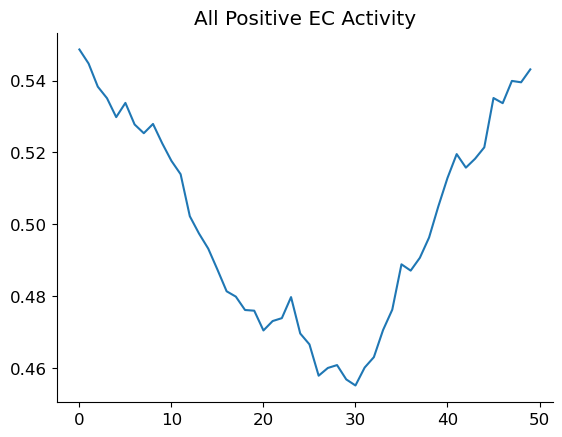

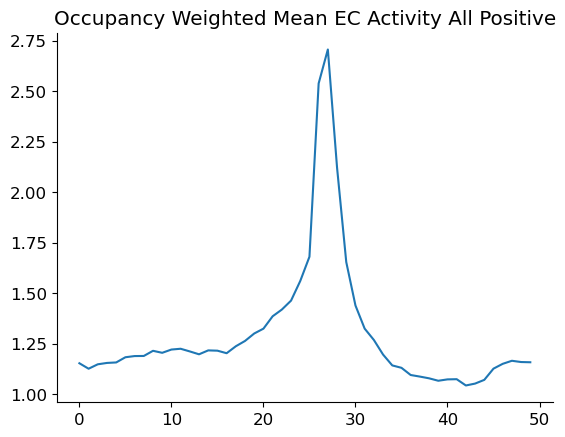

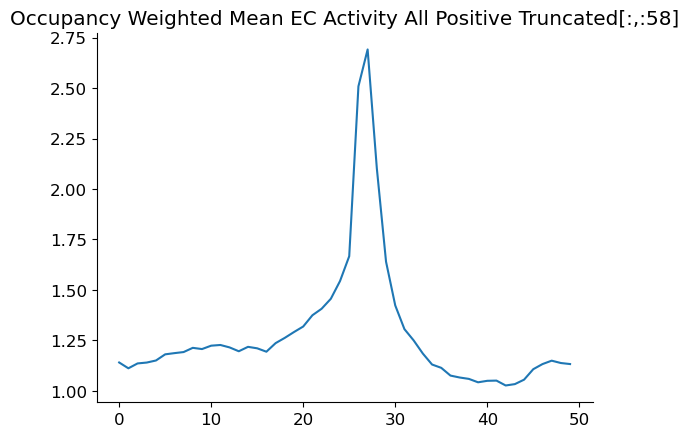

In [46]:
occupancy = 1/mean_new_average_vel_array
plt.plot(occupancy)
plt.title("Occupancy (1/Velocity)")
plt.show()

EC_list = []
EC_list_trunc = []

for animal in activity_dict_EC:
    for cell in activity_dict_EC[animal]:
        EC_list.append(np.mean(activity_dict_EC[animal][cell], axis=1))
        EC_list_trunc.append(np.mean(activity_dict_EC[animal][cell][:,:58], axis=1))
        
EC_array = np.array(EC_list)
mean_EC_array = np.mean(EC_array, axis=0) + 0.5

plt.plot(mean_EC_array)
plt.title("All Positive EC Activity")
plt.show()

mean_EC_array_occupancy_weighted = mean_EC_array * occupancy

plt.plot(mean_EC_array_occupancy_weighted)
plt.title("Occupancy Weighted Mean EC Activity All Positive")
plt.ylabel("Activity")
plt.xlabel("Position Bins")
plt.show()





EC_array_trunc = np.array(EC_list_trunc)
mean_EC_array_trunc = np.mean(EC_array_trunc, axis=0) + 0.5
mean_EC_array_occupancy_weighted = mean_EC_array_trunc * occupancy

plt.plot(mean_EC_array_occupancy_weighted)
plt.title("Occupancy Weighted Mean EC Activity All Positive Truncated[:,:58]")
plt.ylabel("Activity")
plt.xlabel("Position Bins")
plt.show()

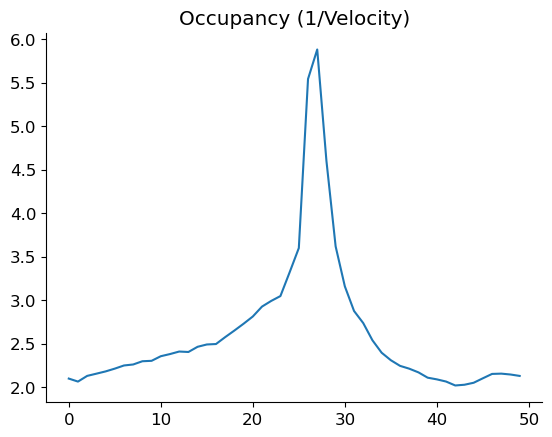

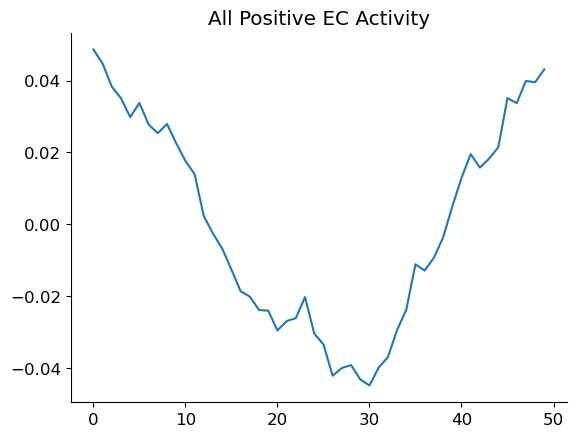

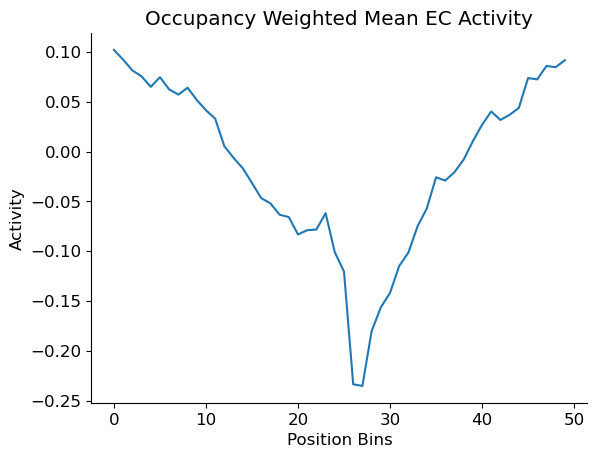

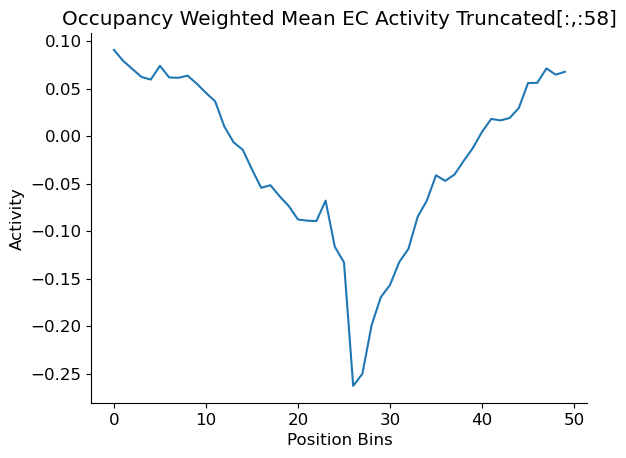

In [47]:
occupancy = 1/mean_new_average_vel_array
plt.plot(occupancy)
plt.title("Occupancy (1/Velocity)")
plt.show()

EC_list = []
EC_list_trunc = []

for animal in activity_dict_EC:
    for cell in activity_dict_EC[animal]:
        EC_list.append(np.mean(activity_dict_EC[animal][cell], axis=1))
        EC_list_trunc.append(np.mean(activity_dict_EC[animal][cell][:,:58], axis=1))
        
EC_array = np.array(EC_list)
mean_EC_array = np.mean(EC_array, axis=0)

plt.plot(mean_EC_array)
plt.title("All Positive EC Activity")
plt.show()

mean_EC_array_occupancy_weighted = mean_EC_array * occupancy

plt.plot(mean_EC_array_occupancy_weighted)
plt.title("Occupancy Weighted Mean EC Activity")
plt.ylabel("Activity")
plt.xlabel("Position Bins")
plt.show()





EC_array_trunc = np.array(EC_list_trunc)
mean_EC_array_trunc = np.mean(EC_array_trunc, axis=0) 
mean_EC_array_occupancy_weighted = mean_EC_array_trunc * occupancy

plt.plot(mean_EC_array_occupancy_weighted)
plt.title("Occupancy Weighted Mean EC Activity Truncated[:,:58]")
plt.ylabel("Activity")
plt.xlabel("Position Bins")
plt.show()

(4717,)
(50,)
(50,)


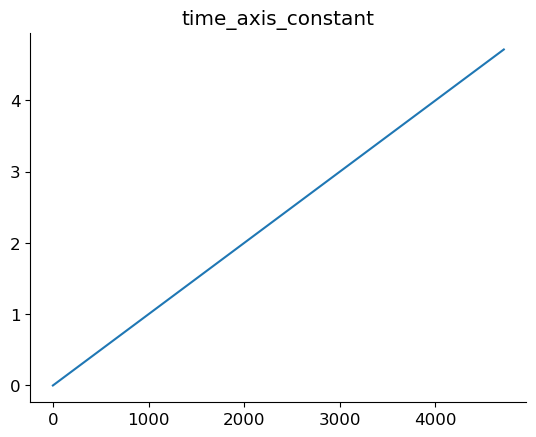

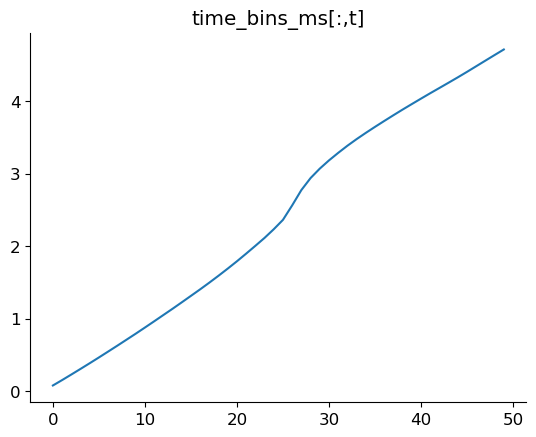

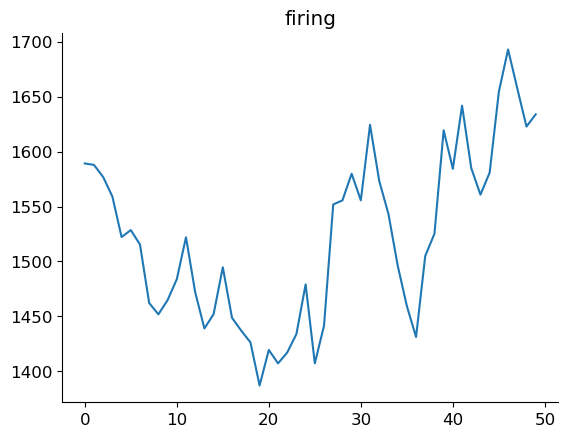

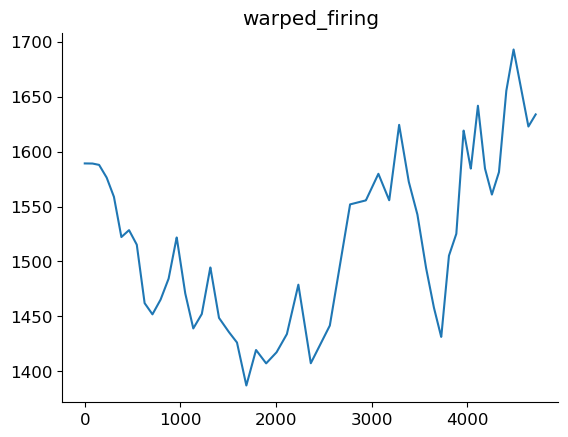

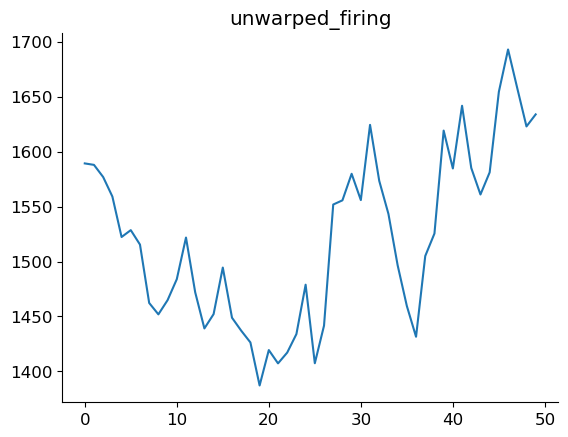

In [177]:
warped_firing = np.interp(time_axis_constant, time_bins_ms[:,t], firing)

print(time_axis_constant.shape)
print(firing.shape)
print(time_bins_ms[:,t].shape)

plt.plot(time_axis_constant)
plt.title("time_axis_constant")
plt.show()

plt.plot(time_bins_ms[:,t])
plt.title("time_bins_ms[:,t]")
plt.show()

plt.plot(firing)
plt.title("firing")
plt.show()

plt.plot(warped_firing)
plt.title("warped_firing")
plt.show()



unwarped_firing = np.interp(time_bins_ms[:,t], time_axis_constant, warped_firing)
                            
plt.plot(unwarped_firing)
plt.title("unwarped_firing")
plt.show()